# Setup environment

In [1]:
import os
import numpy as np
import pandas as pd
pd.set_option('display.precision', 10)
import matplotlib.pyplot as plt
from datetime import datetime
from pytz import timezone
import copy
import pathlib

from sklearn.metrics import mean_squared_error, mean_absolute_error, root_mean_squared_error, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split

from src.lightgbm_wrapper.feature_engineer import add_time_features, add_lag_features, add_rolling_features
from src.lightgbm_wrapper.plot import plot_1_data, plot_2_data
from src.lightgbm_wrapper.model import build_supervised_for_horizon, train_test_validation_split, train_lgbm_for_horizon, plot_timeseries_example

try:
    import lightgbm as lgb
except:
    print("lightgbm is not installed")

DATA_DIR = "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station"
STATION_IDS = [211, 212, 213, 214, 215, 216]

BASE_FEATURE_COLS = [
    "NO2_quantrac",
    "PM25_quantrac",
    "O3_quantrac",
    "CO_quantrac",
    "Temperature_quantrac",
    "Humid_quantrac",
]

# Define lag and rolling windows for feature engineering
LAG_STEPS = [3, 6, 12, 24]
ROLL_WINDOWS = [3, 6, 12, 24]

# Define horizon (= n_past = n_future)
HORIZONS = [1, 24, 48, 72]

# Directory to save the results and meta data
LIGHTGBM_DIR = f"/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/{datetime.now(timezone('Asia/Saigon')).strftime('%Y_%m_%d-%H_%M_%S')}"
pathlib.Path(LIGHTGBM_DIR).mkdir(parents=True, exist_ok=True)
print(LIGHTGBM_DIR)
with open(os.path.join(LIGHTGBM_DIR, "CONFIGURATIONS.txt"), "w") as f:
    f.write(f"BASE_FEATURE_COLS: {BASE_FEATURE_COLS}\n")
    f.write(f"LAG_STEPS: {LAG_STEPS}\n")
    f.write(f"ROLL_WINDOWS: {ROLL_WINDOWS}\n")
    f.write(f"HORIZONS: {HORIZONS}\n")

/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/2025_12_17-18_47_35


# Load dataset

In [2]:
def load_station_csv(station_id, data_dir=DATA_DIR):
    csv_path = os.path.join(data_dir, f"{station_id}.csv")
    df = pd.read_csv(csv_path)

    # Convert to datetime
    df["date"] = pd.to_datetime(df["date"])
    df = df.sort_values("date").reset_index(drop=True)

    # Remove unncessary column
    if "Unnamed: 0" in df.columns:
        df = df.drop(columns=["Unnamed: 0"])

    # Add station_id column
    df["station_id"] = station_id
    return df

# Load dataset
dfs = []
for sid in STATION_IDS:
    df_sid = load_station_csv(sid, DATA_DIR)
    dfs.append(df_sid)
df_all = pd.concat(dfs, ignore_index=True)

# Sort data by station then date
df_all = df_all.sort_values(["station_id", "date"]).reset_index(drop=True)

# Remove uncessary features
df_all = df_all.loc[:, ["date"] + BASE_FEATURE_COLS + ["station_id"]]

print(df_all.shape)
print(df_all.columns)
df_all

(92966, 8)
Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'station_id'],
      dtype='object')


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211
...,...,...,...,...,...,...,...,...
92961,2022-12-31 19:00:00,0.0882333333,41.4500000000,75.9166666667,2.0871666667,27.6900000000,67.2900000000,216
92962,2022-12-31 20:00:00,0.0832166667,50.5300000000,66.1166666667,2.0065000000,27.4016666667,68.0266666667,216
92963,2022-12-31 21:00:00,0.0843000000,55.0550000000,55.1333333333,2.4188333333,27.6033333333,66.9650000000,216
92964,2022-12-31 22:00:00,0.0666500000,26.0783333333,46.7500000000,1.4815000000,27.0366666667,63.3616666667,216


In [3]:
df_all.isnull().sum()

date                        0
NO2_quantrac            43684
PM25_quantrac           43043
O3_quantrac             47797
CO_quantrac             43760
Temperature_quantrac    52890
Humid_quantrac          52890
station_id                  0
dtype: int64

# Data preparation

## Drop missing

Output: df_dropped

In [4]:
df_dropped_na = df_all.dropna().reset_index(drop=True)

df_dropped = df_dropped_na.reset_index(drop=True)
df_dropped

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211
...,...,...,...,...,...,...,...,...
38704,2022-12-31 19:00:00,0.0882333333,41.4500000000,75.9166666667,2.0871666667,27.6900000000,67.2900000000,216
38705,2022-12-31 20:00:00,0.0832166667,50.5300000000,66.1166666667,2.0065000000,27.4016666667,68.0266666667,216
38706,2022-12-31 21:00:00,0.0843000000,55.0550000000,55.1333333333,2.4188333333,27.6033333333,66.9650000000,216
38707,2022-12-31 22:00:00,0.0666500000,26.0783333333,46.7500000000,1.4815000000,27.0366666667,63.3616666667,216


## Visualization

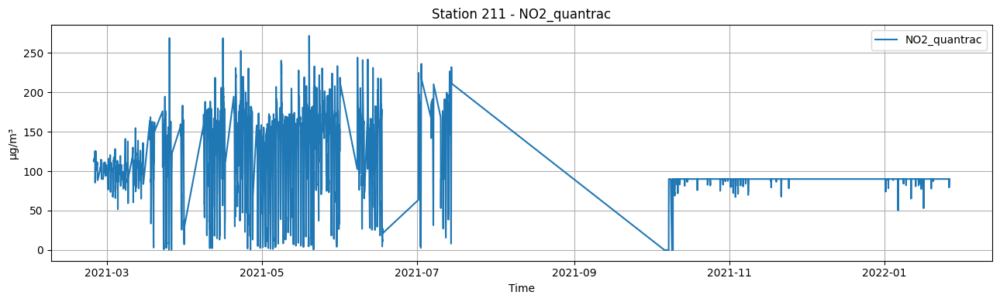

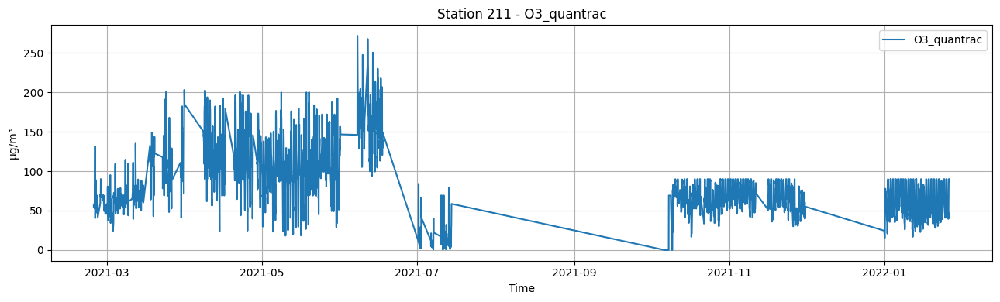

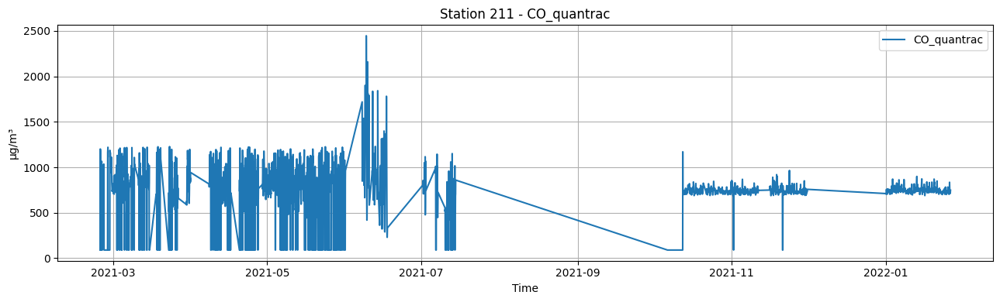

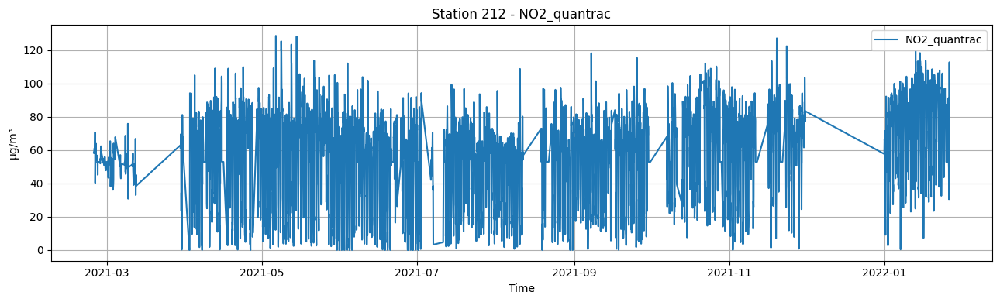

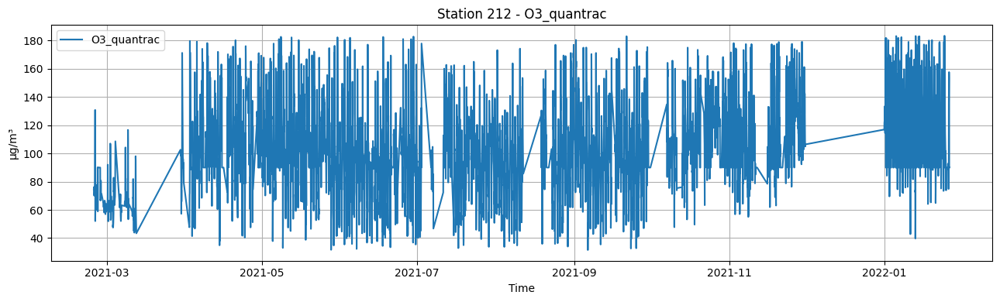

...

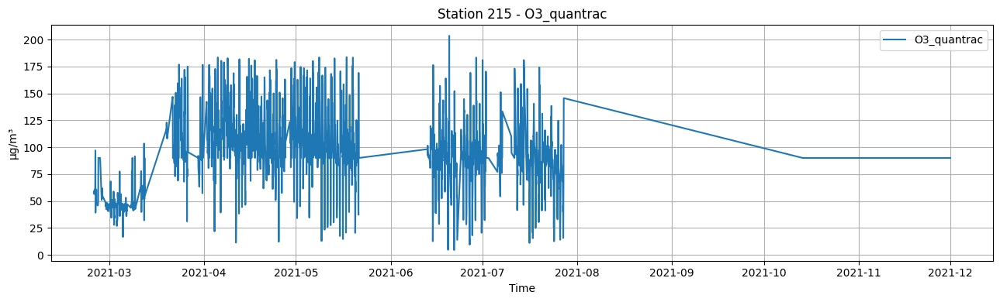

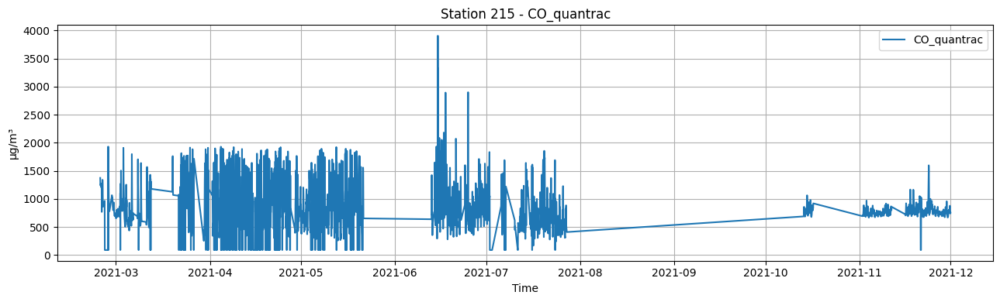

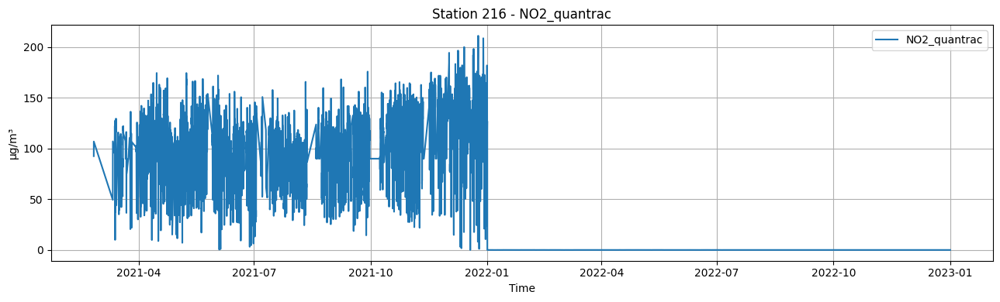

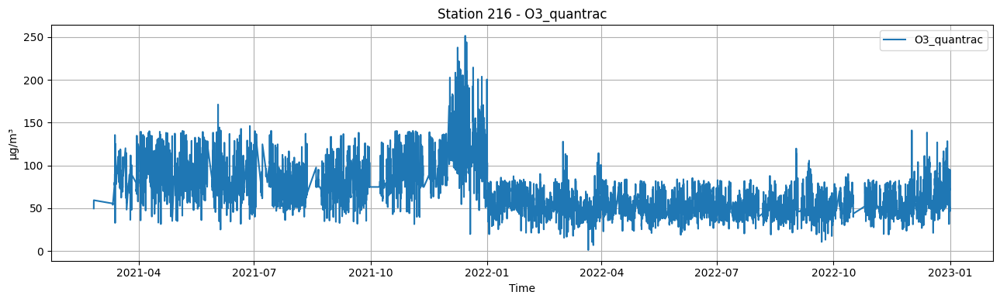

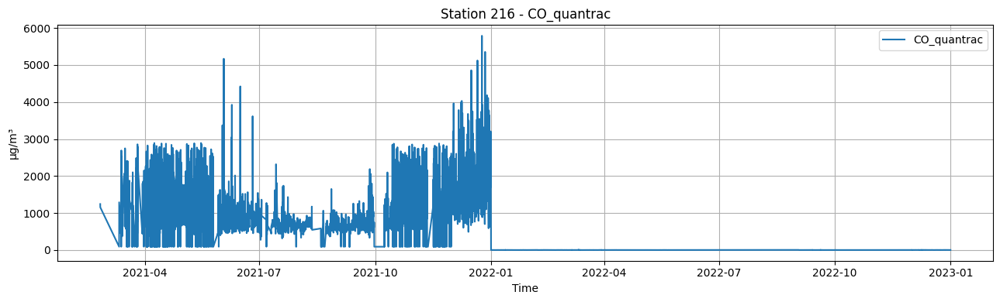

In [5]:
for station in STATION_IDS:
    df_station = df_dropped[df_dropped["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_1_data(df_station, target_col, target_col, df_station["date"], f"Station {station} - {target_col}")
            #plot_1_data(df_station, target_col, target_col, df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Convert ppm to ug/m3

Apply only to station 216, year 2022 on NO2, CO columns

Output: df_converted

In [6]:
df_converted = copy.deepcopy(df_dropped)
mask = (df_converted["station_id"] == 216) & (df_converted["date"] >= "2022-01-01")
df_converted.loc[mask, "NO2_quantrac"] = df_converted.loc[mask, "NO2_quantrac"].apply(lambda x: x * 1883.2)
df_converted.loc[mask, "CO_quantrac"] = df_converted.loc[mask, "CO_quantrac"].apply(lambda x: x * 1146.8)
df_converted

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211
...,...,...,...,...,...,...,...,...
38704,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216
38705,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216
38706,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216
38707,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216


## Visualization after converting unit

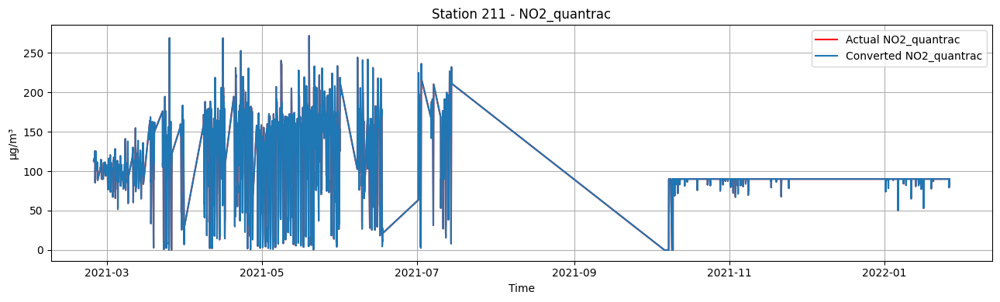

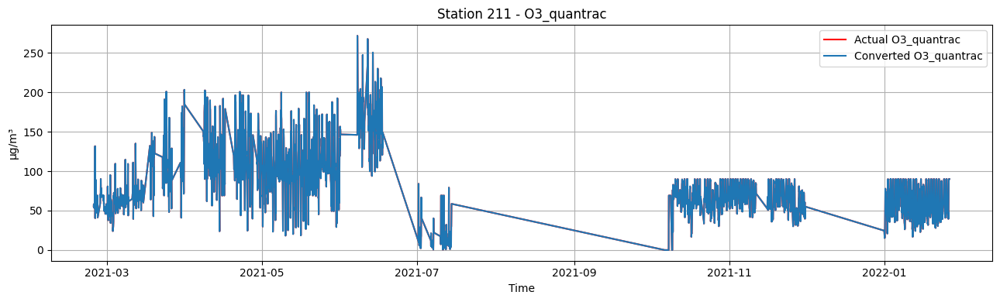

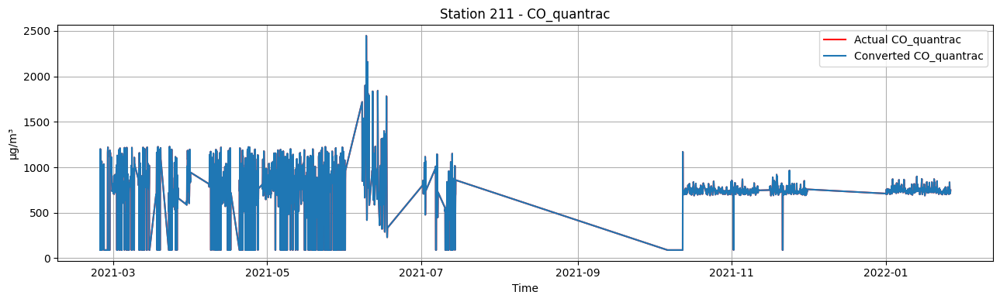

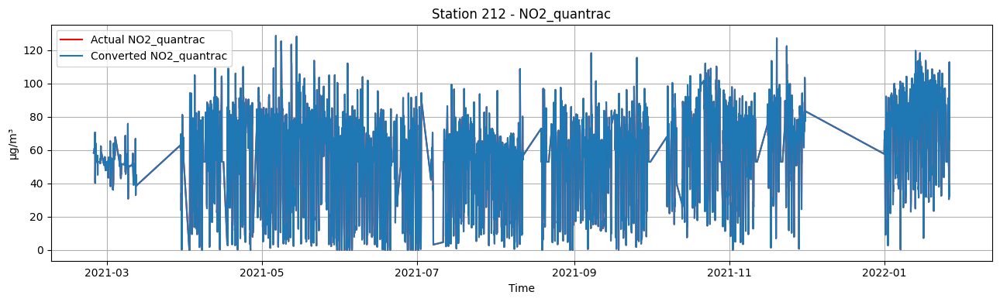

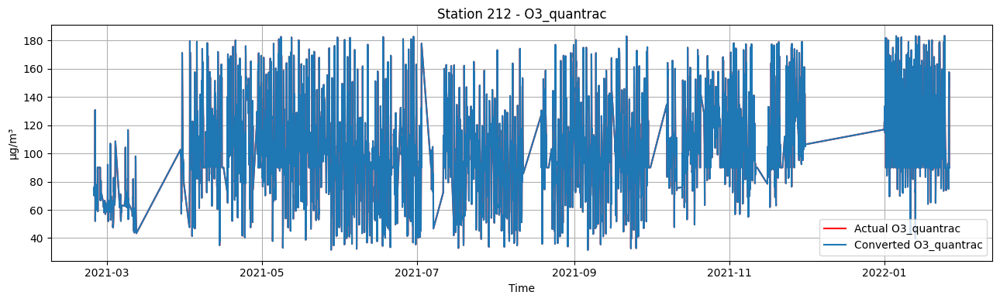

...

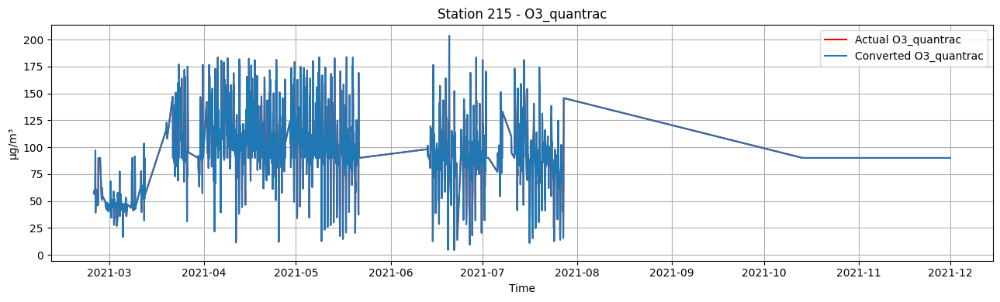

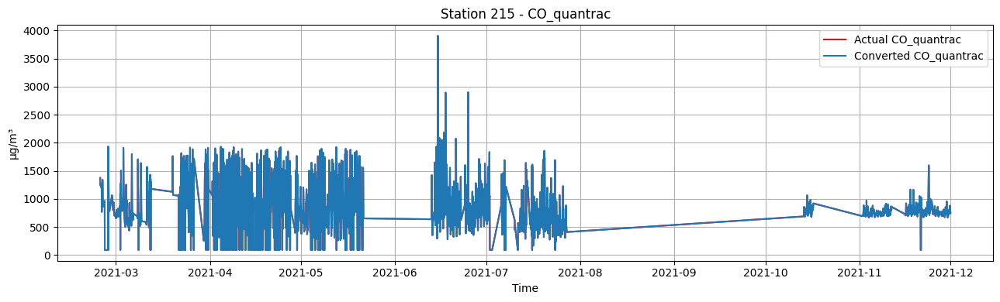

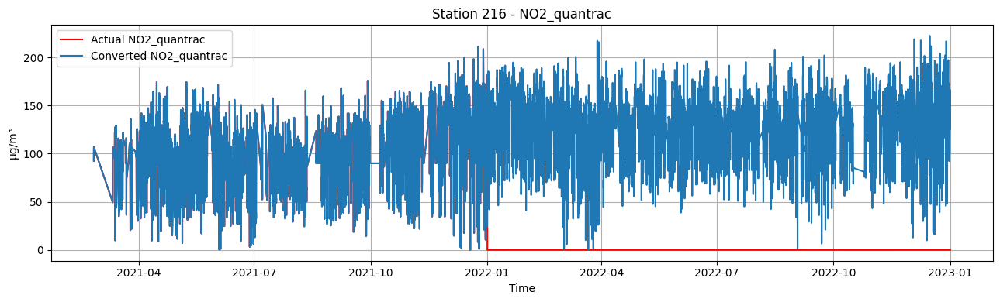

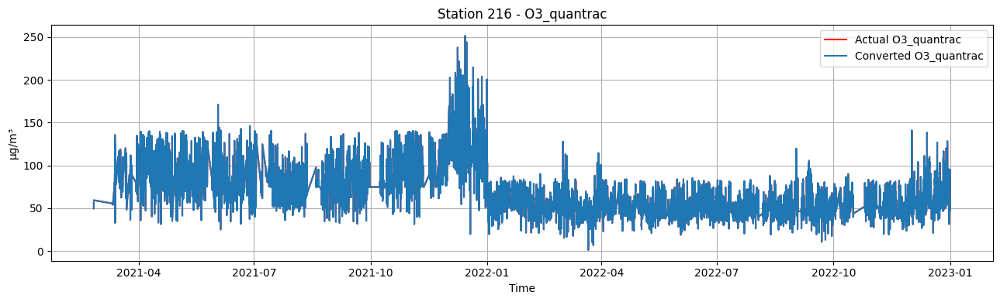

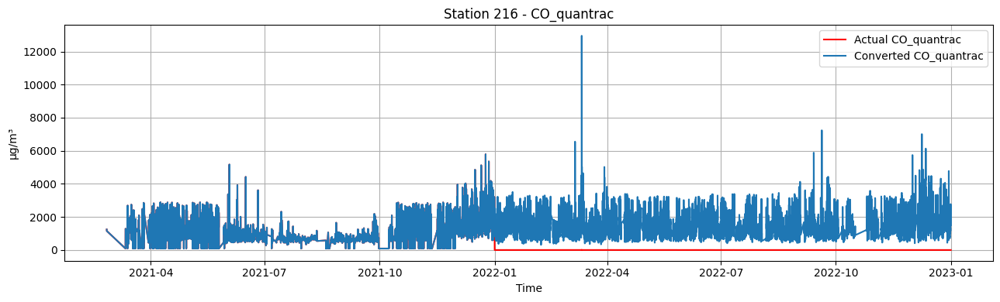

In [7]:
for station in STATION_IDS:
    df_station = df_dropped[df_dropped["station_id"] == station]
    df_station_converted = df_converted[df_converted["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_2_data(df_station, target_col, f"Actual {target_col}",
                        df_station_converted, target_col, f"Converted {target_col}",
                        df_station["date"], f"Station {station} - {target_col}")
                        #df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Ugly hack to remove outliers

In [8]:
test = copy.deepcopy(df_converted)

lenbefore = len(test)
print(f"Before: {lenbefore} records")

# 212 CO quantrac
test212 = test[test["station_id"] == 212]
test = test.drop(index=test212[test212["CO_quantrac"] > 4000].index)

# 213 CO quantrac
test213 = test[test["station_id"] == 213]
test = test.drop(index=test213[test213["CO_quantrac"] > 4000].index)

# 214 CO quantrac
test214 = test[test["station_id"] == 214]
test = test.drop(index=test214[test214["CO_quantrac"] > 4000].index)

# 215 NO2 quantrac
# 215 CO quantrac
test215 = test[test["station_id"] == 215]
test = test.drop(index=test215[test215["NO2_quantrac"] > 140].index)
test = test.drop(index=test215[test215["CO_quantrac"] > 2500].index)

# 216 CO quantrac
test216 = test[test["station_id"] == 216]
test = test.drop(index=test216[test216["CO_quantrac"] > 10000].index)

lenafter = len(test)
print(f"After: {lenafter} records")
print(f"Removed {lenbefore - lenafter} records")

df_converted = test.reset_index(drop=True)

Before: 38709 records
After: 38692 records
Removed 17 records


## Visualization after removing outliers

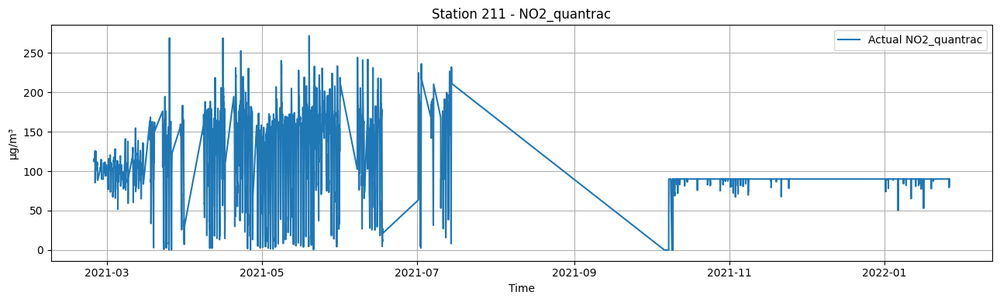

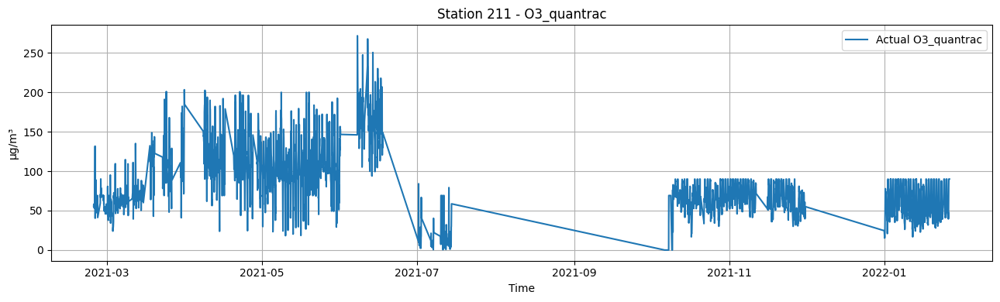

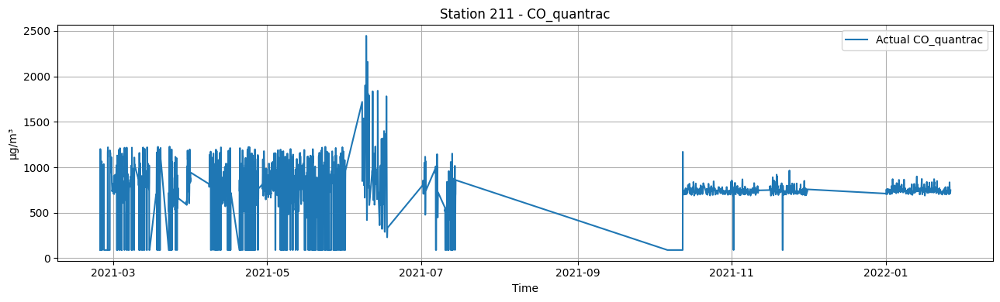

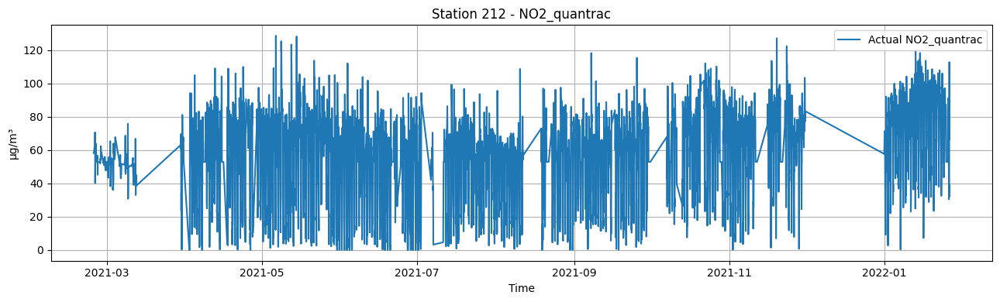

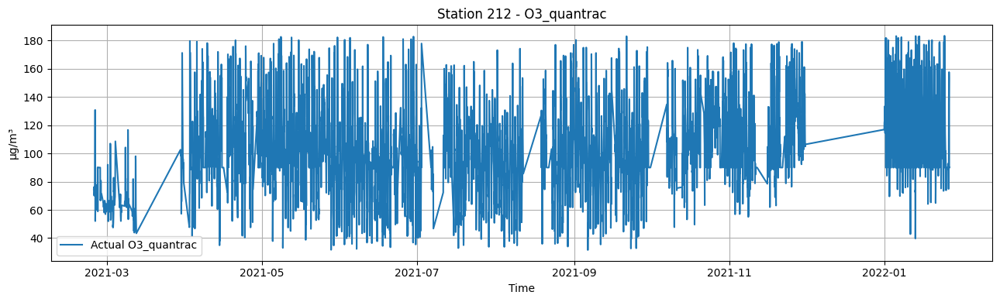

...

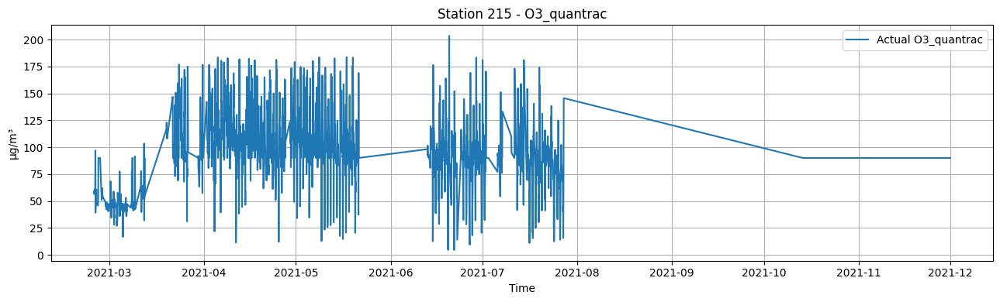

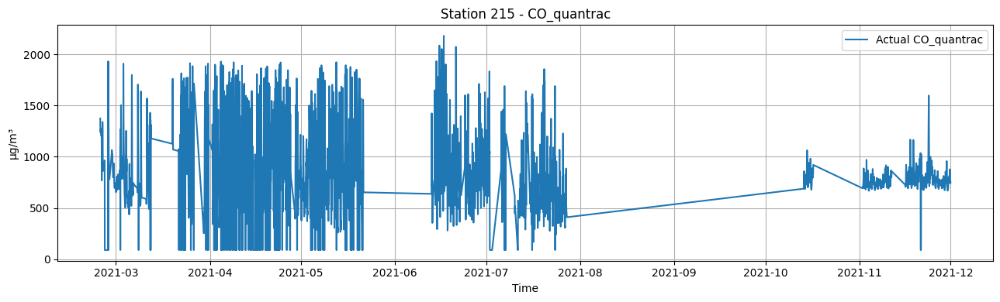

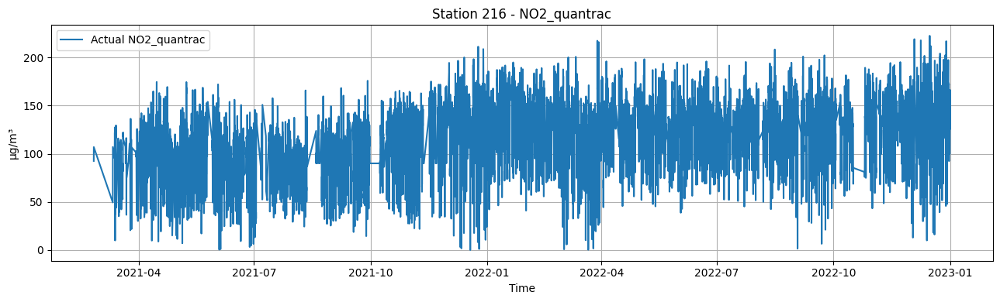

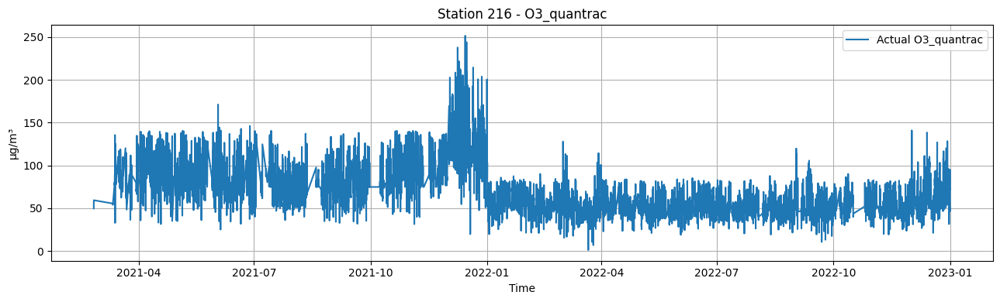

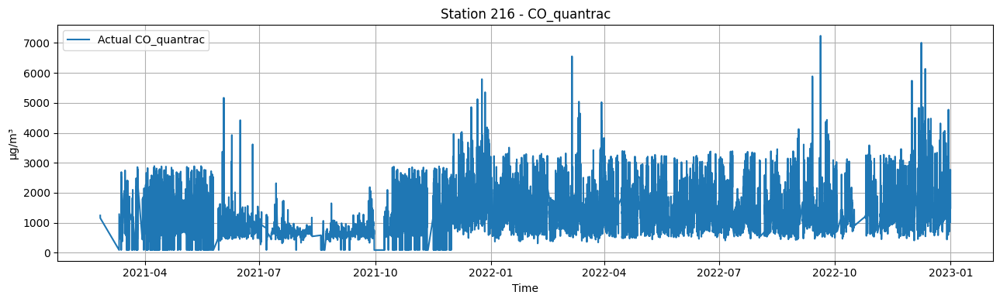

In [9]:
for station in STATION_IDS:
    df_station = df_converted[df_converted["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_1_data(df_station, target_col, f"Actual {target_col}",
                        df_station["date"], f"Station {station} - {target_col}")
                        #df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Feature engineering

In [10]:
# Add time features and lag feature for all gases
dftestno2 = add_time_features(df_converted)
dftestno2 = add_lag_features(dftestno2, group_col="station_id", target_cols=BASE_FEATURE_COLS, lag_steps=[3, 6, 12, 24])
dftestno2 = add_rolling_features(dftestno2, group_col="station_id", target_cols=["NO2_quantrac"], windows=[3, 6, 12, 24])
print(dftestno2.shape)
print(dftestno2.columns)
dftestno2

(38692, 43)
Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'station_id', 'hour',
       'dayofweek', 'month', 'NO2_quantrac_lag3', 'NO2_quantrac_lag6',
       'NO2_quantrac_lag12', 'NO2_quantrac_lag24', 'PM25_quantrac_lag3',
       'PM25_quantrac_lag6', 'PM25_quantrac_lag12', 'PM25_quantrac_lag24',
       'O3_quantrac_lag3', 'O3_quantrac_lag6', 'O3_quantrac_lag12',
       'O3_quantrac_lag24', 'CO_quantrac_lag3', 'CO_quantrac_lag6',
       'CO_quantrac_lag12', 'CO_quantrac_lag24', 'Temperature_quantrac_lag3',
       'Temperature_quantrac_lag6', 'Temperature_quantrac_lag12',
       'Temperature_quantrac_lag24', 'Humid_quantrac_lag3',
       'Humid_quantrac_lag6', 'Humid_quantrac_lag12', 'Humid_quantrac_lag24',
       'NO2_quantrac_roll3_mean', 'NO2_quantrac_roll3_std',
       'NO2_quantrac_roll6_mean', 'NO2_quantrac_roll6_std',
       'NO2_quantrac_roll12_mean', 'NO2_quantrac_roll12_std',
       'NO2_quantrac

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,Humid_quantrac_lag12,Humid_quantrac_lag24,NO2_quantrac_roll3_mean,NO2_quantrac_roll3_std,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,NaN,NaN,112.7407619000,NaN,112.7407619000,NaN,112.7407619000,NaN,112.7407619000,NaN
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,NaN,NaN,112.5536162500,0.2646639164,112.5536162500,0.2646639164,112.5536162500,0.2646639164,112.5536162500,0.2646639164
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,NaN,NaN,112.6025552667,0.2054472593,112.6025552667,0.2054472593,112.6025552667,0.2054472593,112.6025552667,0.2054472593
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,NaN,NaN,112.5159235333,0.1697189071,112.5721331250,0.1784406841,112.5721331250,0.1784406841,112.5721331250,0.1784406841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,68.0600000000,71.9266666667,147.2034666667,18.8622115885,127.0113777778,25.4786255264,130.9242488889,19.6848721122,137.2270974346,24.3389891274
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,66.5483333333,72.9183333333,160.5741866667,6.5995644704,138.1065644444,25.6434745913,132.8885311111,21.9952138696,137.0636252124,24.1209076873
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,64.6833333333,78.1200000000,161.7145688889,4.7480395477,146.1834000000,21.6863628929,133.9504466667,22.8691412366,136.3835807679,23.2780210582
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,61.6400000000,82.1033333333,160.5428000000,4.9712952838,153.8731333333,14.3380635114,135.2451466667,23.8597941057,135.8343141013,22.5466882334


## Build supervised from time-series

In [11]:
# Example
Xdummy, ydummy = build_supervised_for_horizon(dftestno2, horizon_h=1, target_col="NO2_quantrac")
print("Horizon 1h:", Xdummy.shape, ydummy.shape)
print(Xdummy.columns)
print(ydummy.columns)
display(Xdummy)
display(ydummy)

Horizon 1h: (38542, 42) (38542, 3)
Index(['date', 'station_id', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'hour', 'dayofweek', 'month',
       'NO2_quantrac_lag3', 'NO2_quantrac_lag6', 'NO2_quantrac_lag12',
       'NO2_quantrac_lag24', 'PM25_quantrac_lag3', 'PM25_quantrac_lag6',
       'PM25_quantrac_lag12', 'PM25_quantrac_lag24', 'O3_quantrac_lag3',
       'O3_quantrac_lag6', 'O3_quantrac_lag12', 'O3_quantrac_lag24',
       'CO_quantrac_lag3', 'CO_quantrac_lag6', 'CO_quantrac_lag12',
       'CO_quantrac_lag24', 'Temperature_quantrac_lag3',
       'Temperature_quantrac_lag6', 'Temperature_quantrac_lag12',
       'Temperature_quantrac_lag24', 'Humid_quantrac_lag3',
       'Humid_quantrac_lag6', 'Humid_quantrac_lag12', 'Humid_quantrac_lag24',
       'NO2_quantrac_roll3_mean', 'NO2_quantrac_roll3_std',
       'NO2_quantrac_roll6_mean', 'NO2_quantrac_roll6_std',
       'NO2_quantrac_roll12_mean', 'NO2_quantrac_roll12_std',
       'NO2_q

,date,station_id,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,hour,dayofweek,month,...,Humid_quantrac_lag12,Humid_quantrac_lag24,NO2_quantrac_roll3_mean,NO2_quantrac_roll3_std,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std
0,2021-02-24 21:00:00,211,15.7116666700,55.9127833300,896.5540000000,27.8000000000,66.0550000000,21,2,2,...,66.7750000000,63.1880952400,112.4076778000,1.4743445750,110.9782539833,8.7910802916,108.7458061667,11.6703996987,111.2911683250,8.5276176290
1,2021-02-24 22:00:00,211,15.6533333300,53.4917500000,931.1250000000,27.8000000000,66.2716666700,22,2,2,...,65.9777777800,63.7735294100,112.4285889000,1.4743445750,112.9722778000,7.1361384153,108.1629089417,11.2547508374,111.2790324125,8.5256720042
2,2021-02-24 23:00:00,211,15.5950000000,50.6454000000,934.5630000000,27.8000000000,66.2166666700,23,2,2,...,58.9833333300,64.2050000000,111.3098444333,1.0078092718,114.2321722333,5.4976888124,106.9186978250,9.9132556170,111.2027683583,8.5237078586
3,2021-02-25 00:00:00,211,15.1866666700,51.4960333300,1004.0870000000,27.7966666700,66.3783333300,0,3,2,...,60.9383333300,64.7350000000,111.3516666667,0.9874274584,111.8796722333,1.2625489371,109.0581658833,7.2617421674,111.1348072500,8.5177478315
4,2021-02-25 01:00:00,211,15.3450000000,51.6269000000,1024.5240000000,27.7800000000,66.4683333300,1,3,2,...,62.8400000000,65.1883333300,110.4420333333,0.6792893386,111.4353111167,1.4959850529,110.0305325500,6.3819593962,111.0197961375,8.5174176826
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38537,2022-12-31 18:00:00,216,36.6416666667,85.6000000000,1687.5162000000,28.1816666667,64.2983333333,18,5,12,...,68.1783333333,67.1500000000,130.6522311111,20.7255962061,118.6259066667,19.0129302674,128.6670244444,17.1541920845,136.7144485457,23.9144727000
38538,2022-12-31 19:00:00,216,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,19,5,12,...,68.0600000000,71.9266666667,147.2034666667,18.8622115885,127.0113777778,25.4786255264,130.9242488889,19.6848721122,137.2270974346,24.3389891274
38539,2022-12-31 20:00:00,216,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,20,5,12,...,66.5483333333,72.9183333333,160.5741866667,6.5995644704,138.1065644444,25.6434745913,132.8885311111,21.9952138696,137.0636252124,24.1209076873
38540,2022-12-31 21:00:00,216,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,21,5,12,...,64.6833333333,78.1200000000,161.7145688889,4.7480395477,146.1834000000,21.6863628929,133.9504466667,22.8691412366,136.3835807679,23.2780210582


,date,station_id,NO2_quantrac_t_plus_1h
0,2021-02-24 21:00:00,211,110.5361333000
1,2021-02-24 22:00:00,211,111.0693667000
2,2021-02-24 23:00:00,211,109.7206000000
3,2021-02-25 00:00:00,211,108.5600333000
4,2021-02-25 01:00:00,211,110.3479333000
...,...,...,...
38537,2022-12-31 18:00:00,216,166.1610133333
38538,2022-12-31 19:00:00,216,156.7136266667
38539,2022-12-31 20:00:00,216,158.7537600000
38540,2022-12-31 21:00:00,216,125.5152800000


## Split train/validation/test for each station

In [12]:
# Example
(X_train_dummy, y_train_dummy, meta_train_dummy,
 X_val_dummy, y_val_dummy, meta_val_dummy,
 X_test_dummy, y_test_dummy, meta_test_dummy) = train_test_validation_split(Xdummy, ydummy)
display(X_test_dummy)
display(y_test_dummy)

,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,hour,dayofweek,month,NO2_quantrac_lag3,NO2_quantrac_lag6,...,Humid_quantrac_lag12,Humid_quantrac_lag24,NO2_quantrac_roll3_mean,NO2_quantrac_roll3_std,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std
3329,26.1833333300,35.8462000004,741.5384000000,24.0700000000,81.9216666700,4,6,1,90.0000000000,90.0000000000,...,52.3000000000,72.3500000000,90.0000000000,0.0000000000,90.0000000000,0.0000000000,89.4493298596,1.9075773226,86.8322370720,5.8590313167
3330,14.0833333300,20.8097354148,725.9719000000,23.6400000000,80.2966666700,5,6,1,90.0000000000,90.0000000000,...,66.3183333300,73.9616666700,90.0000000000,0.0000000000,90.0000000000,0.0000000000,90.0000000000,0.0000000000,86.8322370720,5.8590313167
3331,15.4000000000,21.1161272138,738.6734000000,23.5500000000,79.6700000000,6,6,1,90.0000000000,90.0000000000,...,72.0383333300,75.9416666700,90.0000000000,0.0000000000,90.0000000000,0.0000000000,90.0000000000,0.0000000000,86.8322370720,5.8590313167
3332,20.7166666700,30.0598503566,757.8498000000,23.9883333300,80.2866666700,7,6,1,90.0000000000,90.0000000000,...,74.3400000000,73.3550000000,90.0000000000,0.0000000000,90.0000000000,0.0000000000,90.0000000000,0.0000000000,86.8322370720,5.8590313167
3333,21.9166666700,51.8978718504,749.9997000000,26.6766666700,72.2516666700,8,6,1,90.0000000000,90.0000000000,...,75.5816666700,65.5216666700,90.0000000000,0.0000000000,90.0000000000,0.0000000000,90.0000000000,0.0000000000,86.8322370720,5.8590313167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38537,36.6416666667,85.6000000000,1687.5162000000,28.1816666667,64.2983333333,18,5,12,112.6153600000,111.9562400000,...,68.1783333333,67.1500000000,130.6522311111,20.7255962061,118.6259066667,19.0129302674,128.6670244444,17.1541920845,136.7144485457,23.9144727000
38538,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,19,5,12,126.0488533333,99.5898933333,...,68.0600000000,71.9266666667,147.2034666667,18.8622115885,127.0113777778,25.4786255264,130.9242488889,19.6848721122,137.2270974346,24.3389891274
38539,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,20,5,12,153.2924800000,108.2526133333,...,66.5483333333,72.9183333333,160.5741866667,6.5995644704,138.1065644444,25.6434745913,132.8885311111,21.9952138696,137.0636252124,24.1209076873
38540,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,21,5,12,162.2690666667,112.6153600000,...,64.6833333333,78.1200000000,161.7145688889,4.7480395477,146.1834000000,21.6863628929,133.9504466667,22.8691412366,136.3835807679,23.2780210582


,NO2_quantrac_t_plus_1h
3329,90.0000000000
3330,90.0000000000
3331,90.0000000000
3332,90.0000000000
3333,90.0000000000
...,...
38537,166.1610133333
38538,156.7136266667
38539,158.7537600000
38540,125.5152800000


# LightGBM model

In [13]:
#model_h, metrics_overall, metrics_by_station, (X_train, y_train, X_val, y_val, X_test, y_test, meta_test) = train_lgbm_for_horizon(df_no2, horizon_h=h, target_col=label)

In [14]:
'''
sid = 212

mask = (meta_test_dummy["station_id"] == sid)
meta_test_sid = meta_test_dummy[mask]
y_test_sid = y_test_dummy[mask]
y_pred_sid = 0

print(meta_test_sid)

def mnbe_avg(y_test_sid, y_pred_sid, meta_test_sid):
    threshold = 10
    uniq_date = list(meta_test_sid["date"].apply(lambda x: x.date()).unique())
    label = y_test_sid.columns[0]
    resampled_y_test = {"date": [], label: []}
    resampled_y_pred = {"date": [], label: []}
    for d in uniq_date:
        current_date_meta_test_sid = meta_test_sid[meta_test_sid["date"].dt.date == d]
        current_date_y_test_sid = y_test_sid.loc[current_date_meta_test_sid.index]
        current_date_y_pred_sid = y_pred_sid.loc[current_date_meta_test_sid.index]
        assert len(current_date_y_test_sid) == len(current_date_y_pred_sid), "current_date_y_test_sid is not equal to current_date_y_pred_sid"
        current_date_num_records = len(current_date_meta_test_sid)
        print(f"Current date = {d}, number of records = {current_date_num_records}")
        if current_date_num_records >= threshold:
            resampled_y_test["date"].append(d)
            resampled_y_test[label].append(current_date_y_test_sid[label].mean())
            resampled_y_pred[label].append(current_date_y_pred_sid[label].mean())
    resampled_y_test = pd.DataFrame(resampled_y_test)
    resampled_y_pred = pd.DataFrame(resampled_y_pred)
    
    return np.mean((resampled_y_test - resampled_y_pred) / resampled_y_test)

mnbe = mnbe_avg(y_test_sid, y_pred_sid, meta_test_sid)
print(mnbe)
'''

'\nsid = 212\n\nmask = (meta_test_dummy["station_id"] == sid)\nmeta_test_sid = meta_test_dummy[mask]\ny_test_sid = y_test_dummy[mask]\ny_pred_sid = 0\n\nprint(meta_test_sid)\n\ndef mnbe_avg(y_test_sid, y_pred_sid, meta_test_sid):\n    threshold = 10\n    uniq_date = list(meta_test_sid["date"].apply(lambda x: x.date()).unique())\n    label = y_test_sid.columns[0]\n    resampled_y_test = {"date": [], label: []}\n    resampled_y_pred = {"date": [], label: []}\n    for d in uniq_date:\n        current_date_meta_test_sid = meta_test_sid[meta_test_sid["date"].dt.date == d]\n        current_date_y_test_sid = y_test_sid.loc[current_date_meta_test_sid.index]\n        current_date_y_pred_sid = y_pred_sid.loc[current_date_meta_test_sid.index]\n        assert len(current_date_y_test_sid) == len(current_date_y_pred_sid), "current_date_y_test_sid is not equal to current_date_y_pred_sid"\n        current_date_num_records = len(current_date_meta_test_sid)\n        print(f"Current date = {d}, number of

## Add time and lags features

In [15]:
# Add time features and lag feature for all gases
df_time_feats = add_time_features(df_converted)
df_lag_feats = add_lag_features(df_time_feats, group_col="station_id", target_cols=BASE_FEATURE_COLS, lag_steps=LAG_STEPS)

## Training for NO2

In [16]:
label = "NO2_quantrac"

# Add rolling features for LABEL
df_no2 = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Start running model
no2_all_metrics = []
no2_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_no2, horizon_h=h, target_col=label)
    no2_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    no2_all_metrics.append(metrics_by_station)

# Metrics table
no2_df_metrics_all = pd.concat(no2_all_metrics, ignore_index=True)
no2_df_metrics_all = no2_df_metrics_all.sort_values(["station", "horizon_h"]).reset_index(drop=True)
no2_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
no2_df_metrics_all


===== Training LightGBM for horizon = 1h, target_col = NO2_quantrac =====

X.shape = (38542, 42)
y.shape = (38542, 3)

Number of features: 42

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
NO2_quantrac_roll3_mean
NO2_quantrac_roll3_std
NO2_quantrac_roll6_mean
NO2_quantrac_roll6_std
NO2_quantrac_roll12_mean
NO2_quantrac_roll12_std
NO2_quantrac_roll24_mean
NO2_quantrac_roll24_std

Label:
date
station_id
NO2_quantrac_t_plus_1h

X_train.shape: 

,date,target
0,2022-01-02,89.1555315844
1,2022-01-03,90.0000000000
2,2022-01-04,89.9384786957
3,2022-01-05,90.0000000000
4,2022-01-06,88.2903867585
5,2022-01-07,90.0000000000
6,2022-01-08,89.5619537858
7,2022-01-09,89.3604280386
8,2022-01-10,90.0000000000
9,2022-01-11,87.7334059784


,date,target
0,2022-01-02,89.8444232583
1,2022-01-03,91.4023901224
2,2022-01-04,91.9486317274
3,2022-01-05,91.7684081293
4,2022-01-06,92.3206259501
5,2022-01-07,90.6235044916
6,2022-01-08,91.1903383123
7,2022-01-09,89.7203147856
8,2022-01-10,92.6652851455
9,2022-01-11,89.5703927389


sid = 212, grp =                     date  station_id          y_true         y_pred
8869 2021-11-19 09:00:00         212    6.9947666670  16.9445383525
8870 2021-11-19 10:00:00         212   15.2755666700  26.3511670628
8871 2021-11-19 11:00:00         212   18.9454666700  16.7941751408
8872 2021-11-19 12:00:00         212   27.3517333300  21.9653794844
8873 2021-11-19 13:00:00         212   45.0739000000  32.8838786338
...                  ...         ...             ...            ...
9739 2022-01-26 11:00:00         212   39.4906333300  26.6510835115
9740 2022-01-26 12:00:00         212   32.0881000000  28.1694546899
9741 2022-01-26 13:00:00         212   55.1739666700  22.8148075760
9742 2022-01-26 14:00:00         212  112.7631667000  46.7476694210
9743 2022-01-26 15:00:00         212   66.4261521997  94.6968841542

[875 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(

,date,target
0,2021-11-19,63.9963644431
1,2021-11-20,80.6267998571
2,2021-11-21,56.9423845343
3,2021-11-23,76.9806051246
4,2021-11-24,67.7291059379
5,2021-11-25,67.7936699283
6,2021-11-26,54.1290871168
7,2021-11-27,64.9021400388
8,2021-11-28,62.9656089087
9,2021-11-29,69.5948367342


,date,target
0,2021-11-19,62.3407926900
1,2021-11-20,73.3282938287
2,2021-11-21,61.5433120710
3,2021-11-23,72.2560842811
4,2021-11-24,66.0137981575
5,2021-11-25,64.7919860243
6,2021-11-26,61.1384568029
7,2021-11-27,66.1011089881
8,2021-11-28,63.4749382330
9,2021-11-29,66.6291672414


sid = 213, grp =                      date  station_id        y_true         y_pred
14768 2021-12-20 13:00:00         213  17.000733330  45.4087354632
14769 2021-12-20 14:00:00         213  23.995500000  58.4132841593
14770 2021-12-20 15:00:00         213  40.494366670  59.6334552108
14771 2021-12-20 16:00:00         213   6.681100000  70.9322643774
14772 2021-12-20 17:00:00         213  41.058966670  47.0734823730
...                   ...         ...           ...            ...
15650 2022-01-26 11:00:00         213  12.515300000  26.8394691899
15651 2022-01-26 12:00:00         213   8.249433333  23.4061681910
15652 2022-01-26 13:00:00         213  10.100066670  24.3051446015
15653 2022-01-26 14:00:00         213  52.727366670  46.6507120192
15654 2022-01-26 15:00:00         213  81.060428570  68.5306141806

[887 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23), datetime.date(2021, 12, 24

,date,target
0,2021-12-20,55.6815363673
1,2021-12-21,71.0710407932
2,2021-12-22,74.7910255633
3,2021-12-23,52.4447122413
4,2021-12-24,60.1148074675
5,2021-12-25,69.1498324612
6,2021-12-26,63.1175085451
7,2021-12-27,70.2495448313
8,2021-12-28,83.7546399952
9,2021-12-29,69.7778303471


,date,target
0,2021-12-20,63.9040525214
1,2021-12-21,66.5161586396
2,2021-12-22,73.3017569331
3,2021-12-23,59.6339006493
4,2021-12-24,59.0535134322
5,2021-12-25,65.6814368528
6,2021-12-26,65.5805894843
7,2021-12-27,64.5108256114
8,2021-12-28,81.0913933462
9,2021-12-29,81.9813762258


sid = 214, grp =                      date  station_id        y_true         y_pred
20825 2021-11-23 09:00:00         214   29.76696667  40.2924366546
20826 2021-11-23 10:00:00         214   15.22403571  43.9651498697
20827 2021-11-23 11:00:00         214   28.27825641  44.3063145481
20828 2021-11-23 12:00:00         214   48.52423333  48.7162596240
20829 2021-11-23 13:00:00         214   94.35093333  33.9674644930
...                   ...         ...           ...            ...
21733 2021-12-31 18:00:00         214  121.67130000  89.5222226816
21734 2021-12-31 19:00:00         214  106.30163330  88.6363743725
21735 2021-12-31 20:00:00         214   53.21877778  93.2227478242
21736 2021-12-31 21:00:00         214   62.26283333  66.1812650216
21737 2021-12-31 22:00:00         214   69.47716667  65.3724334908

[913 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11, 26), datetime.date(2021, 11, 27

,date,target
0,2021-11-23,86.9275498863
1,2021-11-24,72.2917524911
2,2021-11-25,64.5454832237
3,2021-11-26,60.9871078221
4,2021-11-27,68.8999328696
5,2021-11-28,68.1493118003
6,2021-11-29,71.4217673629
7,2021-11-30,74.2305357700
8,2021-12-01,62.9133549792
9,2021-12-02,64.5000287675


,date,target
0,2021-11-23,81.8652999042
1,2021-11-24,74.0995636409
2,2021-11-25,66.9483247490
3,2021-11-26,68.4969790988
4,2021-11-27,64.0595995501
5,2021-11-28,68.3242410386
6,2021-11-29,65.7058923741
7,2021-11-30,67.0005959298
8,2021-12-01,70.4028886525
9,2021-12-02,68.0817967662


sid = 215, grp =                      date  station_id         y_true         y_pred
24388 2021-11-07 01:00:00         215  66.0315122211  65.7221431001
24389 2021-11-07 02:00:00         215  64.9159179855  65.3531378817
24390 2021-11-07 03:00:00         215  64.9983318562  66.3713683552
24391 2021-11-07 04:00:00         215  65.1446928058  66.5696855529
24392 2021-11-07 05:00:00         215  65.1709930843  66.6794743040
...                   ...         ...            ...            ...
24851 2021-11-30 18:00:00         215  67.9829827990  61.0254603768
24852 2021-11-30 19:00:00         215  67.3664108942  61.3824058670
24853 2021-11-30 20:00:00         215  66.0977312824  61.1519980483
24854 2021-11-30 21:00:00         215  66.7957677654  60.9678362695
24855 2021-11-30 22:00:00         215  67.7804241541  62.5260232139

[468 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(202

,date,target
0,2021-11-07,64.9445849621
1,2021-11-08,65.4881208563
2,2021-11-09,63.8976724264
3,2021-11-10,65.2324574804
4,2021-11-11,63.0959230662
5,2021-11-16,64.9591587684
6,2021-11-17,64.1010187020
7,2021-11-18,63.3239395393
8,2021-11-19,63.5505831102
9,2021-11-20,64.1393349319


,date,target
0,2021-11-07,58.1300671676
1,2021-11-08,59.5633091759
2,2021-11-09,60.7652445023
3,2021-11-10,58.5326051385
4,2021-11-11,59.0695157168
5,2021-11-16,59.1130976919
6,2021-11-17,59.3546679723
7,2021-11-18,59.2872076953
8,2021-11-19,59.6774318202
9,2021-11-20,59.4684104486


sid = 216, grp =                      date  station_id          y_true          y_pred
36489 2022-09-20 12:00:00         216   81.7308800000   95.9271812404
36490 2022-09-20 13:00:00         216  102.4460800000   86.9546383933
36491 2022-09-20 14:00:00         216  114.6241066667   92.6987328001
36492 2022-09-20 15:00:00         216  103.6701600000  110.5444535225
36493 2022-09-20 16:00:00         216  114.6554933333  129.6874837542
...                   ...         ...             ...             ...
38537 2022-12-31 18:00:00         216  166.1610133333  152.0455135348
38538 2022-12-31 19:00:00         216  156.7136266667  147.6795292710
38539 2022-12-31 20:00:00         216  158.7537600000  151.5052272222
38540 2022-12-31 21:00:00         216  125.5152800000  147.0146633746
38541 2022-12-31 22:00:00         216  127.6495733333  138.2704919672

[2053 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9, 22), datetime.date(2022, 9

,date,target
0,2022-09-20,127.9491550427
1,2022-09-21,116.7549208176
2,2022-09-22,124.7667622851
3,2022-09-23,124.1672665055
4,2022-09-24,118.7239599361
...,...,...
83,2022-12-27,161.2478151337
84,2022-12-28,157.7714464888
85,2022-12-29,149.2760703243
86,2022-12-30,157.1997776627


,date,target
0,2022-09-20,124.6218713483
1,2022-09-21,120.5231901042
2,2022-09-22,122.1922004125
3,2022-09-23,124.4280710142
4,2022-09-24,120.6950905330
...,...,...
83,2022-12-27,154.0731056820
84,2022-12-28,147.0636400475
85,2022-12-29,139.0930738136
86,2022-12-30,142.6992036076


Overall test metrics: {'rmse': 15.24, 'mae': 11.2, 'mape': 47.27, 'mnbe': -34.71, 'r': 0.93, 'n_samples': 5784}

===== Training LightGBM for horizon = 24h, target_col = NO2_quantrac =====

X.shape = (38404, 42)
y.shape = (38404, 3)

Number of features: 42

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
NO2_quantrac_roll3_mean
NO2_quantrac_roll3_std
NO2_quantrac_roll6_mean
NO2_quantrac_roll6_std
NO2_quantrac_roll12_mean
NO2_quantrac_roll12_std

,date,target
0,2022-01-01,88.9444144806
1,2022-01-02,90.0000000000
2,2022-01-03,89.9384786957
3,2022-01-04,90.0000000000
4,2022-01-05,88.2903867585
5,2022-01-06,90.0000000000
6,2022-01-07,89.5619537858
7,2022-01-08,89.3604280386
8,2022-01-09,90.0000000000
9,2022-01-10,87.7334059784


,date,target
0,2022-01-01,87.7713282277
1,2022-01-02,88.9121564041
2,2022-01-03,92.2478957383
3,2022-01-04,91.2826559737
4,2022-01-05,91.3021433174
5,2022-01-06,90.6912105232
6,2022-01-07,89.6783544348
7,2022-01-08,88.9796340076
8,2022-01-09,89.4632902172
9,2022-01-10,91.7154271724


sid = 212, grp =                     date  station_id          y_true         y_pred
8827 2021-11-18 14:00:00         212   45.0739000000  53.1352261250
8828 2021-11-18 15:00:00         212   67.7206333300  50.0290306171
8829 2021-11-18 16:00:00         212   87.4816333300  72.6679633938
8830 2021-11-18 17:00:00         212  127.1291000000  80.0274572437
8831 2021-11-18 18:00:00         212   96.4211333300  82.7121982580
...                  ...         ...             ...            ...
9693 2022-01-25 12:00:00         212   39.4906333300  49.1243659084
9694 2022-01-25 13:00:00         212   32.0881000000  56.0473198729
9695 2022-01-25 14:00:00         212   55.1739666700  55.9133255602
9696 2022-01-25 15:00:00         212  112.7631667000  64.8889570278
9697 2022-01-25 16:00:00         212   66.4261521997  71.4727805342

[871 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(

,date,target
0,2021-11-18,80.5558733310
1,2021-11-19,80.3810943017
2,2021-11-20,57.7121748118
3,2021-11-21,74.6385606804
4,2021-11-23,67.5160739937
5,2021-11-24,68.7555810392
6,2021-11-25,54.3983176726
7,2021-11-26,64.1820136496
8,2021-11-27,63.3772964087
9,2021-11-28,69.6497284008


,date,target
0,2021-11-18,72.3908793521
1,2021-11-19,59.4102352764
2,2021-11-20,63.7224013747
3,2021-11-21,64.8917502137
4,2021-11-23,61.1718278691
5,2021-11-24,64.3428702640
6,2021-11-25,64.2832780439
7,2021-11-26,58.8069154952
8,2021-11-27,54.3051784932
9,2021-11-28,57.2718622132


sid = 213, grp =                      date  station_id        y_true         y_pred
14702 2021-12-19 17:00:00         213   6.681100000  52.0442934606
14703 2021-12-19 18:00:00         213  41.058966670  53.9497341465
14704 2021-12-19 19:00:00         213  41.058966670  54.3585238254
14705 2021-12-19 20:00:00         213  90.555566670  61.5224951188
14706 2021-12-19 21:00:00         213  79.451766670  67.7385664526
...                   ...         ...           ...            ...
15581 2022-01-25 12:00:00         213  12.515300000  37.2492370123
15582 2022-01-25 13:00:00         213   8.249433333  35.1367953589
15583 2022-01-25 14:00:00         213  10.100066670  46.7453525136
15584 2022-01-25 15:00:00         213  52.727366670  55.7191570008
15585 2022-01-25 16:00:00         213  81.060428570  69.7740047075

[884 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23

,date,target
0,2021-12-20,71.8029296836
1,2021-12-21,74.8681352854
2,2021-12-22,53.4589011300
3,2021-12-23,61.3699786911
4,2021-12-24,66.5046312791
5,2021-12-25,64.0624293772
6,2021-12-26,70.7675860188
7,2021-12-27,83.7546399952
8,2021-12-28,70.4127809417
9,2021-12-29,47.8636282967


,date,target
0,2021-12-20,55.6260959187
1,2021-12-21,65.2666990946
2,2021-12-22,70.1315675509
3,2021-12-23,61.2975534101
4,2021-12-24,56.9980440291
5,2021-12-25,64.8349751353
6,2021-12-26,65.7822174995
7,2021-12-27,65.7801231883
8,2021-12-28,74.7209883892
9,2021-12-29,80.4974717058


sid = 214, grp =                      date  station_id        y_true         y_pred
20737 2021-11-22 14:00:00         214   94.35093333  44.0888936978
20738 2021-11-22 15:00:00         214  121.79676670  51.4858650915
20739 2021-11-22 16:00:00         214  118.18960000  63.3696979813
20740 2021-11-22 17:00:00         214  121.17438600  69.1269971510
20741 2021-11-22 18:00:00         214  125.34120000  75.9995768754
...                   ...         ...           ...            ...
21641 2021-12-30 19:00:00         214  121.67130000  71.9309893228
21642 2021-12-30 20:00:00         214  106.30163330  71.6400953183
21643 2021-12-30 21:00:00         214   53.21877778  67.4671614380
21644 2021-12-30 22:00:00         214   62.26283333  65.2048823673
21645 2021-12-30 23:00:00         214   69.47716667  66.3473874280

[909 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11, 26

,date,target
0,2021-11-22,110.4738189505
1,2021-11-23,71.5062788803
2,2021-11-24,65.4799485013
3,2021-11-25,61.5869953221
4,2021-11-26,68.1745787029
5,2021-11-27,68.0996479116
6,2021-11-28,71.9641493075
7,2021-11-29,73.3548829921
8,2021-11-30,63.5981938679
9,2021-12-01,64.0012786608


,date,target
0,2021-11-22,69.9267622868
1,2021-11-23,65.2561123415
2,2021-11-24,68.9437814391
3,2021-11-25,62.9489200802
4,2021-11-26,58.6083332160
5,2021-11-27,58.2384128873
6,2021-11-28,58.0162580824
7,2021-11-29,65.9371765347
8,2021-11-30,64.0698477701
9,2021-12-01,60.5852076558


sid = 215, grp =                      date  station_id         y_true         y_pred
24276 2021-11-06 05:00:00         215  65.1446928058  67.7138721487
24277 2021-11-06 06:00:00         215  65.1709930843  67.7277239691
24278 2021-11-06 07:00:00         215  62.9608161551  61.9251895681
24279 2021-11-06 08:00:00         215  63.6513520253  55.6677503299
24280 2021-11-06 09:00:00         215  64.6299022253  49.2931475447
...                   ...         ...            ...            ...
24736 2021-11-29 19:00:00         215  67.9829827990  71.8640439601
24737 2021-11-29 20:00:00         215  67.3664108942  71.6491384279
24738 2021-11-29 21:00:00         215  66.0977312824  71.8212068386
24739 2021-11-29 22:00:00         215  66.7957677654  71.3351244928
24740 2021-11-29 23:00:00         215  67.7804241541  71.6247033286

[465 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021

,date,target
0,2021-11-06,64.8663144375
1,2021-11-07,65.4730827661
2,2021-11-08,63.9807921809
3,2021-11-09,65.1698627819
4,2021-11-10,63.5588413339
5,2021-11-11,65.3775538865
6,2021-11-16,64.1816792372
7,2021-11-17,63.7908146387
8,2021-11-18,62.9755479676
9,2021-11-19,64.1848282632


,date,target
0,2021-11-06,61.9264942242
1,2021-11-07,63.5172556302
2,2021-11-08,69.1670663147
3,2021-11-09,62.3453479031
4,2021-11-10,65.4862739377
5,2021-11-11,61.3291394382
6,2021-11-16,64.9584133936
7,2021-11-17,62.8923481930
8,2021-11-18,62.0192581022
9,2021-11-19,61.3854739609


sid = 216, grp =                      date  station_id          y_true          y_pred
36354 2022-09-19 16:00:00         216  103.6701600000  119.2443728335
36355 2022-09-19 17:00:00         216  114.6554933333  144.6879295258
36356 2022-09-19 18:00:00         216  147.5173333333  142.5956563896
36357 2022-09-19 19:00:00         216  145.1319466667  144.6321631570
36358 2022-09-19 20:00:00         216  141.8049600000  145.8274158057
...                   ...         ...             ...             ...
38399 2022-12-30 19:00:00         216  166.1610133333  142.9330384125
38400 2022-12-30 20:00:00         216  156.7136266667  143.5518701950
38401 2022-12-30 21:00:00         216  158.7537600000  145.6976391520
38402 2022-12-30 22:00:00         216  125.5152800000  146.5075390024
38403 2022-12-30 23:00:00         216  127.6495733333  143.9560863122

[2050 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9

,date,target
0,2022-09-20,116.7072372279
1,2022-09-21,124.9250033962
2,2022-09-22,123.3289809500
3,2022-09-23,119.5753232695
4,2022-09-24,130.4653001632
...,...,...
82,2022-12-26,162.6379829114
83,2022-12-27,157.5622020444
84,2022-12-28,148.9517414354
85,2022-12-29,158.3650076627


,date,target
0,2022-09-20,125.0169223118
1,2022-09-21,124.0206742675
2,2022-09-22,124.7847048952
3,2022-09-23,123.0183001556
4,2022-09-24,122.5895123954
...,...,...
82,2022-12-26,138.0490454634
83,2022-12-27,137.4817123972
84,2022-12-28,133.0989896467
85,2022-12-29,129.8488424319


Overall test metrics: {'rmse': 19.91, 'mae': 14.43, 'mape': 60.3, 'mnbe': -42.94, 'r': 0.88, 'n_samples': 5764}

===== Training LightGBM for horizon = 48h, target_col = NO2_quantrac =====

X.shape = (38260, 42)
y.shape = (38260, 3)

Number of features: 42

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
NO2_quantrac_roll3_mean
NO2_quantrac_roll3_std
NO2_quantrac_roll6_mean
NO2_quantrac_roll6_std
NO2_quantrac_roll12_mean
NO2_quantrac_roll12_std

,date,target
0,2021-11-30,88.5925526407
1,2022-01-01,90.0000000000
2,2022-01-02,89.9384786957
3,2022-01-03,90.0000000000
4,2022-01-04,88.2903867585
5,2022-01-05,90.0000000000
6,2022-01-06,89.5619537858
7,2022-01-07,89.3604280386
8,2022-01-08,90.0000000000
9,2022-01-09,87.7334059784


,date,target
0,2021-11-30,92.2234225552
1,2022-01-01,88.5784414709
2,2022-01-02,94.1457929239
3,2022-01-03,90.7165945508
4,2022-01-04,90.8568364528
5,2022-01-05,89.8049662030
6,2022-01-06,90.0777922901
7,2022-01-07,88.0863876496
8,2022-01-08,89.5425881455
9,2022-01-09,92.7767245423


sid = 212, grp =                     date  station_id          y_true         y_pred
8783 2021-11-17 18:00:00         212   96.4211333300  85.2524033427
8784 2021-11-17 19:00:00         212   71.0141333300  85.8718274676
8785 2021-11-17 20:00:00         212   71.1082333300  78.8150885724
8786 2021-11-17 21:00:00         212   71.2023333300  75.5018914230
8787 2021-11-17 22:00:00         212   84.1881333300  76.1945400453
...                  ...         ...             ...            ...
9645 2022-01-24 12:00:00         212   39.4906333300  50.0817129783
9646 2022-01-24 13:00:00         212   32.0881000000  47.3916218618
9647 2022-01-24 14:00:00         212   55.1739666700  60.8827308850
9648 2022-01-24 15:00:00         212  112.7631667000  65.9807833407
9649 2022-01-24 16:00:00         212   66.4261521997  77.7034337025

[867 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 17), datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(

,date,target
0,2021-11-18,80.3810943017
1,2021-11-19,57.7121748118
2,2021-11-20,74.6385606804
3,2021-11-21,67.5291434379
4,2021-11-23,68.7555810392
5,2021-11-24,54.3983176726
6,2021-11-25,64.1820136496
7,2021-11-26,63.3772964087
8,2021-11-27,69.6497284008
9,2021-11-28,76.7410737529


,date,target
0,2021-11-18,63.6589141014
1,2021-11-19,61.4474230776
2,2021-11-20,66.5427968735
3,2021-11-21,69.8954643052
4,2021-11-23,62.4197853442
5,2021-11-24,64.9694069976
6,2021-11-25,63.3366895660
7,2021-11-26,58.3953149686
8,2021-11-27,54.0137679643
9,2021-11-28,61.9279039919


sid = 213, grp =                      date  station_id         y_true         y_pred
14634 2021-12-18 21:00:00         213   79.451766670  66.1066829207
14635 2021-12-18 22:00:00         213   79.294933330  64.1971510253
14636 2021-12-18 23:00:00         213   89.928233330  59.8824020778
14637 2021-12-19 00:00:00         213  102.976766700  60.1667598730
14638 2021-12-19 01:00:00         213  139.268000000  59.4809227802
...                   ...         ...            ...            ...
15509 2022-01-24 12:00:00         213   12.515300000  35.0783002229
15510 2022-01-24 13:00:00         213    8.249433333  42.7709885626
15511 2022-01-24 14:00:00         213   10.100066670  47.3090115281
15512 2022-01-24 15:00:00         213   52.727366670  47.1307534829
15513 2022-01-24 16:00:00         213   81.060428570  64.7208525941

[880 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 18), datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(

,date,target
0,2021-12-19,71.8029296836
1,2021-12-20,74.8681352854
2,2021-12-21,53.4589011300
3,2021-12-22,61.3699786911
4,2021-12-23,68.9983155121
5,2021-12-24,61.1200282229
6,2021-12-25,70.7675860188
7,2021-12-26,84.9844833871
8,2021-12-27,67.8868281274
9,2021-12-28,47.5457874978


,date,target
0,2021-12-19,50.9975360088
1,2021-12-20,56.2779767565
2,2021-12-21,64.0757081913
3,2021-12-22,71.3276844847
4,2021-12-23,61.5920582299
5,2021-12-24,56.5019751721
6,2021-12-25,62.8210706958
7,2021-12-26,66.3269735483
8,2021-12-27,62.1758026913
9,2021-12-28,76.6633624496


sid = 214, grp =                      date  station_id          y_true         y_pred
20644 2021-11-21 17:00:00         214  121.1743860000  72.2051223244
20645 2021-11-21 18:00:00         214  125.3412000000  73.5031956055
20646 2021-11-21 19:00:00         214   74.8802630052  78.5087314655
20647 2021-11-21 20:00:00         214  132.6496333000  77.6162630109
20648 2021-11-21 21:00:00         214  123.3337333000  77.2143451258
...                   ...         ...             ...            ...
21545 2021-12-29 19:00:00         214  121.6713000000  71.4946229469
21546 2021-12-29 20:00:00         214  106.3016333000  75.5951703144
21547 2021-12-29 21:00:00         214   53.2187777800  80.2996035443
21548 2021-12-29 22:00:00         214   62.2628333300  78.9183776999
21549 2021-12-29 23:00:00         214   69.4771666700  71.6024765470

[906 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), da

,date,target
0,2021-11-22,71.5062788803
1,2021-11-23,65.4799485013
2,2021-11-24,61.5869953221
3,2021-11-25,68.1745787029
4,2021-11-26,68.0996479116
5,2021-11-27,71.9641493075
6,2021-11-28,73.3548829921
7,2021-11-29,63.5981938679
8,2021-11-30,64.0012786608
9,2021-12-01,62.3183626996


,date,target
0,2021-11-22,58.9837077628
1,2021-11-23,65.8883707976
2,2021-11-24,66.4800325094
3,2021-11-25,61.5260975404
4,2021-11-26,58.2990253418
5,2021-11-27,55.8996814946
6,2021-11-28,63.6536911774
7,2021-11-29,64.1492784109
8,2021-11-30,63.9810948738
9,2021-12-01,61.0646557907


sid = 215, grp =                      date  station_id         y_true         y_pred
24160 2021-11-05 09:00:00         215  64.6299022253  52.8301560337
24161 2021-11-05 10:00:00         215  63.8320549371  52.5197273697
24162 2021-11-05 11:00:00         215  63.4028000782  51.5946675529
24163 2021-11-05 12:00:00         215  62.4885461009  55.7121061616
24164 2021-11-05 13:00:00         215  67.0863711014  56.1343586640
...                   ...         ...            ...            ...
24616 2021-11-28 19:00:00         215  67.9829827990  71.3046202848
24617 2021-11-28 20:00:00         215  67.3664108942  71.6418628191
24618 2021-11-28 21:00:00         215  66.0977312824  70.7490518887
24619 2021-11-28 22:00:00         215  66.7957677654  70.7490518887
24620 2021-11-28 23:00:00         215  67.7804241541  71.0862944230

[461 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021

,date,target
0,2021-11-05,65.0354746829
1,2021-11-06,65.4730827661
2,2021-11-07,63.9807921809
3,2021-11-08,65.1698627819
4,2021-11-09,63.5588413339
5,2021-11-10,64.7295522778
6,2021-11-11,64.5009570216
7,2021-11-16,63.7908146387
8,2021-11-17,62.9755479676
9,2021-11-18,64.1848282632


,date,target
0,2021-11-05,62.1227458225
1,2021-11-06,63.9815238053
2,2021-11-07,67.3855709654
3,2021-11-08,64.5204459446
4,2021-11-09,63.1528936141
5,2021-11-10,63.4144039229
6,2021-11-11,61.4178298789
7,2021-11-16,63.4631500655
8,2021-11-17,63.3135421565
9,2021-11-18,62.6895803102


sid = 216, grp =                      date  station_id          y_true          y_pred
36214 2022-09-18 20:00:00         216  141.8049600000  145.7413880283
36215 2022-09-18 21:00:00         216  168.6091733333  138.4371350744
36216 2022-09-18 22:00:00         216  154.4851733333  137.3404013130
36217 2022-09-18 23:00:00         216  136.0612000000  137.9427780286
36218 2022-09-19 00:00:00         216  124.6533538462  131.6338907129
...                   ...         ...             ...             ...
38255 2022-12-29 19:00:00         216  166.1610133333  156.1673143132
38256 2022-12-29 20:00:00         216  156.7136266667  157.1253368485
38257 2022-12-29 21:00:00         216  158.7537600000  154.6225555426
38258 2022-12-29 22:00:00         216  125.5152800000  151.4245016274
38259 2022-12-29 23:00:00         216  127.6495733333  152.5376685458

[2046 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 18), datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9

,date,target
0,2022-09-19,116.7072372279
1,2022-09-20,124.9250033962
2,2022-09-21,123.3289809500
3,2022-09-22,119.5753232695
4,2022-09-23,130.4653001632
...,...,...
82,2022-12-25,162.6379829114
83,2022-12-26,157.5622020444
84,2022-12-27,148.9517414354
85,2022-12-28,158.3650076627


,date,target
0,2022-09-19,124.4360329806
1,2022-09-20,123.9600477057
2,2022-09-21,124.7697762848
3,2022-09-22,124.5993007122
4,2022-09-23,123.0625961945
...,...,...
82,2022-12-25,129.8219147938
83,2022-12-26,131.9382601723
84,2022-12-27,137.5985342857
85,2022-12-28,133.5233460315


Overall test metrics: {'rmse': 21.43, 'mae': 15.71, 'mape': 87.35, 'mnbe': -69.11, 'r': 0.86, 'n_samples': 5741}

===== Training LightGBM for horizon = 72h, target_col = NO2_quantrac =====

X.shape = (38116, 42)
y.shape = (38116, 3)

Number of features: 42

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
NO2_quantrac_roll3_mean
NO2_quantrac_roll3_std
NO2_quantrac_roll6_mean
NO2_quantrac_roll6_std
NO2_quantrac_roll12_mean
NO2_quantrac_roll12_st

,date,target
0,2021-11-30,90.0000000000
1,2022-01-01,89.9384786957
2,2022-01-02,90.0000000000
3,2022-01-03,88.2903867585
4,2022-01-04,90.0000000000
5,2022-01-05,89.5619537858
6,2022-01-06,89.3604280386
7,2022-01-07,90.0000000000
8,2022-01-08,87.7334059784
9,2022-01-09,90.0000000000


,date,target
0,2021-11-30,90.1784186849
1,2022-01-01,88.7991643475
2,2022-01-02,90.8453499799
3,2022-01-03,91.5463236746
4,2022-01-04,90.4071584505
5,2022-01-05,90.2537236994
6,2022-01-06,89.0365760546
7,2022-01-07,88.7052858126
8,2022-01-08,90.6728091789
9,2022-01-09,90.7540022326


sid = 212, grp =                     date  station_id          y_true         y_pred
8738 2021-11-16 21:00:00         212   71.2023333300  71.7247925097
8739 2021-11-16 22:00:00         212   84.1881333300  68.8856841597
8740 2021-11-16 23:00:00         212   84.2195000000  70.2455911145
8741 2021-11-17 00:00:00         212   85.8192000000  72.0213312447
8742 2021-11-17 01:00:00         212   81.9318965500  72.0956484803
...                  ...         ...             ...            ...
9597 2022-01-23 12:00:00         212   39.4906333300  42.2218990371
9598 2022-01-23 13:00:00         212   32.0881000000  49.0581306805
9599 2022-01-23 14:00:00         212   55.1739666700  57.0846752103
9600 2022-01-23 15:00:00         212  112.7631667000  62.1060120199
9601 2022-01-23 16:00:00         212   66.4261521997  73.7149953452

[864 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 16), datetime.date(2021, 11, 17), datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(

,date,target
0,2021-11-17,80.3810943017
1,2021-11-18,57.7121748118
2,2021-11-19,74.6385606804
3,2021-11-20,67.5291434379
4,2021-11-21,72.3170046504
5,2021-11-23,54.3983176726
6,2021-11-24,64.1820136496
7,2021-11-25,63.3772964087
8,2021-11-26,69.6497284008
9,2021-11-27,76.7410737529


,date,target
0,2021-11-17,63.9168204875
1,2021-11-18,62.9156302943
2,2021-11-19,60.6761052072
3,2021-11-20,67.3796429011
4,2021-11-21,66.4667214162
5,2021-11-23,62.3074122793
6,2021-11-24,66.8950070420
7,2021-11-25,64.1505943370
8,2021-11-26,57.2364249600
9,2021-11-27,54.5435794350


sid = 213, grp =                      date  station_id         y_true         y_pred
14566 2021-12-18 01:00:00         213  139.268000000  75.3004664001
14567 2021-12-18 02:00:00         213   57.480745760  64.9240779946
14568 2021-12-18 03:00:00         213   80.267300000  60.8996955336
14569 2021-12-18 04:00:00         213   61.259100000  62.5533733697
14570 2021-12-18 05:00:00         213   93.786333330  74.2293990408
...                   ...         ...            ...            ...
15437 2022-01-23 12:00:00         213   12.515300000  33.3593225735
15438 2022-01-23 13:00:00         213    8.249433333  36.4610559968
15439 2022-01-23 14:00:00         213   10.100066670  40.4998201641
15440 2022-01-23 15:00:00         213   52.727366670  45.1188881562
15441 2022-01-23 16:00:00         213   81.060428570  56.8747799310

[876 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 18), datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(

,date,target
0,2021-12-18,70.4475454655
1,2021-12-19,74.8681352854
2,2021-12-20,53.4589011300
3,2021-12-21,61.3699786911
4,2021-12-22,68.9983155121
5,2021-12-23,63.3620622172
6,2021-12-24,69.1987814609
7,2021-12-25,84.9844833871
8,2021-12-26,67.2113458821
9,2021-12-27,46.7909996322


,date,target
0,2021-12-18,60.6050807152
1,2021-12-19,51.2676071744
2,2021-12-20,56.4688528873
3,2021-12-21,63.0174829085
4,2021-12-22,69.3052563838
5,2021-12-23,61.0207924209
6,2021-12-24,59.6956930951
7,2021-12-25,65.3826440912
8,2021-12-26,64.3240039453
9,2021-12-27,61.1512113145


sid = 214, grp =                      date  station_id        y_true         y_pred
20552 2021-11-20 21:00:00         214  123.33373330  87.2916146599
20553 2021-11-20 22:00:00         214  104.43324530  89.4297995527
20554 2021-11-20 23:00:00         214   88.58842857  88.6039519894
20555 2021-11-21 00:00:00         214   77.38156667  81.3473053201
20556 2021-11-21 01:00:00         214   78.76170000  80.9935924048
...                   ...         ...           ...            ...
21449 2021-12-28 19:00:00         214  121.67130000  76.1507406441
21450 2021-12-28 20:00:00         214  106.30163330  75.1521371323
21451 2021-12-28 21:00:00         214   53.21877778  77.2679325796
21452 2021-12-28 22:00:00         214   62.26283333  81.8849809260
21453 2021-12-28 23:00:00         214   69.47716667  79.0032102429

[902 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24

,date,target
0,2021-11-21,71.5062788803
1,2021-11-22,65.4799485013
2,2021-11-23,61.5869953221
3,2021-11-24,68.1745787029
4,2021-11-25,68.0996479116
5,2021-11-26,71.9641493075
6,2021-11-27,73.3548829921
7,2021-11-28,63.5981938679
8,2021-11-29,64.0012786608
9,2021-11-30,62.3183626996


,date,target
0,2021-11-21,64.4120023851
1,2021-11-22,58.9535406689
2,2021-11-23,63.3253913869
3,2021-11-24,66.5121836829
4,2021-11-25,61.4346616743
5,2021-11-26,56.3576202178
6,2021-11-27,56.1632695345
7,2021-11-28,59.7913329448
8,2021-11-29,62.7204494911
9,2021-11-30,60.4993105415


sid = 215, grp =                      date  station_id         y_true         y_pred
24043 2021-11-04 12:00:00         215  62.4885461009  58.7855006957
24044 2021-11-04 13:00:00         215  67.0863711014  60.1246168965
24045 2021-11-04 14:00:00         215  66.7117714249  60.0261241143
24046 2021-11-04 15:00:00         215  65.9195778251  61.3051766184
24047 2021-11-04 16:00:00         215  64.5835429055  63.2896908879
...                   ...         ...            ...            ...
24496 2021-11-27 19:00:00         215  67.9829827990  66.4408546958
24497 2021-11-27 20:00:00         215  67.3664108942  66.3661999249
24498 2021-11-27 21:00:00         215  66.0977312824  67.6417840689
24499 2021-11-27 22:00:00         215  66.7957677654  68.1407391602
24500 2021-11-27 23:00:00         215  67.7804241541  66.8651550162

[458 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 4), datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021

,date,target
0,2021-11-04,65.3056135835
1,2021-11-05,65.4730827661
2,2021-11-06,63.9807921809
3,2021-11-07,65.1698627819
4,2021-11-08,63.5588413339
5,2021-11-09,64.7295522778
6,2021-11-10,63.5730986659
7,2021-11-11,64.8493025780
8,2021-11-16,62.9755479676
9,2021-11-17,64.1848282632


,date,target
0,2021-11-04,64.4652580955
1,2021-11-05,61.7788093762
2,2021-11-06,63.3549988434
3,2021-11-07,63.4709328070
4,2021-11-08,62.9716145510
5,2021-11-09,62.7636955287
6,2021-11-10,62.0878498904
7,2021-11-11,59.2264150936
8,2021-11-16,63.0093230148
9,2021-11-17,62.1388806840


sid = 216, grp =                      date  station_id          y_true          y_pred
36073 2022-09-17 23:00:00         216  136.0612000000  136.4973214016
36074 2022-09-18 00:00:00         216  124.6533538462  130.5967965243
36075 2022-09-18 01:00:00         216  125.9967396226  130.0937513748
36076 2022-09-18 02:00:00         216  126.2057866667  130.6906119054
36077 2022-09-18 03:00:00         216  129.0933600000  130.8419653991
...                   ...         ...             ...             ...
38111 2022-12-28 19:00:00         216  166.1610133333  158.4704288328
38112 2022-12-28 20:00:00         216  156.7136266667  159.6481829589
38113 2022-12-28 21:00:00         216  158.7537600000  159.9929028962
38114 2022-12-28 22:00:00         216  125.5152800000  157.4887084335
38115 2022-12-28 23:00:00         216  127.6495733333  155.6546371678

[2043 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 17), datetime.date(2022, 9, 18), datetime.date(2022, 9, 19), datetime.date(2022, 9

,date,target
0,2022-09-18,116.7072372279
1,2022-09-19,124.9250033962
2,2022-09-20,123.3289809500
3,2022-09-21,119.5753232695
4,2022-09-22,130.4653001632
...,...,...
82,2022-12-24,162.6379829114
83,2022-12-25,157.5622020444
84,2022-12-26,148.9517414354
85,2022-12-27,158.3650076627


,date,target
0,2022-09-18,124.2143124332
1,2022-09-19,121.6399609324
2,2022-09-20,122.5205566700
3,2022-09-21,124.7274214768
4,2022-09-22,122.4759755701
...,...,...
82,2022-12-24,134.1125824739
83,2022-12-25,127.0481293982
84,2022-12-26,128.4566396808
85,2022-12-27,128.7459150129


Overall test metrics: {'rmse': 23.06, 'mae': 16.99, 'mape': 99.65, 'mnbe': -79.48, 'r': 0.84, 'n_samples': 5720}


,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples,avg_mnbe
0,211,1,6.43,5.01,5.68,-1.48,0.40,588,-1.41
1,211,24,5.86,4.50,5.15,-0.94,0.25,585,-0.80
2,211,48,5.54,4.20,4.84,-0.95,0.18,581,-0.87
3,211,72,4.83,3.56,4.12,-0.77,0.25,577,-0.59
4,212,1,12.85,9.67,33.57,-19.81,0.85,875,0.83
5,212,24,16.49,12.98,42.57,-19.55,0.75,871,6.41
6,212,48,17.78,14.24,46.68,-24.23,0.67,867,5.18
7,212,72,20.15,16.60,52.71,-26.05,0.57,864,7.59
8,213,1,18.20,14.23,200.13,-181.95,0.83,887,-3.44
9,213,24,22.94,18.12,263.37,-241.84,0.71,884,-5.35


station_id = 211
hour = 1


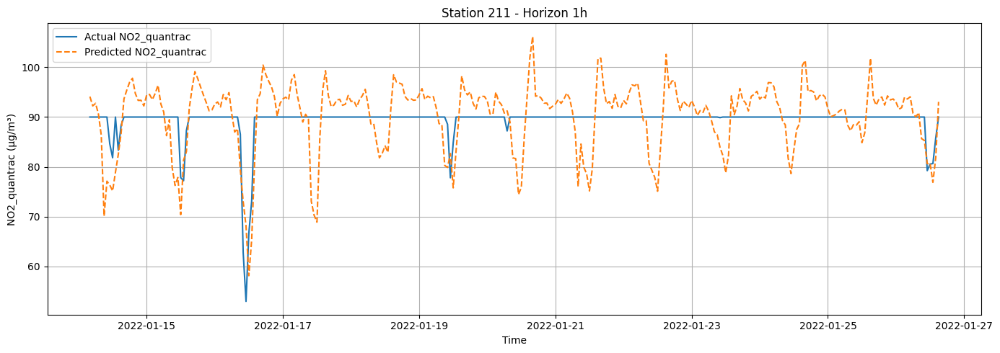

hour = 24


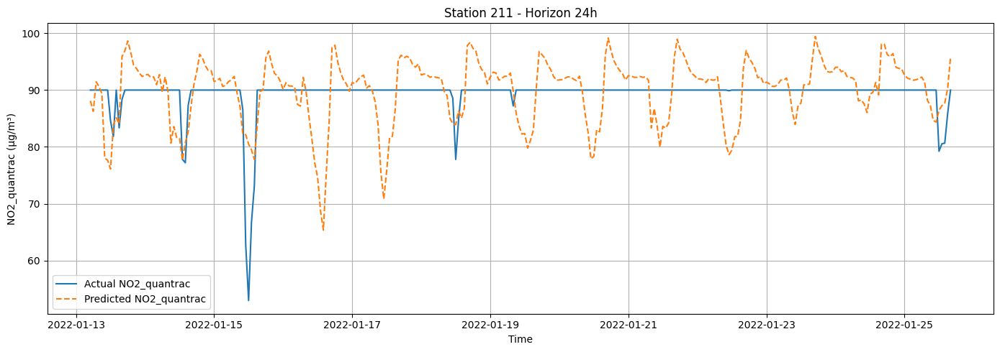

hour = 48


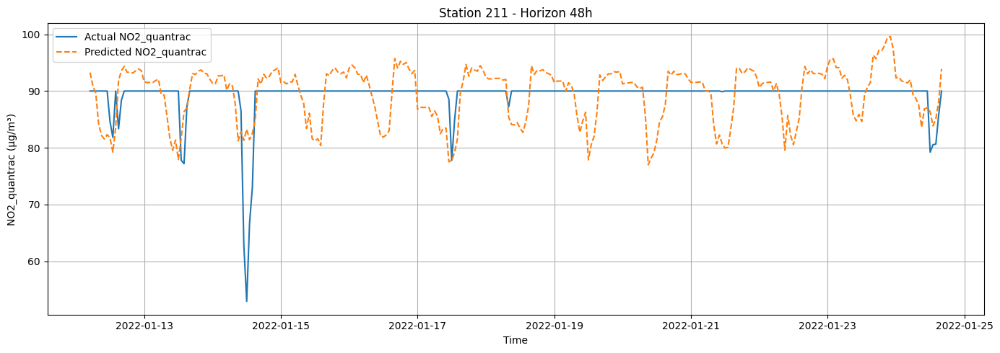

hour = 72


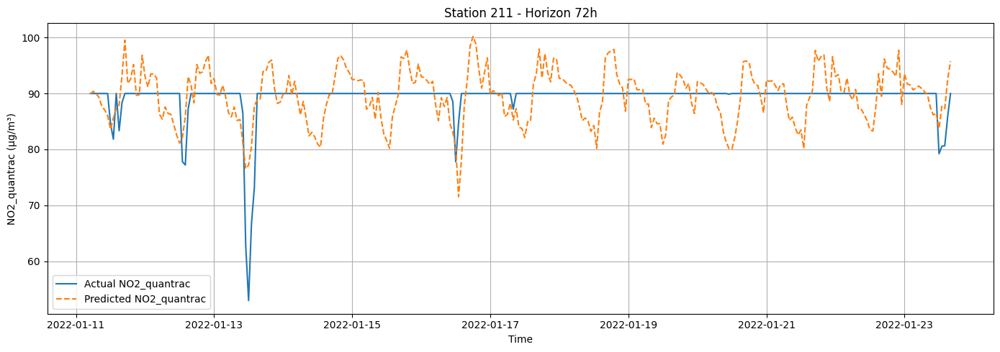

station_id = 212
hour = 1


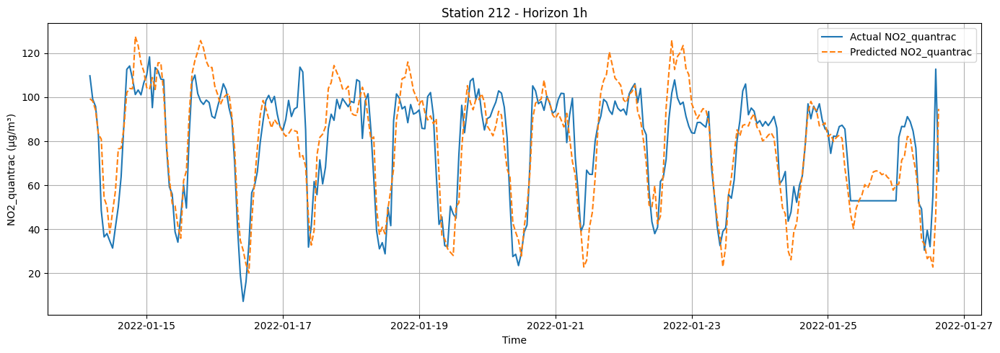

hour = 24


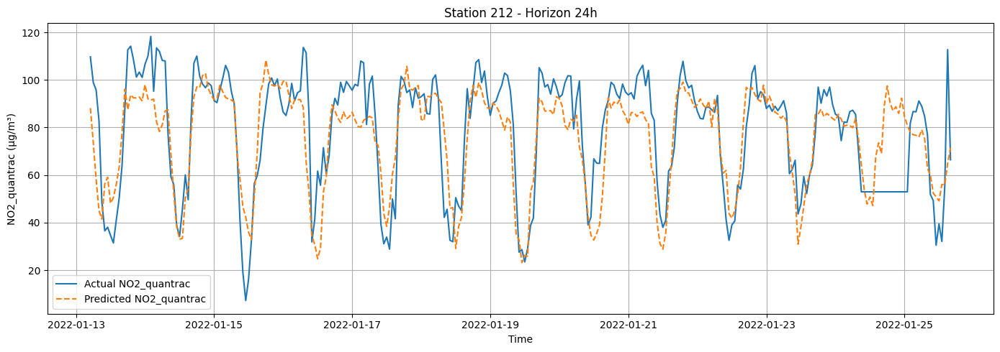

hour = 48


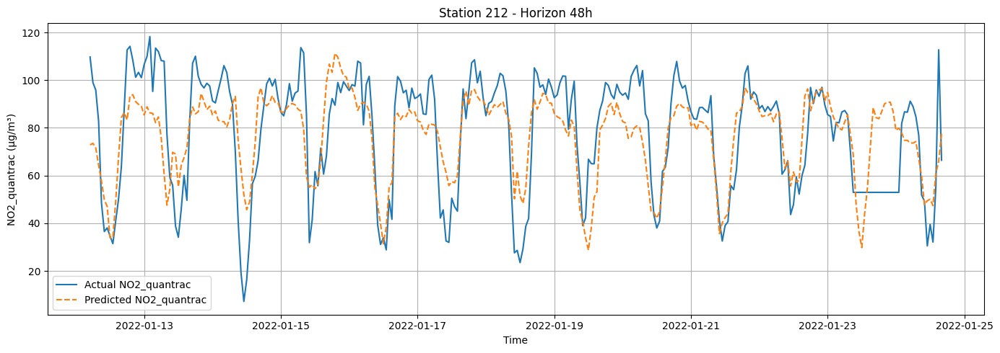

hour = 72


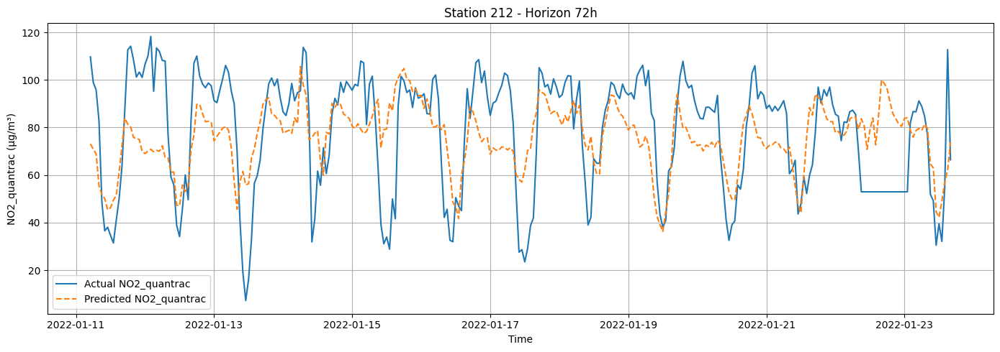

station_id = 213
hour = 1


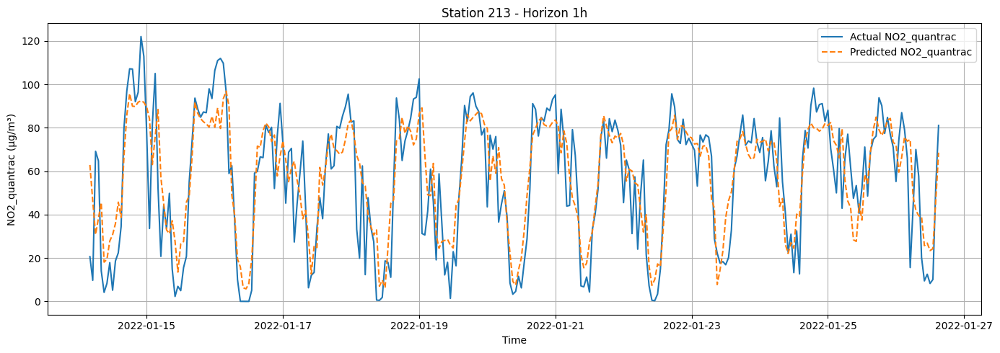

hour = 24


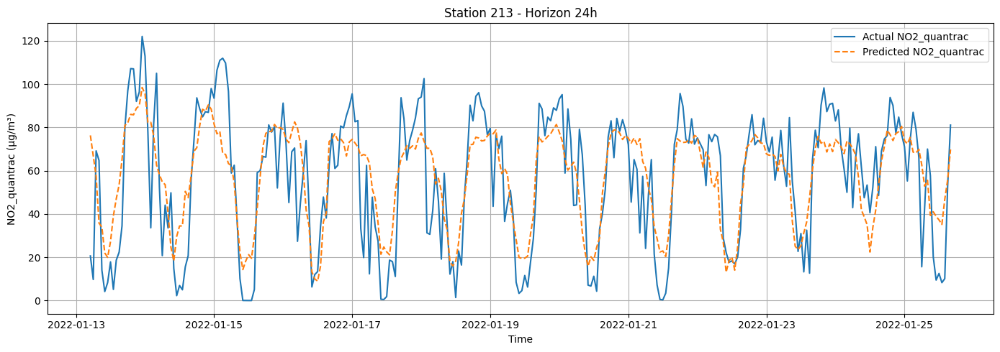

hour = 48


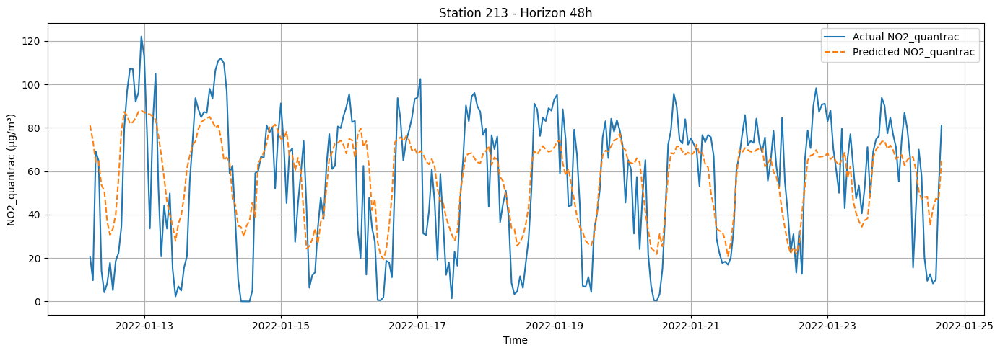

hour = 72


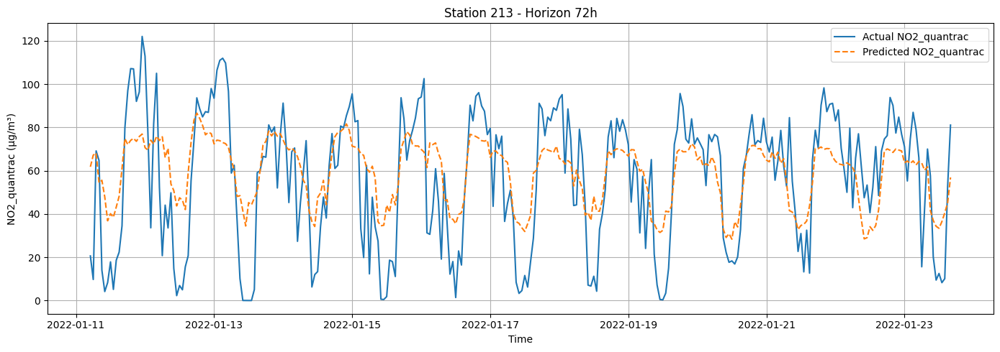

station_id = 214
hour = 1


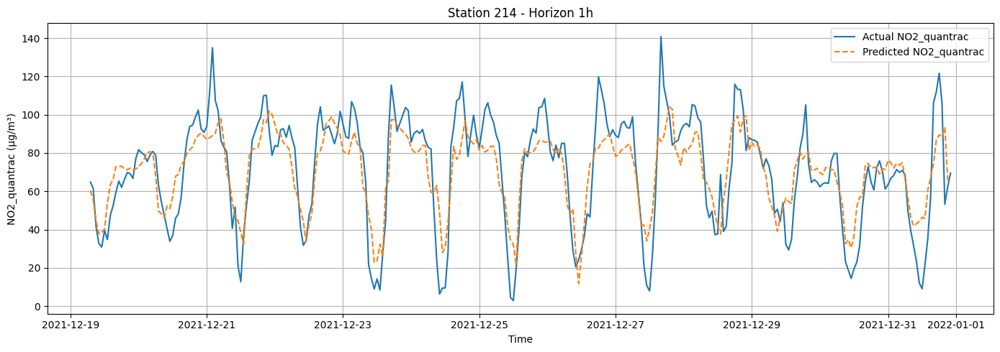

hour = 24


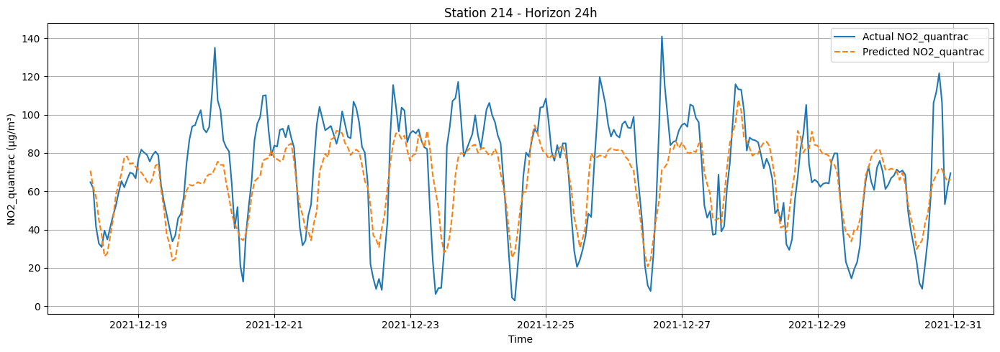

hour = 48


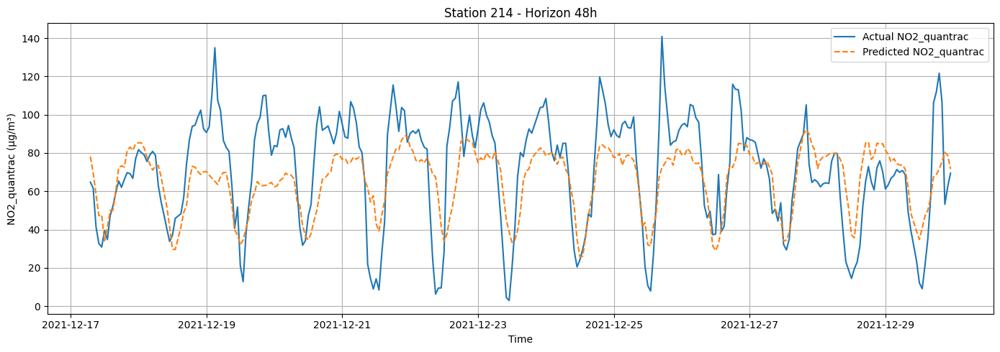

hour = 72


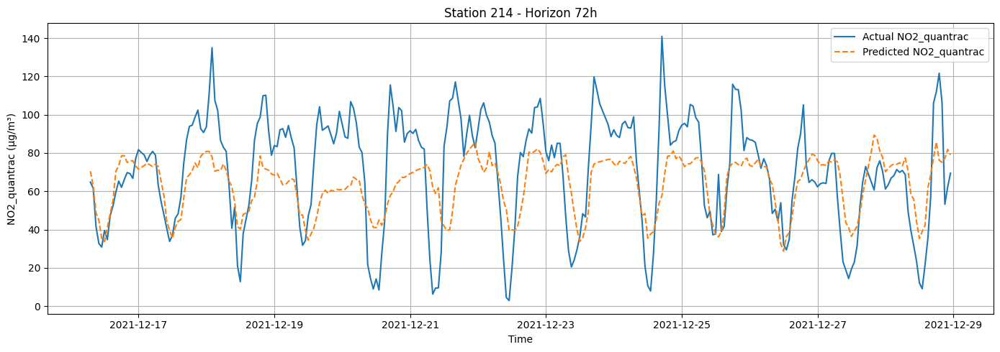

station_id = 215
hour = 1


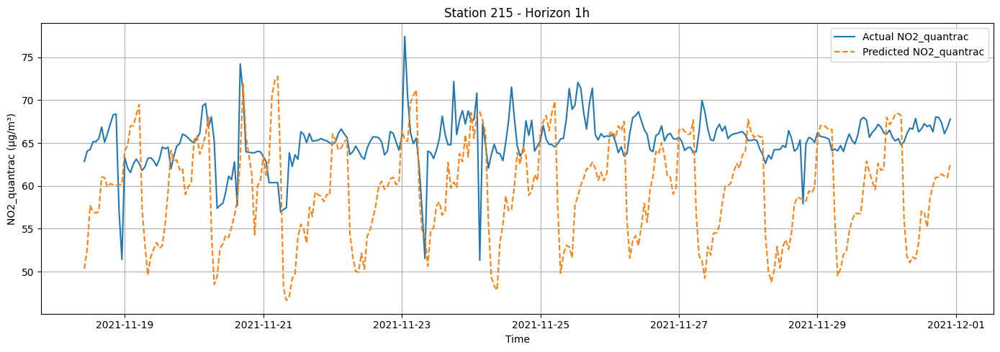

hour = 24


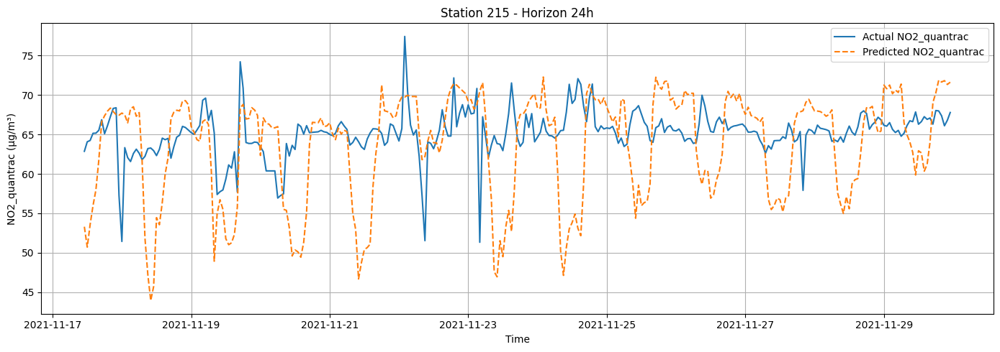

hour = 48


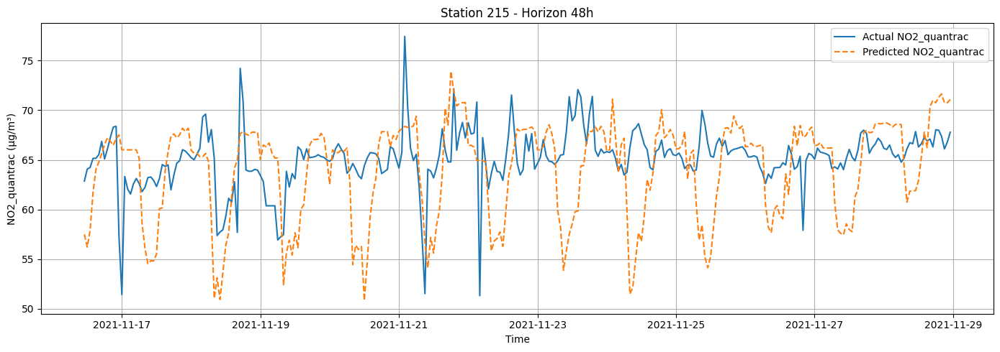

hour = 72


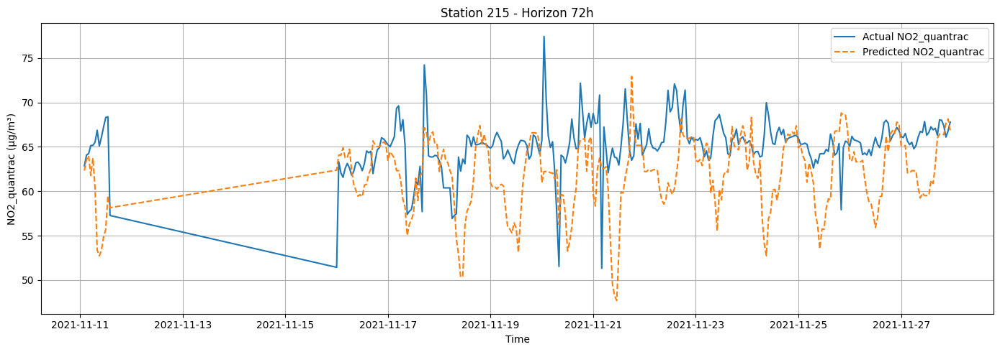

station_id = 216
hour = 1


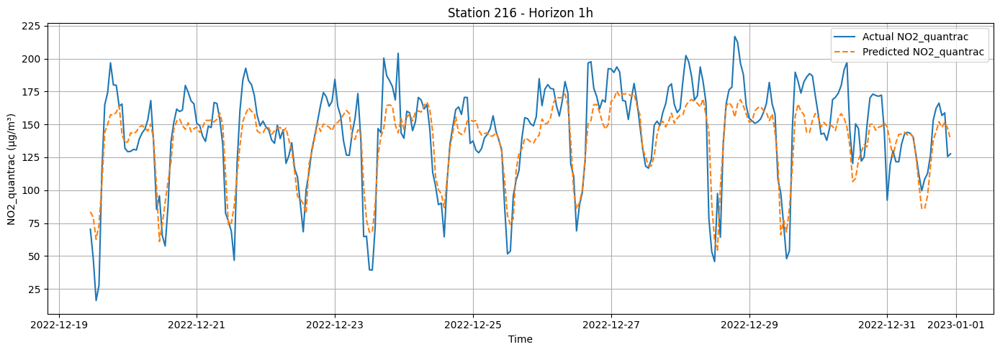

hour = 24


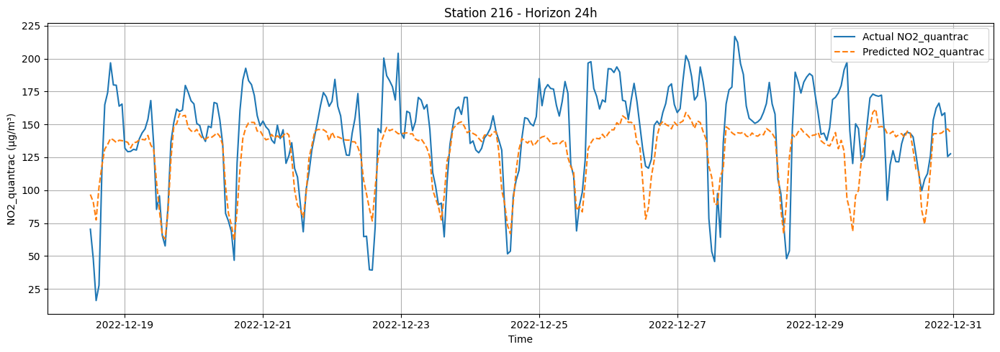

hour = 48


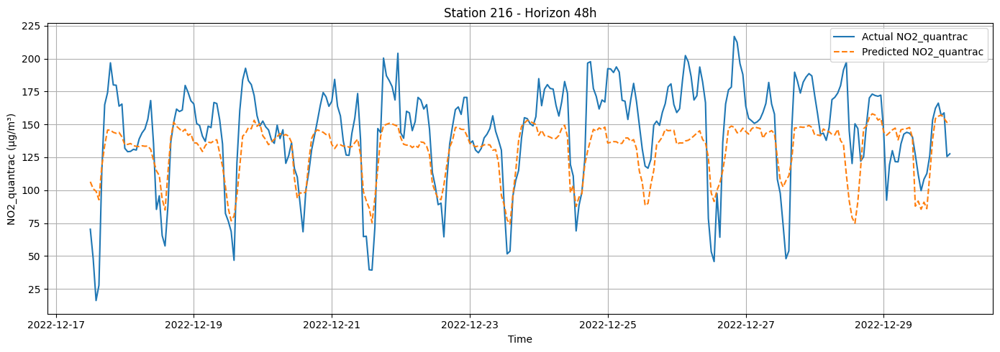

hour = 72


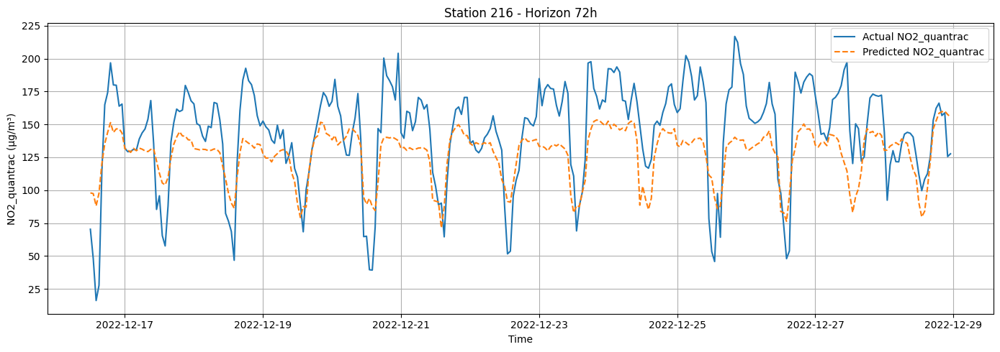

In [17]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in HORIZONS:
        print(f"hour = {hour}")
        plot_timeseries_example(df_no2, no2_models_by_h[hour], horizon_h=hour, station_id=station_id, target_col=label, LIGHTGBM_DIR=LIGHTGBM_DIR)

## Training for O3

In [18]:
label = "O3_quantrac"

# Add rolling features for LABEL
df_o3 = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Start running model
o3_all_metrics = []
o3_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_o3, horizon_h=h, target_col=label)
    o3_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    o3_all_metrics.append(metrics_by_station)

o3_df_metrics_all = pd.concat(o3_all_metrics, ignore_index=True)
o3_df_metrics_all = o3_df_metrics_all.sort_values(["station", "horizon_h"])
o3_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
o3_df_metrics_all


===== Training LightGBM for horizon = 1h, target_col = O3_quantrac =====

X.shape = (38542, 42)
y.shape = (38542, 3)

Number of features: 42

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
O3_quantrac_roll3_mean
O3_quantrac_roll3_std
O3_quantrac_roll6_mean
O3_quantrac_roll6_std
O3_quantrac_roll12_mean
O3_quantrac_roll12_std
O3_quantrac_roll24_mean
O3_quantrac_roll24_std

Label:
date
station_id
O3_quantrac_t_plus_1h

X_train.shape: (26976, 4

,date,target
0,2022-01-02,61.1742315353
1,2022-01-03,64.1066013632
2,2022-01-04,63.3546871825
3,2022-01-05,63.4765405011
4,2022-01-06,68.2799443737
5,2022-01-07,72.1538949321
6,2022-01-08,63.3488775178
7,2022-01-09,57.5133219784
8,2022-01-10,63.0326053276
9,2022-01-11,57.2614426830


,date,target
0,2022-01-02,58.1162356429
1,2022-01-03,62.8295932119
2,2022-01-04,64.7331651024
3,2022-01-05,63.2987536829
4,2022-01-06,66.6053356788
5,2022-01-07,69.8385397351
6,2022-01-08,65.4426100564
7,2022-01-09,56.6958746358
8,2022-01-10,62.0502941146
9,2022-01-11,61.1506855174


sid = 212, grp =                     date  station_id        y_true          y_pred
8869 2021-11-19 09:00:00         212   63.07773333   80.2206482260
8870 2021-11-19 10:00:00         212   92.03198333  101.2629061249
8871 2021-11-19 11:00:00         212  110.77863330  103.5847994527
8872 2021-11-19 12:00:00         212  145.06570000  108.4245125001
8873 2021-11-19 13:00:00         212  151.67446670  118.7556451887
...                  ...         ...           ...             ...
9739 2022-01-26 11:00:00         212  157.69433330   91.8202657945
9740 2022-01-26 12:00:00         212  153.53931670  109.7746226091
9741 2022-01-26 13:00:00         212   90.00000000  113.1072718904
9742 2022-01-26 14:00:00         212   90.00000000  124.4907718804
9743 2022-01-26 15:00:00         212   90.00000000  131.7631464181

[875 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23

,date,target
0,2021-11-19,121.1275322240
1,2021-11-20,123.1921100792
2,2021-11-21,91.9526792167
3,2021-11-23,107.6771365650
4,2021-11-24,108.8908823737
5,2021-11-25,115.8518667772
6,2021-11-26,136.1765371542
7,2021-11-27,137.6372774167
8,2021-11-28,124.0690740708
9,2021-11-29,117.9339469600


,date,target
0,2021-11-19,114.4172428298
1,2021-11-20,115.0583057011
2,2021-11-21,90.2261033348
3,2021-11-23,110.5953451624
4,2021-11-24,115.0207283785
5,2021-11-25,113.3458981272
6,2021-11-26,120.5478273374
7,2021-11-27,128.0845654271
8,2021-11-28,120.7717847468
9,2021-11-29,108.7272506173


sid = 213, grp =                      date  station_id         y_true          y_pred
14768 2021-12-20 13:00:00         213   92.130133330   94.7605428360
14769 2021-12-20 14:00:00         213  100.309300000  108.4151299993
14770 2021-12-20 15:00:00         213  120.986233300  108.2823911719
14771 2021-12-20 16:00:00         213   29.968466670  103.9238836545
14772 2021-12-20 17:00:00         213   51.626900000   95.7863577506
...                   ...         ...            ...             ...
15650 2022-01-26 11:00:00         213   98.706183330   69.4889901048
15651 2022-01-26 12:00:00         213   91.770250000   83.7557178404
15652 2022-01-26 13:00:00         213   95.074633330  103.9596141680
15653 2022-01-26 14:00:00         213   86.239958374   95.7101990496
15654 2022-01-26 15:00:00         213   90.000000000  101.5364304944

[887 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23), da

,date,target
0,2021-12-20,106.9091439427
1,2021-12-21,91.4311149525
2,2021-12-22,84.0918608962
3,2021-12-23,63.4550147250
4,2021-12-24,78.1384747489
5,2021-12-25,94.9470475775
6,2021-12-26,83.8008535404
7,2021-12-27,94.9922750987
8,2021-12-28,95.8774333104
9,2021-12-29,77.8941320146


,date,target
0,2021-12-20,96.2298513438
1,2021-12-21,92.0232575498
2,2021-12-22,92.7107823319
3,2021-12-23,72.0849423854
4,2021-12-24,72.8739857091
5,2021-12-25,86.5271886298
6,2021-12-26,90.9689593825
7,2021-12-27,89.1236150659
8,2021-12-28,95.3927095277
9,2021-12-29,87.9141032619


sid = 214, grp =                      date  station_id          y_true          y_pred
20825 2021-11-23 09:00:00         214  107.1143667000   76.7917041839
20826 2021-11-23 10:00:00         214   91.2444464300   82.8774659851
20827 2021-11-23 11:00:00         214  102.3780000000   84.4572294122
20828 2021-11-23 12:00:00         214   77.7023024709   90.9800645994
20829 2021-11-23 13:00:00         214   90.0000000000   97.6787505774
...                   ...         ...             ...             ...
21733 2021-12-31 18:00:00         214  132.4370667000  121.2089747258
21734 2021-12-31 19:00:00         214  107.8014167000  117.5792902881
21735 2021-12-31 20:00:00         214   61.2165185200  113.5780215755
21736 2021-12-31 21:00:00         214   73.8088000000   97.3269680911
21737 2021-12-31 22:00:00         214   82.6423000000   88.4844529963

[913 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021,

,date,target
0,2021-11-23,91.6975402654
1,2021-11-24,93.3443932779
2,2021-11-25,91.6623921200
3,2021-11-26,102.2618008508
4,2021-11-27,101.2890797825
5,2021-11-28,91.3355579367
6,2021-11-29,84.2368115154
7,2021-11-30,81.4905561046
8,2021-12-01,95.4026808217
9,2021-12-02,113.8599750875


,date,target
0,2021-11-23,97.2349185947
1,2021-11-24,90.7438507761
2,2021-11-25,90.6067707815
3,2021-11-26,98.0891817381
4,2021-11-27,99.1324589868
5,2021-11-28,89.2416793369
6,2021-11-29,85.9375202305
7,2021-11-30,78.5294389147
8,2021-12-01,89.0110890519
9,2021-12-02,115.9452070634


sid = 215, grp =                      date  station_id  y_true         y_pred
24388 2021-11-07 01:00:00         215    90.0  84.2971593330
24389 2021-11-07 02:00:00         215    90.0  84.5430078838
24390 2021-11-07 03:00:00         215    90.0  85.2763930242
24391 2021-11-07 04:00:00         215    90.0  86.7089269186
24392 2021-11-07 05:00:00         215    90.0  85.8600728536
...                   ...         ...     ...            ...
24851 2021-11-30 18:00:00         215    90.0  82.4595683009
24852 2021-11-30 19:00:00         215    90.0  85.1814377884
24853 2021-11-30 20:00:00         215    90.0  85.3340125930
24854 2021-11-30 21:00:00         215    90.0  85.7361804258
24855 2021-11-30 22:00:00         215    90.0  87.3163597285

[468 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(2021, 11, 11), datetime.date(2021, 11, 16), datetime.date(2021, 11, 17), datetime.date(

,date,target
0,2021-11-07,90.0
1,2021-11-08,90.0
2,2021-11-09,90.0
3,2021-11-10,90.0
4,2021-11-11,90.0
5,2021-11-16,90.0
6,2021-11-17,90.0
7,2021-11-18,90.0
8,2021-11-19,90.0
9,2021-11-20,90.0


,date,target
0,2021-11-07,86.2099337714
1,2021-11-08,86.2181240625
2,2021-11-09,90.1139978800
3,2021-11-10,86.8670385890
4,2021-11-11,87.9100758921
5,2021-11-16,87.0322744236
6,2021-11-17,87.5278299284
7,2021-11-18,87.1083599599
8,2021-11-19,87.6462274437
9,2021-11-20,87.4470468575


sid = 216, grp =                      date  station_id         y_true         y_pred
36489 2022-09-20 12:00:00         216  40.5833333333  50.4214077710
36490 2022-09-20 13:00:00         216  46.9000000000  48.5484099685
36491 2022-09-20 14:00:00         216  54.0833333333  56.3937667571
36492 2022-09-20 15:00:00         216  48.7333333333  58.0227315811
36493 2022-09-20 16:00:00         216  54.8166666667  56.9259309693
...                   ...         ...            ...            ...
38537 2022-12-31 18:00:00         216  75.9166666667  84.0209262143
38538 2022-12-31 19:00:00         216  66.1166666667  84.0458190266
38539 2022-12-31 20:00:00         216  55.1333333333  76.2570756592
38540 2022-12-31 21:00:00         216  46.7500000000  67.9768290068
38541 2022-12-31 22:00:00         216  50.0166666667  60.8189092826

[2053 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9, 22), datetime.date(2022, 9, 23), datetime.date(202

,date,target
0,2022-09-20,53.7816239316
1,2022-09-21,46.4844863732
2,2022-09-22,44.4186975891
3,2022-09-23,46.1901836158
4,2022-09-24,44.8116193061
...,...,...
83,2022-12-27,75.4105341479
84,2022-12-28,78.1382022913
85,2022-12-29,80.2899782904
86,2022-12-30,72.2750483888


,date,target
0,2022-09-20,54.7893946746
1,2022-09-21,48.6571949791
2,2022-09-22,48.0482160803
3,2022-09-23,48.2906227788
4,2022-09-24,48.3612165622
...,...,...
83,2022-12-27,78.9784382715
84,2022-12-28,79.4702816743
85,2022-12-29,86.6100861648
86,2022-12-30,78.3494279823


Overall test metrics: {'rmse': 18.8, 'mae': 12.79, 'mape': 22.0, 'mnbe': -10.5, 'r': 0.82, 'n_samples': 5784}

===== Training LightGBM for horizon = 24h, target_col = O3_quantrac =====

X.shape = (38404, 42)
y.shape = (38404, 3)

Number of features: 42

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
O3_quantrac_roll3_mean
O3_quantrac_roll3_std
O3_quantrac_roll6_mean
O3_quantrac_roll6_std
O3_quantrac_roll12_mean
O3_quantrac_roll12_std
O3_quan

,date,target
0,2022-01-01,69.5466319827
1,2022-01-02,63.9786230323
2,2022-01-03,63.1137688130
3,2022-01-04,63.4686794529
4,2022-01-05,67.9858535225
5,2022-01-06,72.5380178614
6,2022-01-07,63.8443269909
7,2022-01-08,57.1622116777
8,2022-01-09,63.0906289113
9,2022-01-10,57.4374054710


,date,target
0,2022-01-01,57.8381209986
1,2022-01-02,58.2230483161
2,2022-01-03,63.0856934512
3,2022-01-04,67.8456496509
4,2022-01-05,63.0459193584
5,2022-01-06,65.8382186045
6,2022-01-07,66.9578617812
7,2022-01-08,62.5460841990
8,2022-01-09,58.4482676307
9,2022-01-10,64.8243261703


sid = 212, grp =                     date  station_id       y_true          y_pred
8827 2021-11-18 14:00:00         212  151.6744667  102.7952765183
8828 2021-11-18 15:00:00         212  155.1097167  102.9762428894
8829 2021-11-18 16:00:00         212   90.0000000  126.8866133465
8830 2021-11-18 17:00:00         212   90.0000000  134.8685880806
8831 2021-11-18 18:00:00         212  177.6187833  133.4663506194
...                  ...         ...          ...             ...
9693 2022-01-25 12:00:00         212  157.6943333   98.1942712720
9694 2022-01-25 13:00:00         212  153.5393167   91.9500179563
9695 2022-01-25 14:00:00         212   90.0000000  102.9336585449
9696 2022-01-25 15:00:00         212   90.0000000  104.5999144176
9697 2022-01-25 16:00:00         212   90.0000000  102.7716319107

[871 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.

,date,target
0,2021-11-18,128.5496166700
1,2021-11-19,123.7673781375
2,2021-11-20,91.7454736583
3,2021-11-21,108.1419858721
4,2021-11-23,108.6632289000
5,2021-11-24,115.2207077522
6,2021-11-25,135.8657288208
7,2021-11-26,137.9330906083
8,2021-11-27,124.9660560167
9,2021-11-28,117.9925643212


,date,target
0,2021-11-18,117.0909272408
1,2021-11-19,104.5666792638
2,2021-11-20,103.6867611552
3,2021-11-21,103.1291187213
4,2021-11-23,107.6595860907
5,2021-11-24,107.2393624779
6,2021-11-25,110.4934131069
7,2021-11-26,109.1121937363
8,2021-11-27,125.9113930383
9,2021-11-28,118.0152934878


sid = 213, grp =                      date  station_id         y_true          y_pred
14702 2021-12-19 17:00:00         213   29.968466670   85.4232289655
14703 2021-12-19 18:00:00         213   51.626900000   84.5672173799
14704 2021-12-19 19:00:00         213   61.670916670   90.3565569652
14705 2021-12-19 20:00:00         213  160.475250000   96.7070927588
14706 2021-12-19 21:00:00         213  156.974566700  100.6322285796
...                   ...         ...            ...             ...
15581 2022-01-25 12:00:00         213   98.706183330   78.2628863709
15582 2022-01-25 13:00:00         213   91.770250000   72.0486689896
15583 2022-01-25 14:00:00         213   95.074633330   69.6981005181
15584 2022-01-25 15:00:00         213   86.239958374   98.8645611700
15585 2022-01-25 16:00:00         213   90.000000000  105.4780754674

[884 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), da

,date,target
0,2021-12-20,93.2359843983
1,2021-12-21,84.8743345075
2,2021-12-22,64.3656286138
3,2021-12-23,76.2128137177
4,2021-12-24,96.3391904745
5,2021-12-25,84.0898507629
6,2021-12-26,94.6767191917
7,2021-12-27,95.8774333104
8,2021-12-28,78.6706123922
9,2021-12-29,64.8106769438


,date,target
0,2021-12-20,89.2698714897
1,2021-12-21,102.3742226064
2,2021-12-22,92.5911161640
3,2021-12-23,78.3758110100
4,2021-12-24,74.2898518542
5,2021-12-25,87.1932846984
6,2021-12-26,93.8803692765
7,2021-12-27,95.0197876665
8,2021-12-28,107.9921806242
9,2021-12-29,95.6018962853


sid = 214, grp =                      date  station_id        y_true         y_pred
20737 2021-11-22 14:00:00         214   90.00000000  88.5931166370
20738 2021-11-22 15:00:00         214   90.00000000  91.9079000817
20739 2021-11-22 16:00:00         214   90.00000000  94.4652259180
20740 2021-11-22 17:00:00         214   90.00000000  92.1109880341
20741 2021-11-22 18:00:00         214   90.00000000  92.3883047347
...                   ...         ...           ...            ...
21641 2021-12-30 19:00:00         214  132.43706670  91.5535977118
21642 2021-12-30 20:00:00         214  107.80141670  89.8591281264
21643 2021-12-30 21:00:00         214   61.21651852  86.4030697331
21644 2021-12-30 22:00:00         214   73.80880000  81.6377780477
21645 2021-12-30 23:00:00         214   82.64230000  86.2611740329

[909 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11, 26

,date,target
0,2021-11-22,92.5112755050
1,2021-11-23,92.4992127221
2,2021-11-24,91.8123435092
3,2021-11-25,102.1691036283
4,2021-11-26,101.3504235325
5,2021-11-27,92.0730461312
6,2021-11-28,84.5258087375
7,2021-11-29,80.8866609658
8,2021-11-30,94.8464974883
9,2021-12-01,113.6614730042


,date,target
0,2021-11-22,88.2302270675
1,2021-11-23,84.4582436157
2,2021-11-24,90.8933433541
3,2021-11-25,85.8012148762
4,2021-11-26,91.0835270543
5,2021-11-27,92.0651625325
6,2021-11-28,85.5647945985
7,2021-11-29,91.6253334232
8,2021-11-30,81.2119224037
9,2021-12-01,85.6487023510


sid = 215, grp =                      date  station_id  y_true         y_pred
24276 2021-11-06 05:00:00         215    90.0  86.9359979967
24277 2021-11-06 06:00:00         215    90.0  88.5499939935
24278 2021-11-06 07:00:00         215    90.0  85.8723973522
24279 2021-11-06 08:00:00         215    90.0  83.1125915856
24280 2021-11-06 09:00:00         215    90.0  82.5523929598
...                   ...         ...     ...            ...
24736 2021-11-29 19:00:00         215    90.0  87.7123974134
24737 2021-11-29 20:00:00         215    90.0  87.9954036262
24738 2021-11-29 21:00:00         215    90.0  91.0777630355
24739 2021-11-29 22:00:00         215    90.0  88.6073919133
24740 2021-11-29 23:00:00         215    90.0  86.0729217916

[465 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(2021, 11, 11), datetime.date(2021, 11, 16), datetime.date(2

,date,target
0,2021-11-06,90.0
1,2021-11-07,90.0
2,2021-11-08,90.0
3,2021-11-09,90.0
4,2021-11-10,90.0
5,2021-11-11,90.0
6,2021-11-16,90.0
7,2021-11-17,90.0
8,2021-11-18,90.0
9,2021-11-19,90.0


,date,target
0,2021-11-06,87.6866385654
1,2021-11-07,94.6768785135
2,2021-11-08,95.0610476011
3,2021-11-09,92.6734520014
4,2021-11-10,92.8747165059
5,2021-11-11,93.2496547112
6,2021-11-16,92.8279301528
7,2021-11-17,91.7260304528
8,2021-11-18,90.3307935171
9,2021-11-19,89.9038270404


sid = 216, grp =                      date  station_id         y_true         y_pred
36354 2022-09-19 16:00:00         216  48.7333333333  59.7868202739
36355 2022-09-19 17:00:00         216  54.8166666667  64.6960093559
36356 2022-09-19 18:00:00         216  64.7666666667  63.0307017596
36357 2022-09-19 19:00:00         216  59.1166666667  61.5792099740
36358 2022-09-19 20:00:00         216  60.8833333333  59.5117805943
...                   ...         ...            ...            ...
38399 2022-12-30 19:00:00         216  75.9166666667  89.8467110925
38400 2022-12-30 20:00:00         216  66.1166666667  82.1782015311
38401 2022-12-30 21:00:00         216  55.1333333333  84.1984550907
38402 2022-12-30 22:00:00         216  46.7500000000  85.7486133967
38403 2022-12-30 23:00:00         216  50.0166666667  81.4563086774

[2050 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9, 22), datetime.date(202

,date,target
0,2022-09-20,46.1065483390
1,2022-09-21,44.8909198113
2,2022-09-22,45.9874058380
3,2022-09-23,44.9275915283
4,2022-09-24,48.4547904896
...,...,...
82,2022-12-26,74.8619230368
83,2022-12-27,77.9263967357
84,2022-12-28,80.4344227349
85,2022-12-29,73.5132428332


,date,target
0,2022-09-20,51.8951737573
1,2022-09-21,53.0149307699
2,2022-09-22,51.4259246233
3,2022-09-23,48.8662844470
4,2022-09-24,51.3391303709
...,...,...
82,2022-12-26,77.9201355255
83,2022-12-27,82.5110094718
84,2022-12-28,82.1196929060
85,2022-12-29,89.9326984542


Overall test metrics: {'rmse': 21.95, 'mae': 15.82, 'mape': 27.6, 'mnbe': -12.83, 'r': 0.75, 'n_samples': 5764}

===== Training LightGBM for horizon = 48h, target_col = O3_quantrac =====

X.shape = (38260, 42)
y.shape = (38260, 3)

Number of features: 42

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
O3_quantrac_roll3_mean
O3_quantrac_roll3_std
O3_quantrac_roll6_mean
O3_quantrac_roll6_std
O3_quantrac_roll12_mean
O3_quantrac_roll12_std
O3_qu

,date,target
0,2021-11-30,68.0813697266
1,2022-01-01,63.9786230323
2,2022-01-02,63.1137688130
3,2022-01-03,63.4686794529
4,2022-01-04,67.9858535225
5,2022-01-05,72.5380178614
6,2022-01-06,63.8443269909
7,2022-01-07,57.1622116777
8,2022-01-08,63.0906289113
9,2022-01-09,57.4374054710


,date,target
0,2021-11-30,63.0036511004
1,2022-01-01,57.2513618527
2,2022-01-02,61.8168728078
3,2022-01-03,63.2591279524
4,2022-01-04,64.7635846495
5,2022-01-05,65.5749056763
6,2022-01-06,63.5359378285
7,2022-01-07,61.5334126719
8,2022-01-08,63.3221347928
9,2022-01-09,64.5315709418


sid = 212, grp =                     date  station_id       y_true          y_pred
8783 2021-11-17 18:00:00         212  177.6187833  137.2904828918
8784 2021-11-17 19:00:00         212  121.8041500  130.1164655767
8785 2021-11-17 20:00:00         212  126.8425167  117.0500021428
8786 2021-11-17 21:00:00         212  125.2394000  106.2611371082
8787 2021-11-17 22:00:00         212  124.4214833  107.9708736746
...                  ...         ...          ...             ...
9645 2022-01-24 12:00:00         212  157.6943333  115.9599784955
9646 2022-01-24 13:00:00         212  153.5393167  117.2274203268
9647 2022-01-24 14:00:00         212   90.0000000  137.9150245990
9648 2022-01-24 15:00:00         212   90.0000000  140.0594334761
9649 2022-01-24 16:00:00         212   90.0000000  119.7234985033

[867 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 17), datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.

,date,target
0,2021-11-18,123.7673781375
1,2021-11-19,91.7454736583
2,2021-11-20,108.1419858721
3,2021-11-21,103.9138594583
4,2021-11-23,115.2207077522
5,2021-11-24,135.8657288208
6,2021-11-25,137.9330906083
7,2021-11-26,124.9660560167
8,2021-11-27,117.9925643212
9,2021-11-28,118.8394841304


,date,target
0,2021-11-18,102.2678487555
1,2021-11-19,102.1681287934
2,2021-11-20,109.0929062588
3,2021-11-21,104.6147048549
4,2021-11-23,106.0511045717
5,2021-11-24,109.0786002873
6,2021-11-25,105.7421143738
7,2021-11-26,105.2118596496
8,2021-11-27,114.3698626949
9,2021-11-28,120.2506669935


sid = 213, grp =                      date  station_id         y_true          y_pred
14634 2021-12-18 21:00:00         213  156.974566700   79.9508519859
14635 2021-12-18 22:00:00         213  141.761316700   81.4079559965
14636 2021-12-18 23:00:00         213  130.997533300   82.0094459896
14637 2021-12-19 00:00:00         213  129.099966700   89.1002472164
14638 2021-12-19 01:00:00         213  144.629847500   88.6148894334
...                   ...         ...            ...             ...
15509 2022-01-24 12:00:00         213   98.706183330   95.7233370143
15510 2022-01-24 13:00:00         213   91.770250000   88.3840216285
15511 2022-01-24 14:00:00         213   95.074633330  101.5030057786
15512 2022-01-24 15:00:00         213   86.239958374   92.6958058980
15513 2022-01-24 16:00:00         213   90.000000000   97.7318276665

[880 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 18), datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), da

,date,target
0,2021-12-19,93.2359843983
1,2021-12-20,84.8743345075
2,2021-12-21,64.3656286138
3,2021-12-22,76.2128137177
4,2021-12-23,95.2783731425
5,2021-12-24,84.1335296968
6,2021-12-25,94.6767191917
7,2021-12-26,95.7281348887
8,2021-12-27,77.2680390070
9,2021-12-28,65.0183114487


,date,target
0,2021-12-19,84.9438292944
1,2021-12-20,88.7629901249
2,2021-12-21,94.9554902447
3,2021-12-22,94.3732682570
4,2021-12-23,76.7718010066
5,2021-12-24,74.9540917169
6,2021-12-25,92.7958946136
7,2021-12-26,92.3106002411
8,2021-12-27,87.9193915683
9,2021-12-28,103.2292392019


sid = 214, grp =                      date  station_id        y_true          y_pred
20644 2021-11-21 17:00:00         214   90.00000000  104.7743896143
20645 2021-11-21 18:00:00         214   90.00000000  102.2586024156
20646 2021-11-21 19:00:00         214   90.00000000  103.3442121792
20647 2021-11-21 20:00:00         214   90.00000000   97.3162082543
20648 2021-11-21 21:00:00         214  119.67756670   92.3602533032
...                   ...         ...           ...             ...
21545 2021-12-29 19:00:00         214  132.43706670   98.2060214230
21546 2021-12-29 20:00:00         214  107.80141670   94.1445981827
21547 2021-12-29 21:00:00         214   61.21651852   85.6812223803
21548 2021-12-29 22:00:00         214   73.80880000   83.6097205257
21549 2021-12-29 23:00:00         214   82.64230000   84.3536921114

[906 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(

,date,target
0,2021-11-22,92.4992127221
1,2021-11-23,91.8123435092
2,2021-11-24,102.1691036283
3,2021-11-25,101.3504235325
4,2021-11-26,92.0730461312
5,2021-11-27,84.5258087375
6,2021-11-28,80.8866609658
7,2021-11-29,94.8464974883
8,2021-11-30,113.6614730042
9,2021-12-01,112.5797932279


,date,target
0,2021-11-22,87.6357374015
1,2021-11-23,90.1126417265
2,2021-11-24,99.9124022931
3,2021-11-25,91.9126863210
4,2021-11-26,91.8112744267
5,2021-11-27,93.5926636176
6,2021-11-28,97.5016881347
7,2021-11-29,95.9006826900
8,2021-11-30,88.2763930350
9,2021-12-01,89.8897595242


sid = 215, grp =                      date  station_id  y_true         y_pred
24160 2021-11-05 09:00:00         215    90.0  85.6062040176
24161 2021-11-05 10:00:00         215    90.0  82.9543555865
24162 2021-11-05 11:00:00         215    90.0  86.9624130917
24163 2021-11-05 12:00:00         215    90.0  88.3080445762
24164 2021-11-05 13:00:00         215    90.0  88.3311581706
...                   ...         ...     ...            ...
24616 2021-11-28 19:00:00         215    90.0  98.7553556960
24617 2021-11-28 20:00:00         215    90.0  94.9746426140
24618 2021-11-28 21:00:00         215    90.0  94.1025476010
24619 2021-11-28 22:00:00         215    90.0  92.5721338925
24620 2021-11-28 23:00:00         215    90.0  93.4834001772

[461 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(2021, 11, 11), datetime.date(20

,date,target
0,2021-11-05,90.0
1,2021-11-06,90.0
2,2021-11-07,90.0
3,2021-11-08,90.0
4,2021-11-09,90.0
5,2021-11-10,90.0
6,2021-11-11,90.0
7,2021-11-16,90.0
8,2021-11-17,90.0
9,2021-11-18,90.0


,date,target
0,2021-11-05,89.6692293862
1,2021-11-06,89.9142554091
2,2021-11-07,94.3668649446
3,2021-11-08,91.1129798112
4,2021-11-09,95.9994015871
5,2021-11-10,93.1018339055
6,2021-11-11,90.8601906670
7,2021-11-16,94.2479158555
8,2021-11-17,95.1022816802
9,2021-11-18,90.5907710101


sid = 216, grp =                      date  station_id         y_true          y_pred
36214 2022-09-18 20:00:00         216  60.8833333333   58.4493549080
36215 2022-09-18 21:00:00         216  71.8166666667   54.5216127224
36216 2022-09-18 22:00:00         216  57.4333333333   55.0288645506
36217 2022-09-18 23:00:00         216  45.9000000000   49.9264863106
36218 2022-09-19 00:00:00         216  40.3461538462   49.0800319978
...                   ...         ...            ...             ...
38255 2022-12-29 19:00:00         216  75.9166666667  108.7689565750
38256 2022-12-29 20:00:00         216  66.1166666667   98.0974022964
38257 2022-12-29 21:00:00         216  55.1333333333   99.7833373442
38258 2022-12-29 22:00:00         216  46.7500000000   86.1282314609
38259 2022-12-29 23:00:00         216  50.0166666667   89.9210283857

[2046 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 18), datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datet

,date,target
0,2022-09-19,46.1065483390
1,2022-09-20,44.8909198113
2,2022-09-21,45.9874058380
3,2022-09-22,44.9275915283
4,2022-09-23,48.4547904896
...,...,...
82,2022-12-25,74.8619230368
83,2022-12-26,77.9263967357
84,2022-12-27,80.4344227349
85,2022-12-28,73.5132428332


,date,target
0,2022-09-19,54.2395038637
1,2022-09-20,56.9995453790
2,2022-09-21,56.1121371583
3,2022-09-22,53.3648635905
4,2022-09-23,51.3216955560
...,...,...
82,2022-12-25,70.3234839093
83,2022-12-26,73.1447126298
84,2022-12-27,81.9796420828
85,2022-12-28,84.5645309207


Overall test metrics: {'rmse': 23.23, 'mae': 17.05, 'mape': 30.98, 'mnbe': -16.1, 'r': 0.71, 'n_samples': 5741}

===== Training LightGBM for horizon = 72h, target_col = O3_quantrac =====

X.shape = (38116, 42)
y.shape = (38116, 3)

Number of features: 42

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
O3_quantrac_roll3_mean
O3_quantrac_roll3_std
O3_quantrac_roll6_mean
O3_quantrac_roll6_std
O3_quantrac_roll12_mean
O3_quantrac_roll12_std
O3_qu

,date,target
0,2021-11-30,63.9786230323
1,2022-01-01,63.1137688130
2,2022-01-02,63.4686794529
3,2022-01-03,67.9858535225
4,2022-01-04,72.5380178614
5,2022-01-05,63.8443269909
6,2022-01-06,57.1622116777
7,2022-01-07,63.0906289113
8,2022-01-08,57.4374054710
9,2022-01-09,54.3523164387


,date,target
0,2021-11-30,64.1940684988
1,2022-01-01,53.5543189380
2,2022-01-02,56.3680140603
3,2022-01-03,60.0797519755
4,2022-01-04,61.1774810171
5,2022-01-05,58.6982183149
6,2022-01-06,58.6134287668
7,2022-01-07,60.4103510663
8,2022-01-08,59.9238522138
9,2022-01-09,57.3403759805


sid = 212, grp =                     date  station_id       y_true          y_pred
8738 2021-11-16 21:00:00         212  125.2394000  108.2631824311
8739 2021-11-16 22:00:00         212  124.4214833  110.6212449814
8740 2021-11-16 23:00:00         212  122.7856500  105.6917805128
8741 2021-11-17 00:00:00         212  120.4627667   95.7780063598
8742 2021-11-17 01:00:00         212  115.1062586   96.4296617511
...                  ...         ...          ...             ...
9597 2022-01-23 12:00:00         212  157.6943333  100.1709927245
9598 2022-01-23 13:00:00         212  153.5393167  109.6252223928
9599 2022-01-23 14:00:00         212   90.0000000  122.5596155514
9600 2022-01-23 15:00:00         212   90.0000000  118.3758267308
9601 2022-01-23 16:00:00         212   90.0000000  125.0896036648

[864 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 16), datetime.date(2021, 11, 17), datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.

,date,target
0,2021-11-17,123.7673781375
1,2021-11-18,91.7454736583
2,2021-11-19,108.1419858721
3,2021-11-20,103.9138594583
4,2021-11-21,118.3478758064
5,2021-11-23,135.8657288208
6,2021-11-24,137.9330906083
7,2021-11-25,124.9660560167
8,2021-11-26,117.9925643212
9,2021-11-27,118.8394841304


,date,target
0,2021-11-17,100.0699871409
1,2021-11-18,95.5038128755
2,2021-11-19,101.1850952895
3,2021-11-20,108.3373340829
4,2021-11-21,97.0598491912
5,2021-11-23,102.9533470898
6,2021-11-24,101.0148405171
7,2021-11-25,99.1707702981
8,2021-11-26,102.6388400554
9,2021-11-27,116.5152219555


sid = 213, grp =                      date  station_id         y_true          y_pred
14566 2021-12-18 01:00:00         213  144.629847500   86.5071135350
14567 2021-12-18 02:00:00         213   40.324677970   75.7236543568
14568 2021-12-18 03:00:00         213   50.808983330   74.7087813342
14569 2021-12-18 04:00:00         213   38.605666670   76.3516400926
14570 2021-12-18 05:00:00         213   66.643850000   69.1249195170
...                   ...         ...            ...             ...
15437 2022-01-23 12:00:00         213   98.706183330   84.1553365317
15438 2022-01-23 13:00:00         213   91.770250000   87.1590174288
15439 2022-01-23 14:00:00         213   95.074633330   94.5272010153
15440 2022-01-23 15:00:00         213   86.239958374   95.4138678873
15441 2022-01-23 16:00:00         213   90.000000000  101.8194169193

[876 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 18), datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), da

,date,target
0,2021-12-18,91.6766808200
1,2021-12-19,84.8743345075
2,2021-12-20,64.3656286138
3,2021-12-21,76.2128137177
4,2021-12-22,95.2783731425
5,2021-12-23,84.7948302350
6,2021-12-24,94.9137721950
7,2021-12-25,95.7281348887
8,2021-12-26,76.2832520708
9,2021-12-27,64.6224084396


,date,target
0,2021-12-18,74.6183907964
1,2021-12-19,80.3166442464
2,2021-12-20,88.7413942891
3,2021-12-21,96.2880066241
4,2021-12-22,90.4072118192
5,2021-12-23,73.3574081072
6,2021-12-24,77.1077746683
7,2021-12-25,91.8218209803
8,2021-12-26,89.9369807280
9,2021-12-27,91.4564208851


sid = 214, grp =                      date  station_id        y_true          y_pred
20552 2021-11-20 21:00:00         214  119.67756670   99.5252747647
20553 2021-11-20 22:00:00         214   96.03884906   97.2526795326
20554 2021-11-20 23:00:00         214   79.39633929   97.5705547243
20555 2021-11-21 00:00:00         214   71.91123333   95.2519778844
20556 2021-11-21 01:00:00         214   78.09468333   95.5320778590
...                   ...         ...           ...             ...
21449 2021-12-28 19:00:00         214  132.43706670   99.2422440004
21450 2021-12-28 20:00:00         214  107.80141670  100.7515889316
21451 2021-12-28 21:00:00         214   61.21651852  102.5459598505
21452 2021-12-28 22:00:00         214   73.80880000  105.1498063027
21453 2021-12-28 23:00:00         214   82.64230000   96.3809084989

[902 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(

,date,target
0,2021-11-21,92.4992127221
1,2021-11-22,91.8123435092
2,2021-11-23,102.1691036283
3,2021-11-24,101.3504235325
4,2021-11-25,92.0730461312
5,2021-11-26,84.5258087375
6,2021-11-27,80.8866609658
7,2021-11-28,94.8464974883
8,2021-11-29,113.6614730042
9,2021-11-30,112.5797932279


,date,target
0,2021-11-21,93.7851452692
1,2021-11-22,82.5980238230
2,2021-11-23,84.7920863356
3,2021-11-24,84.1192558428
4,2021-11-25,85.4216721631
5,2021-11-26,85.1295619835
6,2021-11-27,99.8649293952
7,2021-11-28,96.6398814402
8,2021-11-29,94.1751290431
9,2021-11-30,85.2989827487


sid = 215, grp =                      date  station_id  y_true         y_pred
24043 2021-11-04 12:00:00         215    90.0  91.2866402242
24044 2021-11-04 13:00:00         215    90.0  91.9026292469
24045 2021-11-04 14:00:00         215    90.0  91.8456191919
24046 2021-11-04 15:00:00         215    90.0  94.3729597859
24047 2021-11-04 16:00:00         215    90.0  99.7478149987
...                   ...         ...     ...            ...
24496 2021-11-27 19:00:00         215    90.0  97.5038389284
24497 2021-11-27 20:00:00         215    90.0  98.0659359931
24498 2021-11-27 21:00:00         215    90.0  95.2046710719
24499 2021-11-27 22:00:00         215    90.0  93.9237772781
24500 2021-11-27 23:00:00         215    90.0  91.9814895664

[458 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 4), datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(202

,date,target
0,2021-11-04,90.0
1,2021-11-05,90.0
2,2021-11-06,90.0
3,2021-11-07,90.0
4,2021-11-08,90.0
5,2021-11-09,90.0
6,2021-11-10,90.0
7,2021-11-11,90.0
8,2021-11-16,90.0
9,2021-11-17,90.0


,date,target
0,2021-11-04,96.8130988374
1,2021-11-05,93.7989117388
2,2021-11-06,93.8568372284
3,2021-11-07,93.6070014542
4,2021-11-08,102.0596033777
5,2021-11-09,98.9015257855
6,2021-11-10,97.1381310642
7,2021-11-11,93.8025820997
8,2021-11-16,100.0329222097
9,2021-11-17,98.2903923232


sid = 216, grp =                      date  station_id         y_true         y_pred
36073 2022-09-17 23:00:00         216  45.9000000000  52.0812027745
36074 2022-09-18 00:00:00         216  40.3461538462  51.4587838446
36075 2022-09-18 01:00:00         216  39.0943396226  49.1267838722
36076 2022-09-18 02:00:00         216  39.0833333333  48.7866409234
36077 2022-09-18 03:00:00         216  39.6166666667  51.7229710093
...                   ...         ...            ...            ...
38111 2022-12-28 19:00:00         216  75.9166666667  93.2170323631
38112 2022-12-28 20:00:00         216  66.1166666667  86.3584278400
38113 2022-12-28 21:00:00         216  55.1333333333  82.8083315751
38114 2022-12-28 22:00:00         216  46.7500000000  90.9672067931
38115 2022-12-28 23:00:00         216  50.0166666667  83.8508355833

[2043 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 17), datetime.date(2022, 9, 18), datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(202

,date,target
0,2022-09-18,46.1065483390
1,2022-09-19,44.8909198113
2,2022-09-20,45.9874058380
3,2022-09-21,44.9275915283
4,2022-09-22,48.4547904896
...,...,...
82,2022-12-24,74.8619230368
83,2022-12-25,77.9263967357
84,2022-12-26,80.4344227349
85,2022-12-27,73.5132428332


,date,target
0,2022-09-18,57.5894359265
1,2022-09-19,58.6962929867
2,2022-09-20,57.7530602186
3,2022-09-21,57.0510339759
4,2022-09-22,54.6227865551
...,...,...
82,2022-12-24,66.5523513150
83,2022-12-25,64.1254807335
84,2022-12-26,72.9300433797
85,2022-12-27,84.7552422379


Overall test metrics: {'rmse': 24.44, 'mae': 18.15, 'mape': 32.3, 'mnbe': -15.16, 'r': 0.68, 'n_samples': 5720}


,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples,avg_mnbe
0,211,1,12.86,10.76,20.17,-6.97,0.80,588,-0.51
6,211,24,14.38,12.64,24.86,-10.46,0.78,585,-1.61
12,211,48,16.14,14.27,29.24,-15.62,0.75,581,-4.87
18,211,72,17.85,15.37,28.29,-7.43,0.65,577,3.37
1,212,1,27.27,20.24,17.98,-2.45,0.35,875,1.67
7,212,24,29.55,23.76,19.88,3.38,0.20,871,7.37
13,212,48,28.92,23.44,19.89,2.68,0.23,867,6.39
19,212,72,32.35,25.85,20.77,9.52,0.18,864,13.17
2,213,1,27.10,21.48,62.63,-43.49,0.63,887,-1.09
8,213,24,31.31,25.24,75.58,-53.86,0.44,884,-2.64


station_id = 211
hour = 1


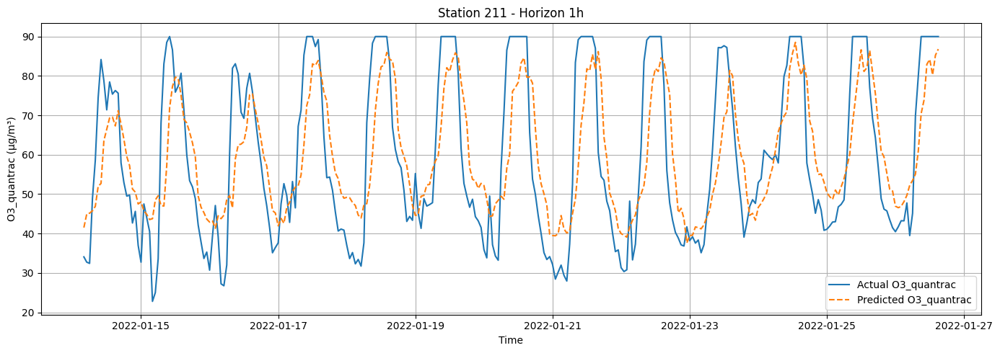

hour = 24


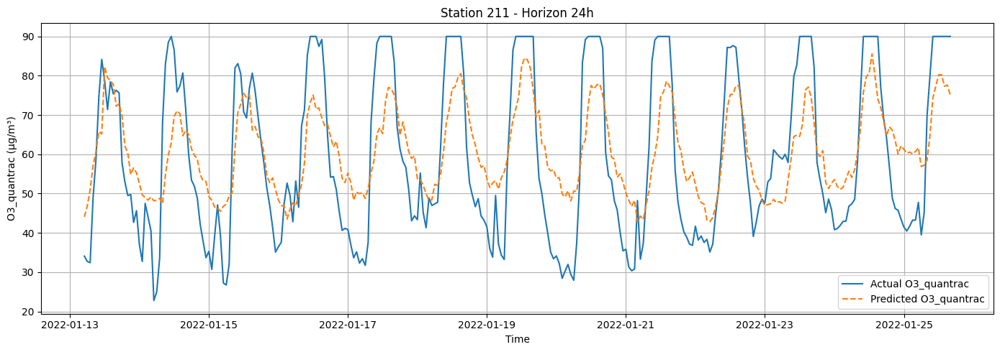

hour = 48


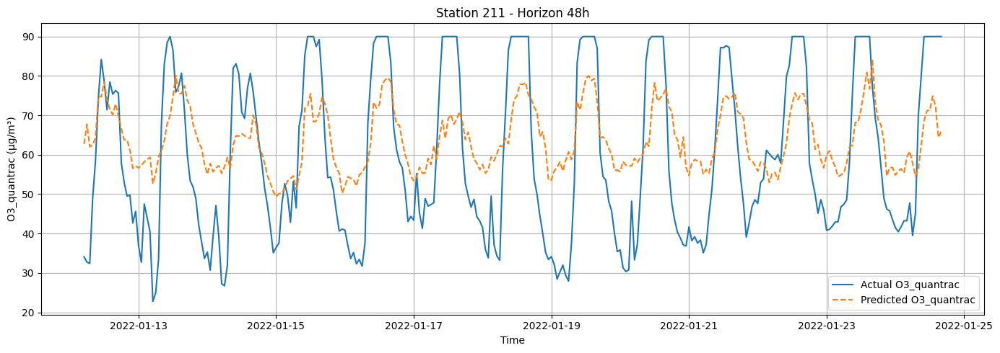

hour = 72


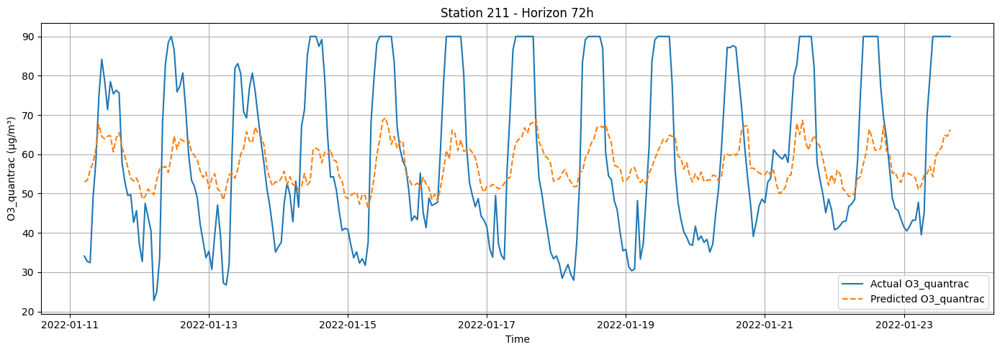

station_id = 212
hour = 1


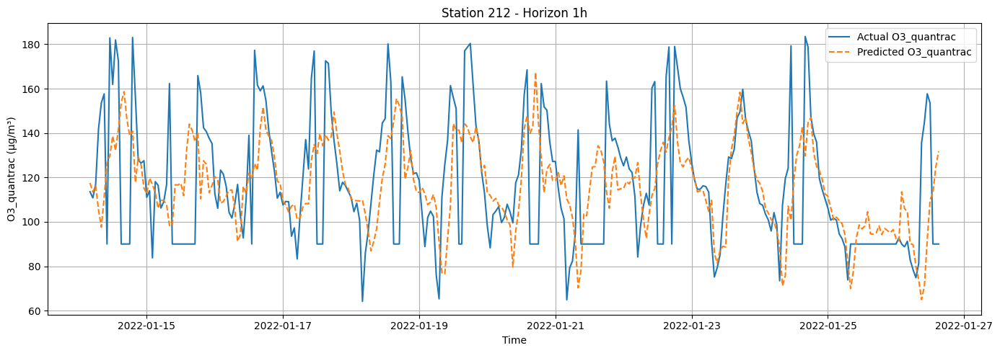

hour = 24


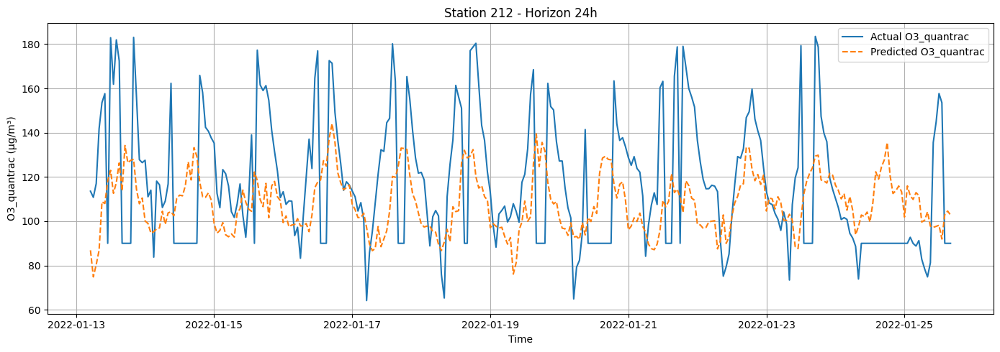

hour = 48


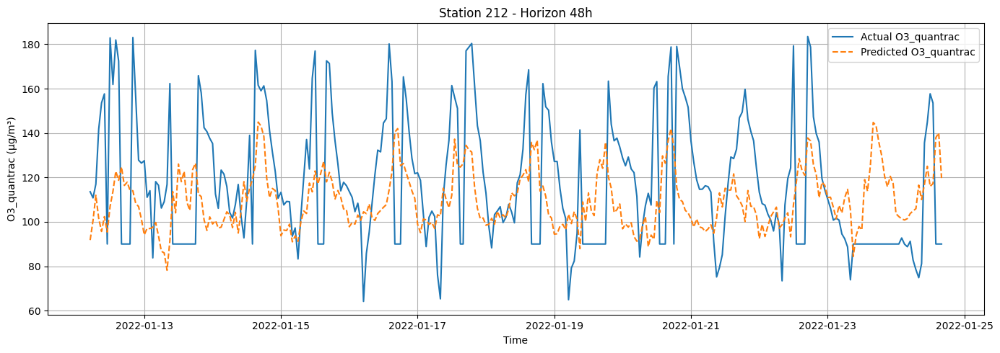

hour = 72


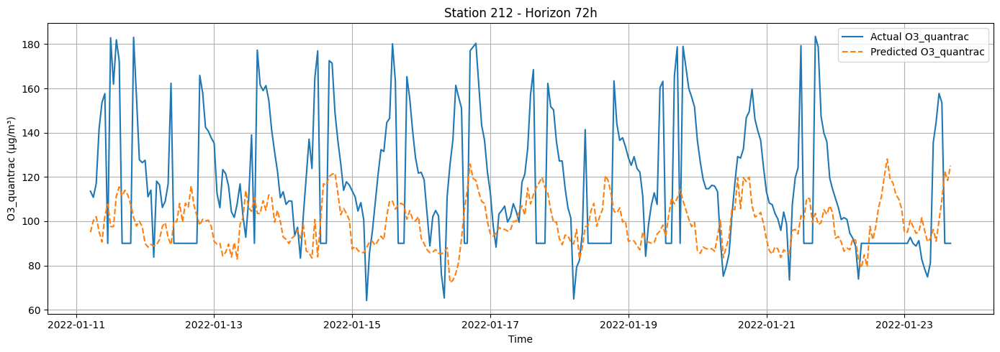

station_id = 213
hour = 1


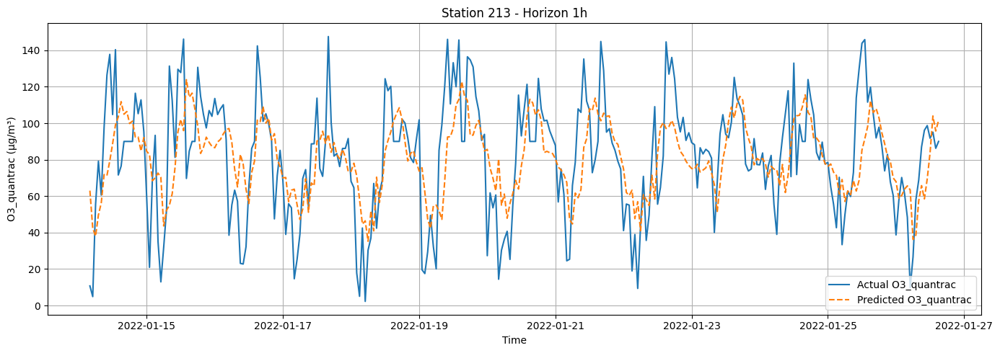

hour = 24


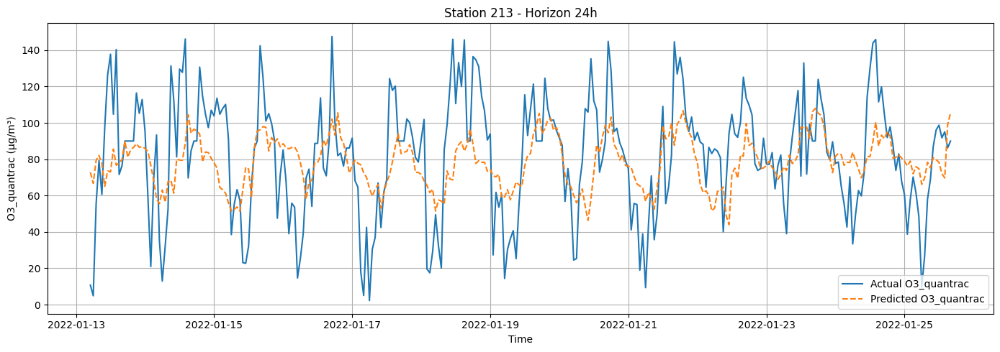

hour = 48


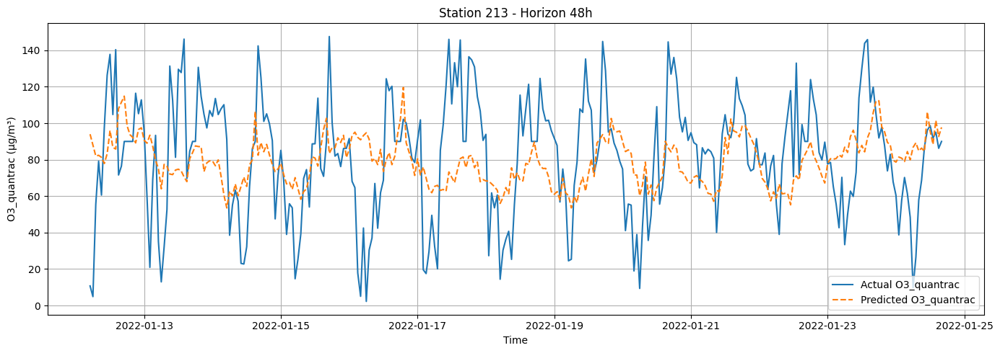

hour = 72


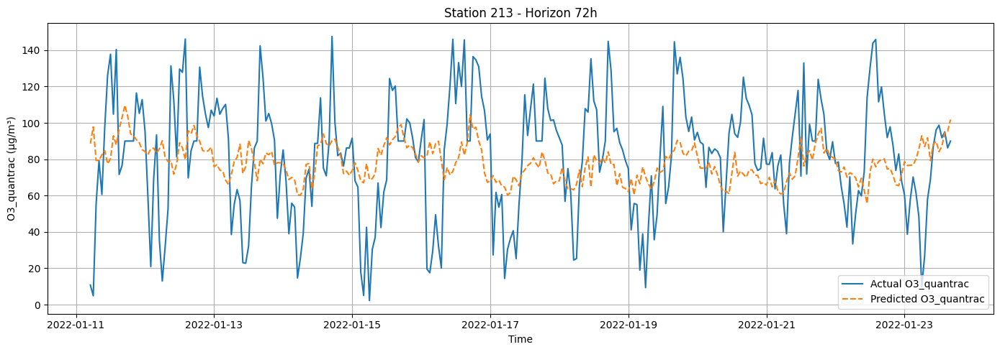

station_id = 214
hour = 1


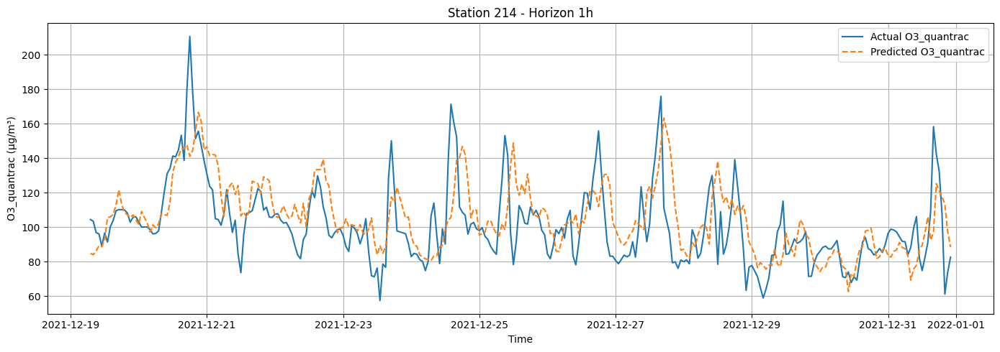

hour = 24


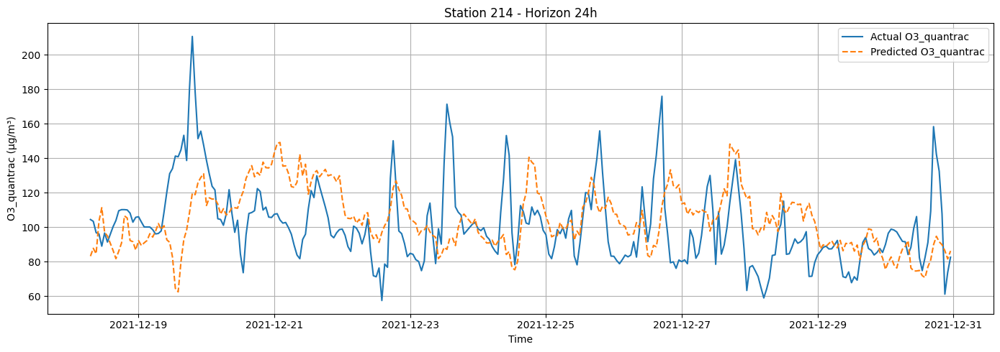

hour = 48


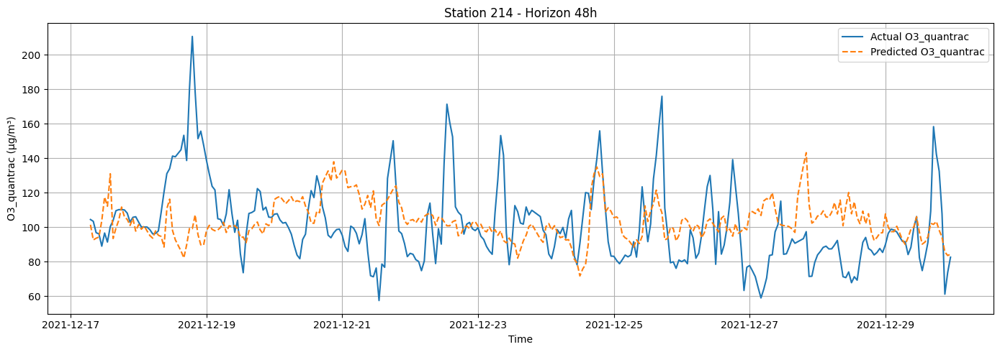

hour = 72


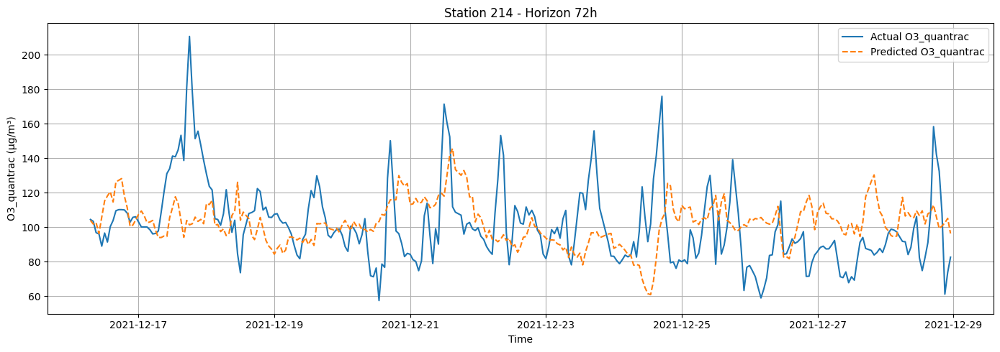

station_id = 215
hour = 1


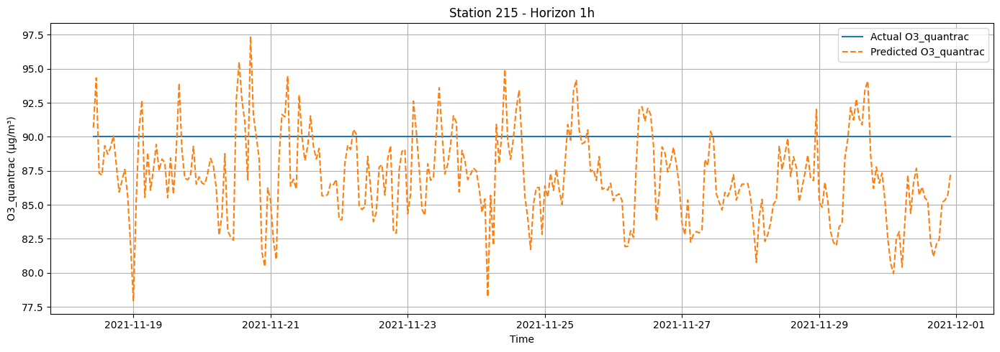

hour = 24


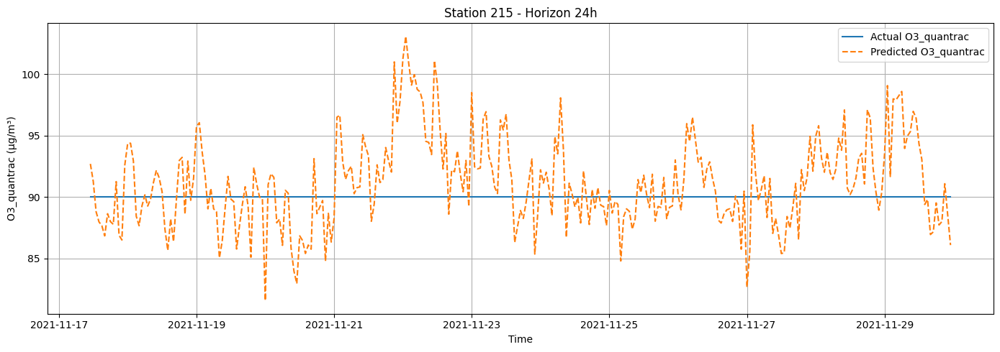

hour = 48


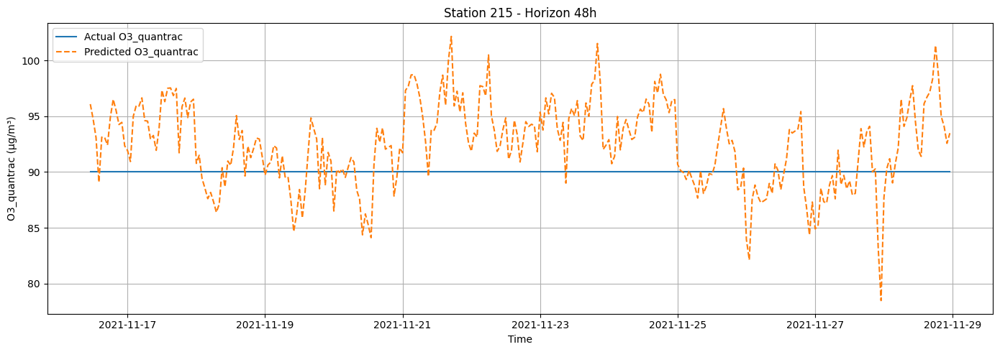

hour = 72


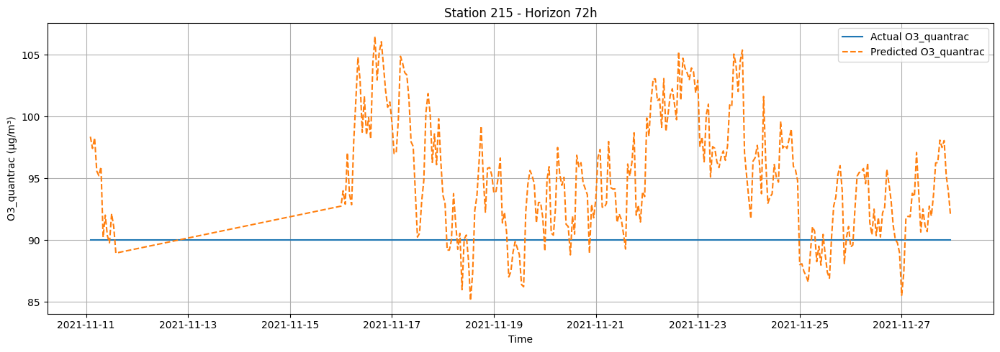

station_id = 216
hour = 1


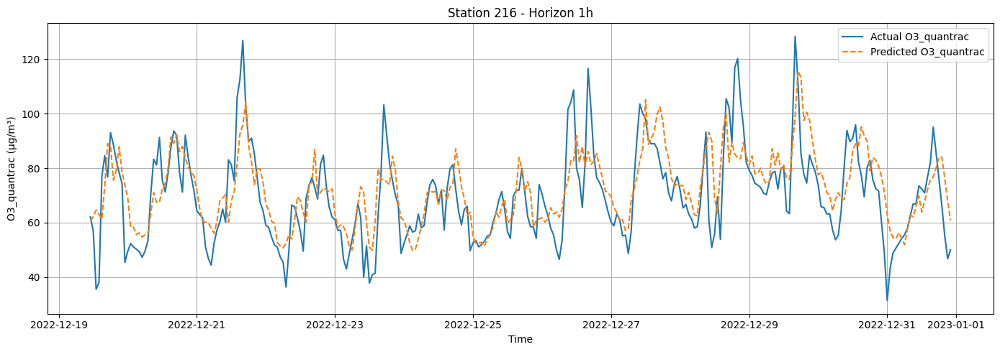

hour = 24


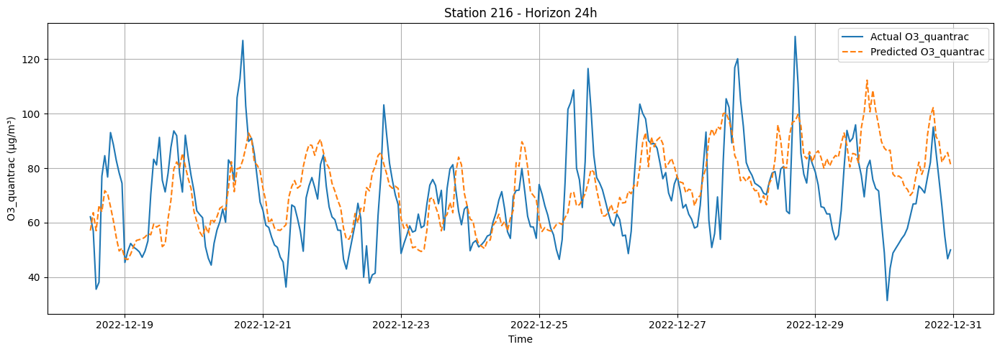

hour = 48


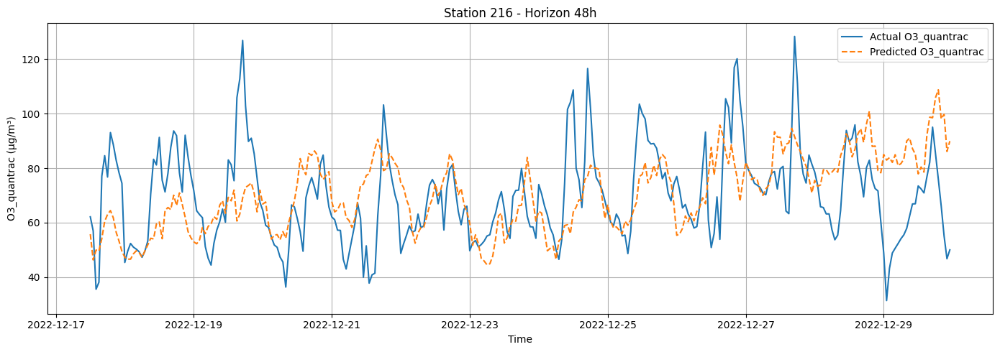

hour = 72


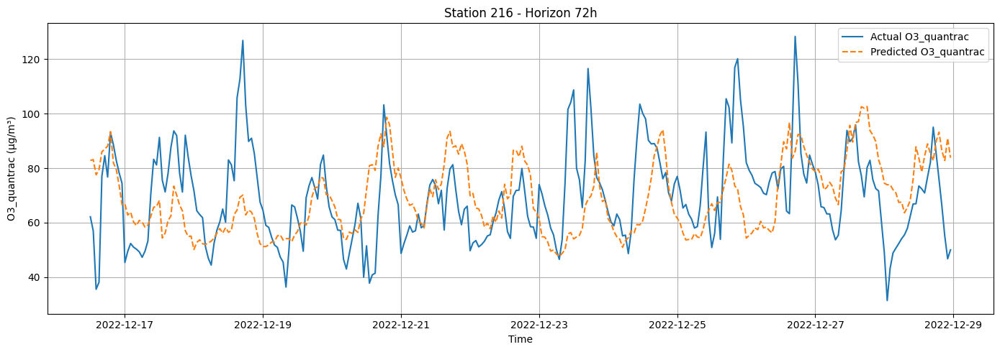

In [19]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in [1, 24, 48, 72]:
        print(f"hour = {hour}")
        plot_timeseries_example(df_o3, o3_models_by_h[hour], horizon_h=hour, station_id=int(station_id), target_col=label, LIGHTGBM_DIR=LIGHTGBM_DIR)

## Training for CO

In [20]:
label = "CO_quantrac"

# Add rolling features for LABEL
df_co = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Start running model
co_all_metrics = []
co_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_co, horizon_h=h, target_col=label)
    co_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    co_all_metrics.append(metrics_by_station)

co_df_metrics_all = pd.concat(co_all_metrics, ignore_index=True)
co_df_metrics_all = co_df_metrics_all.sort_values(["station", "horizon_h"])
co_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
co_df_metrics_all


===== Training LightGBM for horizon = 1h, target_col = CO_quantrac =====

X.shape = (38542, 42)
y.shape = (38542, 3)

Number of features: 42

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
CO_quantrac_roll3_mean
CO_quantrac_roll3_std
CO_quantrac_roll6_mean
CO_quantrac_roll6_std
CO_quantrac_roll12_mean
CO_quantrac_roll12_std
CO_quantrac_roll24_mean
CO_quantrac_roll24_std

Label:
date
station_id
CO_quantrac_t_plus_1h

X_train.shape: (26976, 4

,date,target
0,2022-01-02,731.7200450000
1,2022-01-03,756.2255041667
2,2022-01-04,753.0859416667
3,2022-01-05,749.9758250000
4,2022-01-06,767.3655791667
5,2022-01-07,756.1483083333
6,2022-01-08,759.4446500000
7,2022-01-09,727.0470708333
8,2022-01-10,735.6006875000
9,2022-01-11,731.8793708333


,date,target
0,2022-01-02,729.1228801079
1,2022-01-03,736.4150112020
2,2022-01-04,711.8201509385
3,2022-01-05,718.1803539548
4,2022-01-06,721.7421631482
5,2022-01-07,751.0841587257
6,2022-01-08,723.9465968735
7,2022-01-09,696.4499825693
8,2022-01-10,714.4632626476
9,2022-01-11,713.4951725416


sid = 212, grp =                     date  station_id  y_true         y_pred
8869 2021-11-19 09:00:00         212     0.0  57.7609302273
8870 2021-11-19 10:00:00         212     0.0  37.2014751038
8871 2021-11-19 11:00:00         212     0.0  42.5992096670
8872 2021-11-19 12:00:00         212     0.0  29.4360233886
8873 2021-11-19 13:00:00         212    90.0  86.1075956183
...                  ...         ...     ...            ...
9739 2022-01-26 11:00:00         212     0.0  47.8742284899
9740 2022-01-26 12:00:00         212     0.0  55.6381612647
9741 2022-01-26 13:00:00         212    90.0  42.7475127570
9742 2022-01-26 14:00:00         212    90.0  94.8903222847
9743 2022-01-26 15:00:00         212    90.0  95.2483959858

[875 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11,

,date,target
0,2021-11-19,66.0000000000
1,2021-11-20,82.5000000000
2,2021-11-21,90.0000000000
3,2021-11-23,82.5000000000
4,2021-11-24,75.0000000000
5,2021-11-25,82.5000000000
6,2021-11-26,73.4045672647
7,2021-11-27,90.0000000000
8,2021-11-28,78.7500000000
9,2021-11-29,86.2500000000


,date,target
0,2021-11-19,86.0600391566
1,2021-11-20,98.2452830346
2,2021-11-21,100.7690393960
3,2021-11-23,153.4766222686
4,2021-11-24,122.3501094181
5,2021-11-25,100.5998161104
6,2021-11-26,92.7347689339
7,2021-11-27,106.1413814895
8,2021-11-28,106.3430281326
9,2021-11-29,125.5478699482


sid = 213, grp =                      date  station_id       y_true           y_pred
14768 2021-12-20 13:00:00         213   719.688000   775.7324770218
14769 2021-12-20 14:00:00         213   789.403000   826.7806235180
14770 2021-12-20 15:00:00         213   857.208000   982.2879788950
14771 2021-12-20 16:00:00         213  1507.372000  1003.6634728755
14772 2021-12-20 17:00:00         213  1783.940000   900.1679438146
...                   ...         ...          ...              ...
15650 2022-01-26 11:00:00         213   829.513000  1098.3506071106
15651 2022-01-26 12:00:00         213   732.485000  1087.5214527349
15652 2022-01-26 13:00:00         213   747.001000   905.8954531697
15653 2022-01-26 14:00:00         213  1143.517000   953.1778581807
15654 2022-01-26 15:00:00         213  1573.294286  1006.7963158764

[887 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23), datetime.date(

,date,target
0,2021-12-20,1399.7000909091
1,2021-12-21,1255.2726377000
2,2021-12-22,1226.0980621458
3,2021-12-23,1124.3997344708
4,2021-12-24,1388.4261791773
5,2021-12-25,1471.1421595833
6,2021-12-26,793.1582542333
7,2021-12-27,1182.8786234348
8,2021-12-28,1278.5494959478
9,2021-12-29,1033.0129788333


,date,target
0,2021-12-20,1072.5023524526
1,2021-12-21,1220.4787341739
2,2021-12-22,1057.8018645332
3,2021-12-23,1170.6344990092
4,2021-12-24,1136.0899574512
5,2021-12-25,1255.8931943084
6,2021-12-26,939.4987602237
7,2021-12-27,1004.9012354656
8,2021-12-28,1204.5038526175
9,2021-12-29,1221.7131490644


sid = 214, grp =                      date  station_id        y_true           y_pred
20825 2021-11-23 09:00:00         214  1073.9930000   935.2868760275
20826 2021-11-23 10:00:00         214   713.7942857   950.2343521440
20827 2021-11-23 11:00:00         214   629.4184615   796.8941267885
20828 2021-11-23 12:00:00         214   798.1890000   847.9270197699
20829 2021-11-23 13:00:00         214  1086.2170000   758.4157007499
...                   ...         ...           ...              ...
21733 2021-12-31 18:00:00         214  2896.8970000  1099.0238969797
21734 2021-12-31 19:00:00         214  2935.6700000  1214.4983983606
21735 2021-12-31 20:00:00         214  1193.9622220  1303.3803510753
21736 2021-12-31 21:00:00         214  1136.0680000  1050.5876710104
21737 2021-12-31 22:00:00         214   957.1010000   922.6341997671

[913 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11, 26), da

,date,target
0,2021-11-23,544.0627782067
1,2021-11-24,1165.0799075542
2,2021-11-25,924.4349433917
3,2021-11-26,839.7307195375
4,2021-11-27,934.1588303542
5,2021-11-28,968.3780071917
6,2021-11-29,890.8086436167
7,2021-11-30,941.4998904292
8,2021-12-01,959.7216568125
9,2021-12-02,1142.7490615042


,date,target
0,2021-11-23,795.6927762606
1,2021-11-24,923.4901035294
2,2021-11-25,1084.1521910272
3,2021-11-26,847.1056165616
4,2021-11-27,851.4898874514
5,2021-11-28,902.2868216812
6,2021-11-29,875.8574809843
7,2021-11-30,888.8498906881
8,2021-12-01,1002.7877601456
9,2021-12-02,952.8306436360


sid = 215, grp =                      date  station_id    y_true          y_pred
24388 2021-11-07 01:00:00         215  691.4009  686.8032832267
24389 2021-11-07 02:00:00         215  691.6110  669.1364900097
24390 2021-11-07 03:00:00         215  690.7897  673.3185310810
24391 2021-11-07 04:00:00         215  705.7832  758.2172313604
24392 2021-11-07 05:00:00         215  784.6280  786.5952894340
...                   ...         ...       ...             ...
24851 2021-11-30 18:00:00         215  816.5250  817.2215658080
24852 2021-11-30 19:00:00         215  787.7604  803.8333549856
24853 2021-11-30 20:00:00         215  783.7112  768.8544042862
24854 2021-11-30 21:00:00         215  739.8194  711.6626605268
24855 2021-11-30 22:00:00         215  754.7174  679.3006989652

[468 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(2021, 11, 11), datetime.date(2021, 11, 16), datetim

,date,target
0,2021-11-07,734.6657217391
1,2021-11-08,723.7769916667
2,2021-11-09,798.0499281250
3,2021-11-10,744.9222833333
4,2021-11-11,787.2166866667
5,2021-11-16,770.7351375000
6,2021-11-17,827.5321708333
7,2021-11-18,839.7792500000
8,2021-11-19,791.3257333333
9,2021-11-20,840.2953652174


,date,target
0,2021-11-07,753.4142201588
1,2021-11-08,764.3061097189
2,2021-11-09,798.9847893481
3,2021-11-10,779.2874631426
4,2021-11-11,796.0601035662
5,2021-11-16,785.2087847682
6,2021-11-17,807.9950025256
7,2021-11-18,811.4246507841
8,2021-11-19,825.7590973678
9,2021-11-20,802.8580309379


sid = 216, grp =                      date  station_id           y_true           y_pred
36489 2022-09-20 12:00:00         216  1026.0037333333   957.7091250743
36490 2022-09-20 13:00:00         216  1125.7753333333   894.0112582058
36491 2022-09-20 14:00:00         216  1112.7782666667   944.2107149577
36492 2022-09-20 15:00:00         216  1156.5478000000  1220.4769187709
36493 2022-09-20 16:00:00         216  1274.2859333333  1283.9439322155
...                   ...         ...              ...              ...
38537 2022-12-31 18:00:00         216  2393.5627333333  1828.9752151889
38538 2022-12-31 19:00:00         216  2301.0542000000  1834.7726502769
38539 2022-12-31 20:00:00         216  2773.9180666667  1823.3878095383
38540 2022-12-31 21:00:00         216  1698.9842000000  1919.7116017814
38541 2022-12-31 22:00:00         216  1492.1779333333  1608.6893722289

[2053 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9, 22

,date,target
0,2022-09-20,1483.7643910256
1,2022-09-21,1000.3263524109
2,2022-09-22,1112.2177892034
3,2022-09-23,1497.8803327422
4,2022-09-24,1459.5626654960
...,...,...
83,2022-12-27,2316.5350419382
84,2022-12-28,2149.8431217671
85,2022-12-29,1551.6000178437
86,2022-12-30,1930.1186924252


,date,target
0,2022-09-20,1300.9582464870
1,2022-09-21,1145.6625293114
2,2022-09-22,1170.6759857385
3,2022-09-23,1302.8417591831
4,2022-09-24,1222.9624978735
...,...,...
83,2022-12-27,2291.8453501384
84,2022-12-28,2383.3632903713
85,2022-12-29,1983.9640110245
86,2022-12-30,2080.1807109866


Overall test metrics: {'rmse': 392.28, 'mae': 240.93, 'mape': 31.91, 'mnbe': -14.2, 'r': 0.85, 'n_samples': 5784}

===== Training LightGBM for horizon = 24h, target_col = CO_quantrac =====

X.shape = (38404, 42)
y.shape = (38404, 3)

Number of features: 42

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
CO_quantrac_roll3_mean
CO_quantrac_roll3_std
CO_quantrac_roll6_mean
CO_quantrac_roll6_std
CO_quantrac_roll12_mean
CO_quantrac_roll12_std
CO_

,date,target
0,2022-01-01,731.3736187500
1,2022-01-02,755.2617500000
2,2022-01-03,753.2976333333
3,2022-01-04,750.2822208333
4,2022-01-05,767.1594583333
5,2022-01-06,756.0671333333
6,2022-01-07,760.1601041667
7,2022-01-08,727.2762708333
8,2022-01-09,735.5497541667
9,2022-01-10,730.7214333333


,date,target
0,2022-01-01,742.2158777263
1,2022-01-02,726.4477988550
2,2022-01-03,843.7882287264
3,2022-01-04,853.6198541312
4,2022-01-05,718.2790012667
5,2022-01-06,731.2792568085
6,2022-01-07,720.5334160799
7,2022-01-08,720.3229005457
8,2022-01-09,723.8531402699
9,2022-01-10,828.8699857364


sid = 212, grp =                     date  station_id  y_true          y_pred
8827 2021-11-18 14:00:00         212    90.0  148.7731588813
8828 2021-11-18 15:00:00         212    90.0  123.5805410073
8829 2021-11-18 16:00:00         212    90.0  120.1839451099
8830 2021-11-18 17:00:00         212    90.0   92.4258157074
8831 2021-11-18 18:00:00         212    90.0   87.8588719561
...                  ...         ...     ...             ...
9693 2022-01-25 12:00:00         212     0.0  252.9878409217
9694 2022-01-25 13:00:00         212     0.0  258.2464766610
9695 2022-01-25 14:00:00         212    90.0  264.1881572433
9696 2022-01-25 15:00:00         212    90.0  264.1881572433
9697 2022-01-25 16:00:00         212    90.0  264.1881572433

[871 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.da

,date,target
0,2021-11-18,90.0000000000
1,2021-11-19,82.5000000000
2,2021-11-20,90.0000000000
3,2021-11-21,82.5000000000
4,2021-11-23,75.0000000000
5,2021-11-24,82.5000000000
6,2021-11-25,73.4045672647
7,2021-11-26,90.0000000000
8,2021-11-27,78.7500000000
9,2021-11-28,86.2500000000


,date,target
0,2021-11-18,112.8678090327
1,2021-11-19,111.4156953476
2,2021-11-20,110.5963213173
3,2021-11-21,138.4984600937
4,2021-11-23,181.8378958109
5,2021-11-24,124.9952560603
6,2021-11-25,130.6349317431
7,2021-11-26,116.8066760726
8,2021-11-27,160.3143834907
9,2021-11-28,150.3372240013


sid = 213, grp =                      date  station_id       y_true           y_pred
14702 2021-12-19 17:00:00         213  1507.372000   806.9932661235
14703 2021-12-19 18:00:00         213  1783.940000   915.4560558329
14704 2021-12-19 19:00:00         213  2843.799000   869.3670692297
14705 2021-12-19 20:00:00         213  2037.206000   866.0706425464
14706 2021-12-19 21:00:00         213  1601.153000   819.0258608674
...                   ...         ...          ...              ...
15581 2022-01-25 12:00:00         213   829.513000  1040.9732876991
15582 2022-01-25 13:00:00         213   732.485000   866.2358268998
15583 2022-01-25 14:00:00         213   747.001000   949.2772874643
15584 2022-01-25 15:00:00         213  1143.517000   927.0825924272
15585 2022-01-25 16:00:00         213  1573.294286   946.5329644929

[884 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(

,date,target
0,2021-12-20,1271.2052210333
1,2021-12-21,1195.2436038125
2,2021-12-22,1144.2716928042
3,2021-12-23,1405.1436501208
4,2021-12-24,1443.5384167727
5,2021-12-25,818.6249209000
6,2021-12-26,1158.5573057917
7,2021-12-27,1278.5494959478
8,2021-12-28,1058.9677605217
9,2021-12-29,785.7946377125


,date,target
0,2021-12-20,943.2250881719
1,2021-12-21,1319.3738953293
2,2021-12-22,1003.2929098297
3,2021-12-23,1237.5945671664
4,2021-12-24,1076.6438536232
5,2021-12-25,1296.2659777308
6,2021-12-26,963.1645803778
7,2021-12-27,1017.9775713555
8,2021-12-28,1516.2965912959
9,2021-12-29,1338.2313230810


sid = 214, grp =                      date  station_id       y_true          y_pred
20737 2021-11-22 14:00:00         214  1086.217000  748.1666584827
20738 2021-11-22 15:00:00         214    90.000000  757.6206009414
20739 2021-11-22 16:00:00         214    90.000000  821.7148532610
20740 2021-11-22 17:00:00         214    90.000000  842.5895815629
20741 2021-11-22 18:00:00         214    90.000000  935.2115808191
...                   ...         ...          ...             ...
21641 2021-12-30 19:00:00         214  2896.897000  999.6891785382
21642 2021-12-30 20:00:00         214  2935.670000  972.2342283641
21643 2021-12-30 21:00:00         214  1193.962222  893.8046054740
21644 2021-12-30 22:00:00         214  1136.068000  706.7361177329
21645 2021-12-30 23:00:00         214   957.101000  708.5863192105

[909 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11, 26

,date,target
0,2021-11-22,429.5191925900
1,2021-11-23,1145.2795742208
2,2021-11-24,949.0102767250
3,2021-11-25,834.8522612042
4,2021-11-26,926.0970386875
5,2021-11-27,972.0149655250
6,2021-11-28,900.5416852833
7,2021-11-29,927.0953070958
8,2021-11-30,959.1088651458
9,2021-12-01,1143.2871672750


,date,target
0,2021-11-22,813.5859301438
1,2021-11-23,868.0664847527
2,2021-11-24,932.5143262556
3,2021-11-25,1051.4403367601
4,2021-11-26,817.0607573339
5,2021-11-27,811.1270330244
6,2021-11-28,819.7322601744
7,2021-11-29,935.3328403714
8,2021-11-30,879.5294920567
9,2021-12-01,873.4618264327


sid = 215, grp =                      date  station_id    y_true          y_pred
24276 2021-11-06 05:00:00         215  705.7832  717.4172049544
24277 2021-11-06 06:00:00         215  784.6280  725.1456637210
24278 2021-11-06 07:00:00         215  782.1259  724.4781443328
24279 2021-11-06 08:00:00         215  733.2872  744.9521688090
24280 2021-11-06 09:00:00         215  720.7385  707.0767891084
...                   ...         ...       ...             ...
24736 2021-11-29 19:00:00         215  816.5250  805.7704289057
24737 2021-11-29 20:00:00         215  787.7604  826.1793597808
24738 2021-11-29 21:00:00         215  783.7112  815.5992206992
24739 2021-11-29 22:00:00         215  739.8194  779.3193705568
24740 2021-11-29 23:00:00         215  754.7174  764.1888280534

[465 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(2021, 11, 11), datetime

,date,target
0,2021-11-06,743.9731473684
1,2021-11-07,723.1013291667
2,2021-11-08,797.6798656250
3,2021-11-09,744.9732166667
4,2021-11-10,776.1213375000
5,2021-11-11,776.8784933333
6,2021-11-16,827.4358750000
7,2021-11-17,835.3440708333
8,2021-11-18,796.6140458333
9,2021-11-19,835.2636916667


,date,target
0,2021-11-06,712.5961672870
1,2021-11-07,718.5037317472
2,2021-11-08,759.0422420486
3,2021-11-09,781.3578597423
4,2021-11-10,727.1336461468
5,2021-11-11,726.2324396996
6,2021-11-16,788.6895583114
7,2021-11-17,742.0471752947
8,2021-11-18,761.1449201346
9,2021-11-19,761.8068803754


sid = 216, grp =                      date  station_id           y_true           y_pred
36354 2022-09-19 16:00:00         216  1156.5478000000  1157.2028590598
36355 2022-09-19 17:00:00         216  1274.2859333333  1365.8916302854
36356 2022-09-19 18:00:00         216  1769.7035333333  1906.0472051362
36357 2022-09-19 19:00:00         216  2035.3788666667  1715.6475232118
36358 2022-09-19 20:00:00         216  1619.0904666667  1743.9747158574
...                   ...         ...              ...              ...
38399 2022-12-30 19:00:00         216  2393.5627333333  1755.1695302811
38400 2022-12-30 20:00:00         216  2301.0542000000  1871.1094472544
38401 2022-12-30 21:00:00         216  2773.9180666667  1788.6374237142
38402 2022-12-30 22:00:00         216  1698.9842000000  1607.6159245728
38403 2022-12-30 23:00:00         216  1492.1779333333  1698.0734457973

[2050 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21

,date,target
0,2022-09-20,1004.9674618126
1,2022-09-21,1110.1471780922
2,2022-09-22,1428.8971271866
3,2022-09-23,1517.5716321626
4,2022-09-24,1382.7482808119
...,...,...
82,2022-12-26,2373.7316919382
83,2022-12-27,2158.1972412116
84,2022-12-28,1552.5238289548
85,2022-12-29,1900.4054229807


,date,target
0,2022-09-20,1337.3402108368
1,2022-09-21,1379.1653810066
2,2022-09-22,1243.7025978964
3,2022-09-23,1282.8506493649
4,2022-09-24,1303.6143451995
...,...,...
82,2022-12-26,1817.3335555952
83,2022-12-27,1911.3038125233
84,2022-12-28,1923.1184598758
85,2022-12-29,1750.7560382522


Overall test metrics: {'rmse': 480.81, 'mae': 302.72, 'mape': 48.74, 'mnbe': -31.27, 'r': 0.76, 'n_samples': 5764}

===== Training LightGBM for horizon = 48h, target_col = CO_quantrac =====

X.shape = (38260, 42)
y.shape = (38260, 3)

Number of features: 42

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
CO_quantrac_roll3_mean
CO_quantrac_roll3_std
CO_quantrac_roll6_mean
CO_quantrac_roll6_std
CO_quantrac_roll12_mean
CO_quantrac_roll12_std
CO

,date,target
0,2021-11-30,728.5217500000
1,2022-01-01,755.2617500000
2,2022-01-02,753.2976333333
3,2022-01-03,750.2822208333
4,2022-01-04,767.1594583333
5,2022-01-05,756.0671333333
6,2022-01-06,760.1601041667
7,2022-01-07,727.2762708333
8,2022-01-08,735.5497541667
9,2022-01-09,730.7214333333


,date,target
0,2021-11-30,731.1534210217
1,2022-01-01,792.7227779632
2,2022-01-02,844.1792956821
3,2022-01-03,814.5999348501
4,2022-01-04,766.0091201074
5,2022-01-05,751.4182373987
6,2022-01-06,750.6185283422
7,2022-01-07,753.5344130374
8,2022-01-08,770.0725027697
9,2022-01-09,843.1299409540


sid = 212, grp =                     date  station_id  y_true          y_pred
8783 2021-11-17 18:00:00         212    90.0  301.6267797216
8784 2021-11-17 19:00:00         212    90.0  250.6877093521
8785 2021-11-17 20:00:00         212    90.0  252.2462376920
8786 2021-11-17 21:00:00         212    90.0  209.4580685774
8787 2021-11-17 22:00:00         212    90.0  206.5058692795
...                  ...         ...     ...             ...
9645 2022-01-24 12:00:00         212     0.0  200.8765142052
9646 2022-01-24 13:00:00         212     0.0  217.3524431509
9647 2022-01-24 14:00:00         212    90.0  220.9719540001
9648 2022-01-24 15:00:00         212    90.0  218.7564241717
9649 2022-01-24 16:00:00         212    90.0  210.3565148275

[867 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 17), datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.da

,date,target
0,2021-11-18,82.5000000000
1,2021-11-19,90.0000000000
2,2021-11-20,82.5000000000
3,2021-11-21,75.0000000000
4,2021-11-23,82.5000000000
5,2021-11-24,73.4045672647
6,2021-11-25,90.0000000000
7,2021-11-26,78.7500000000
8,2021-11-27,86.2500000000
9,2021-11-28,90.0000000000


,date,target
0,2021-11-18,222.7832502188
1,2021-11-19,219.5107863262
2,2021-11-20,224.1782790207
3,2021-11-21,319.7857225596
4,2021-11-23,358.1664671790
5,2021-11-24,226.4781059857
6,2021-11-25,233.0621470367
7,2021-11-26,234.1654769958
8,2021-11-27,298.4715101432
9,2021-11-28,268.8628872561


sid = 213, grp =                      date  station_id        y_true          y_pred
14634 2021-12-18 21:00:00         213  1601.1530000  910.3072893663
14635 2021-12-18 22:00:00         213  1306.4400000  885.2013397393
14636 2021-12-18 23:00:00         213   992.8180000  886.0876886451
14637 2021-12-19 00:00:00         213   957.6740000  794.8375003578
14638 2021-12-19 01:00:00         213   938.9430508  817.1813379672
...                   ...         ...           ...             ...
15509 2022-01-24 12:00:00         213   829.5130000  899.9940462009
15510 2022-01-24 13:00:00         213   732.4850000  927.7053570636
15511 2022-01-24 14:00:00         213   747.0010000  923.9871125984
15512 2022-01-24 15:00:00         213  1143.5170000  859.3084166654
15513 2022-01-24 16:00:00         213  1573.2942860  839.1516753631

[880 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 18), datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(

,date,target
0,2021-12-19,1271.2052210333
1,2021-12-20,1195.2436038125
2,2021-12-21,1144.2716928042
3,2021-12-22,1405.1436501208
4,2021-12-23,1423.3112273750
5,2021-12-24,783.8806278909
6,2021-12-25,1158.5573057917
7,2021-12-26,1272.0877867417
8,2021-12-27,1029.0801311739
9,2021-12-28,801.0007958739


,date,target
0,2021-12-19,830.3586142008
1,2021-12-20,846.7370550614
2,2021-12-21,979.8857964131
3,2021-12-22,960.9137909567
4,2021-12-23,1060.6910920235
5,2021-12-24,1009.2203193871
6,2021-12-25,1227.5668387503
7,2021-12-26,1036.0535472298
8,2021-12-27,878.3646152603
9,2021-12-28,1319.2397605174


sid = 214, grp =                      date  station_id       y_true           y_pred
20644 2021-11-21 17:00:00         214    90.000000   939.3177617806
20645 2021-11-21 18:00:00         214    90.000000  1029.0183257824
20646 2021-11-21 19:00:00         214    90.000000  1016.0225135431
20647 2021-11-21 20:00:00         214    90.000000   955.7714995061
20648 2021-11-21 21:00:00         214    90.000000   935.3630600993
...                   ...         ...          ...              ...
21545 2021-12-29 19:00:00         214  2896.897000  1205.5579554604
21546 2021-12-29 20:00:00         214  2935.670000  1150.7560878600
21547 2021-12-29 21:00:00         214  1193.962222  1103.0961433548
21548 2021-12-29 22:00:00         214  1136.068000   989.5422080002
21549 2021-12-29 23:00:00         214   957.101000   875.6862253047

[906 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(

,date,target
0,2021-11-22,1145.2795742208
1,2021-11-23,949.0102767250
2,2021-11-24,834.8522612042
3,2021-11-25,926.0970386875
4,2021-11-26,972.0149655250
5,2021-11-27,900.5416852833
6,2021-11-28,927.0953070958
7,2021-11-29,959.1088651458
8,2021-11-30,1143.2871672750
9,2021-12-01,946.0703518792


,date,target
0,2021-11-22,838.9265022119
1,2021-11-23,812.5178842348
2,2021-11-24,873.4815019980
3,2021-11-25,913.9212317020
4,2021-11-26,808.1502162552
5,2021-11-27,785.6541586986
6,2021-11-28,865.7081197477
7,2021-11-29,890.6371210403
8,2021-11-30,816.9511616068
9,2021-12-01,839.4902006476


sid = 215, grp =                      date  station_id    y_true          y_pred
24160 2021-11-05 09:00:00         215  720.7385  766.3247136016
24161 2021-11-05 10:00:00         215  726.4876  778.4398185499
24162 2021-11-05 11:00:00         215  752.3108  769.8613174361
24163 2021-11-05 12:00:00         215  765.1460  760.3235609070
24164 2021-11-05 13:00:00         215  754.2972  760.3235609070
...                   ...         ...       ...             ...
24616 2021-11-28 19:00:00         215  816.5250  819.1212033329
24617 2021-11-28 20:00:00         215  787.7604  790.9052756816
24618 2021-11-28 21:00:00         215  783.7112  779.0053820921
24619 2021-11-28 22:00:00         215  739.8194  777.1846819462
24620 2021-11-28 23:00:00         215  754.7174  795.2119375779

[461 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.

,date,target
0,2021-11-05,741.9777000000
1,2021-11-06,723.1013291667
2,2021-11-07,797.6798656250
3,2021-11-08,744.9732166667
4,2021-11-09,776.1213375000
5,2021-11-10,788.1575208333
6,2021-11-11,839.7238600000
7,2021-11-16,835.3440708333
8,2021-11-17,796.6140458333
9,2021-11-18,835.2636916667


,date,target
0,2021-11-05,754.0650333594
1,2021-11-06,742.6700210140
2,2021-11-07,791.1888747991
3,2021-11-08,765.9381652808
4,2021-11-09,743.1366671815
5,2021-11-10,755.3036433715
6,2021-11-11,753.2690108854
7,2021-11-16,759.0254003860
8,2021-11-17,761.2422520145
9,2021-11-18,770.8235360990


sid = 216, grp =                      date  station_id           y_true           y_pred
36214 2022-09-18 20:00:00         216  1619.0904666667  1558.3644750602
36215 2022-09-18 21:00:00         216  1787.0966666667  1372.9504248575
36216 2022-09-18 22:00:00         216  2523.3422666667  1320.9453173844
36217 2022-09-18 23:00:00         216  1585.6421333333  1413.6695297321
36218 2022-09-19 00:00:00         216   789.5276923077  1000.0087308462
...                   ...         ...              ...              ...
38255 2022-12-29 19:00:00         216  2393.5627333333  1864.5424493343
38256 2022-12-29 20:00:00         216  2301.0542000000  2084.4621734047
38257 2022-12-29 21:00:00         216  2773.9180666667  1959.5658467557
38258 2022-12-29 22:00:00         216  1698.9842000000  2044.2063876112
38259 2022-12-29 23:00:00         216  1492.1779333333  1716.8660647416

[2046 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 18), datetime.date(2022, 9, 19), datetime.date(2022, 9, 20

,date,target
0,2022-09-19,1004.9674618126
1,2022-09-20,1110.1471780922
2,2022-09-21,1428.8971271866
3,2022-09-22,1517.5716321626
4,2022-09-23,1382.7482808119
...,...,...
82,2022-12-25,2373.7316919382
83,2022-12-26,2158.1972412116
84,2022-12-27,1552.5238289548
85,2022-12-28,1900.4054229807


,date,target
0,2022-09-19,1417.2394635822
1,2022-09-20,1474.4167634293
2,2022-09-21,1415.3296860657
3,2022-09-22,1176.7887168956
4,2022-09-23,1367.6099669049
...,...,...
82,2022-12-25,1818.0159073028
83,2022-12-26,1931.5142718047
84,2022-12-27,1918.0006445741
85,2022-12-28,1907.6471869128


Overall test metrics: {'rmse': 494.65, 'mae': 312.67, 'mape': 48.02, 'mnbe': -28.86, 'r': 0.75, 'n_samples': 5741}

===== Training LightGBM for horizon = 72h, target_col = CO_quantrac =====

X.shape = (38116, 42)
y.shape = (38116, 3)

Number of features: 42

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
CO_quantrac_roll3_mean
CO_quantrac_roll3_std
CO_quantrac_roll6_mean
CO_quantrac_roll6_std
CO_quantrac_roll12_mean
CO_quantrac_roll12_std
CO

,date,target
0,2021-11-30,755.2617500000
1,2022-01-01,753.2976333333
2,2022-01-02,750.2822208333
3,2022-01-03,767.1594583333
4,2022-01-04,756.0671333333
5,2022-01-05,760.1601041667
6,2022-01-06,727.2762708333
7,2022-01-07,735.5497541667
8,2022-01-08,730.7214333333
9,2022-01-09,744.8777166667


,date,target
0,2021-11-30,748.5130168722
1,2022-01-01,936.0825796357
2,2022-01-02,876.0390584220
3,2022-01-03,817.5488319293
4,2022-01-04,844.2436444965
5,2022-01-05,843.3949465413
6,2022-01-06,839.4876374050
7,2022-01-07,856.5506928027
8,2022-01-08,879.1607100060
9,2022-01-09,902.6954088648


sid = 212, grp =                     date  station_id  y_true          y_pred
8738 2021-11-16 21:00:00         212    90.0  388.2103064943
8739 2021-11-16 22:00:00         212    90.0  388.7719853648
8740 2021-11-16 23:00:00         212    90.0  388.2103064943
8741 2021-11-17 00:00:00         212    90.0  388.2103064943
8742 2021-11-17 01:00:00         212    90.0  388.2103064943
...                  ...         ...     ...             ...
9597 2022-01-23 12:00:00         212     0.0  125.5428938038
9598 2022-01-23 13:00:00         212     0.0  117.9936846259
9599 2022-01-23 14:00:00         212    90.0  119.9367539261
9600 2022-01-23 15:00:00         212    90.0  130.4198524514
9601 2022-01-23 16:00:00         212    90.0  128.6062792586

[864 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 16), datetime.date(2021, 11, 17), datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.da

,date,target
0,2021-11-17,82.5000000000
1,2021-11-18,90.0000000000
2,2021-11-19,82.5000000000
3,2021-11-20,75.0000000000
4,2021-11-21,82.5000000000
5,2021-11-23,73.4045672647
6,2021-11-24,90.0000000000
7,2021-11-25,78.7500000000
8,2021-11-26,86.2500000000
9,2021-11-27,90.0000000000


,date,target
0,2021-11-17,386.6408700125
1,2021-11-18,384.0830316245
2,2021-11-19,385.2876390842
3,2021-11-20,385.6030139677
4,2021-11-21,475.4200068613
5,2021-11-23,446.7894934434
6,2021-11-24,392.1465141678
7,2021-11-25,386.9895476503
8,2021-11-26,382.2227849827
9,2021-11-27,451.6047055617


sid = 213, grp =                      date  station_id        y_true           y_pred
14566 2021-12-18 01:00:00         213   938.9430508   924.4930592498
14567 2021-12-18 02:00:00         213  1497.3752540  1105.2658833620
14568 2021-12-18 03:00:00         213  1953.3570000   886.6592735178
14569 2021-12-18 04:00:00         213  1948.7730000   940.3722849197
14570 2021-12-18 05:00:00         213  2270.0350000  1027.0647112154
...                   ...         ...           ...              ...
15437 2022-01-23 12:00:00         213   829.5130000  1062.4790891432
15438 2022-01-23 13:00:00         213   732.4850000  1097.1886994743
15439 2022-01-23 14:00:00         213   747.0010000  1117.9811148208
15440 2022-01-23 15:00:00         213  1143.5170000  1106.9590791796
15441 2022-01-23 16:00:00         213  1573.2942860  1069.6434863977

[876 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 18), datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), da

,date,target
0,2021-12-18,1284.8370132522
1,2021-12-19,1195.2436038125
2,2021-12-20,1144.2716928042
3,2021-12-21,1405.1436501208
4,2021-12-22,1423.3112273750
5,2021-12-23,766.1835508500
6,2021-12-24,1211.9247241909
7,2021-12-25,1272.0877867417
8,2021-12-26,1005.2127669500
9,2021-12-27,802.7794745783


,date,target
0,2021-12-18,1062.4536219251
1,2021-12-19,808.4435162010
2,2021-12-20,812.7246646893
3,2021-12-21,1081.7426892007
4,2021-12-22,962.5890182208
5,2021-12-23,992.5876003361
6,2021-12-24,1100.3672994910
7,2021-12-25,1262.1068241048
8,2021-12-26,995.0619251833
9,2021-12-27,899.5227579859


sid = 214, grp =                      date  station_id        y_true           y_pred
20552 2021-11-20 21:00:00         214    90.0000000   884.7754604323
20553 2021-11-20 22:00:00         214  1624.7252830   873.4617851131
20554 2021-11-20 23:00:00         214   954.2496429   896.3406813328
20555 2021-11-21 00:00:00         214   650.3550000   735.4803463429
20556 2021-11-21 01:00:00         214   625.9070000   755.3361274061
...                   ...         ...           ...              ...
21449 2021-12-28 19:00:00         214  2896.8970000  1460.9260706275
21450 2021-12-28 20:00:00         214  2935.6700000  1215.4502578758
21451 2021-12-28 21:00:00         214  1193.9622220   938.4087722329
21452 2021-12-28 22:00:00         214  1136.0680000  1101.1131648236
21453 2021-12-28 23:00:00         214   957.1010000  1005.8774111174

[902 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), da

,date,target
0,2021-11-21,1145.2795742208
1,2021-11-22,949.0102767250
2,2021-11-23,834.8522612042
3,2021-11-24,926.0970386875
4,2021-11-25,972.0149655250
5,2021-11-26,900.5416852833
6,2021-11-27,927.0953070958
7,2021-11-28,959.1088651458
8,2021-11-29,1143.2871672750
9,2021-11-30,946.0703518792


,date,target
0,2021-11-21,867.8747550751
1,2021-11-22,762.4209415300
2,2021-11-23,800.1468684416
3,2021-11-24,860.5480827405
4,2021-11-25,856.9092411586
5,2021-11-26,809.2791641096
6,2021-11-27,822.2303650951
7,2021-11-28,785.6733285468
8,2021-11-29,800.9403626151
9,2021-11-30,788.4184751931


sid = 215, grp =                      date  station_id    y_true          y_pred
24043 2021-11-04 12:00:00         215  765.1460  726.2794854011
24044 2021-11-04 13:00:00         215  754.2972  728.4400921598
24045 2021-11-04 14:00:00         215  739.5329  716.6259551496
24046 2021-11-04 15:00:00         215  733.9939  717.2703660827
24047 2021-11-04 16:00:00         215  734.9489  761.2107812582
...                   ...         ...       ...             ...
24496 2021-11-27 19:00:00         215  816.5250  813.6221075861
24497 2021-11-27 20:00:00         215  787.7604  741.5747873619
24498 2021-11-27 21:00:00         215  783.7112  759.4446397687
24499 2021-11-27 22:00:00         215  739.8194  751.9659179861
24500 2021-11-27 23:00:00         215  754.7174  764.7360310906

[458 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 4), datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.d

,date,target
0,2021-11-04,744.1773833333
1,2021-11-05,723.1013291667
2,2021-11-06,797.6798656250
3,2021-11-07,744.9732166667
4,2021-11-08,776.1213375000
5,2021-11-09,788.1575208333
6,2021-11-10,808.5388125000
7,2021-11-11,882.6122733333
8,2021-11-16,796.6140458333
9,2021-11-17,835.2636916667


,date,target
0,2021-11-04,719.6079500689
1,2021-11-05,704.3487016529
2,2021-11-06,785.9172554848
3,2021-11-07,768.0048484835
4,2021-11-08,710.7768830622
5,2021-11-09,690.4552641772
6,2021-11-10,723.3024913638
7,2021-11-11,711.5600724467
8,2021-11-16,703.4018724874
9,2021-11-17,713.8511483989


sid = 216, grp =                      date  station_id           y_true           y_pred
36073 2022-09-17 23:00:00         216  1585.6421333333  1231.7494774502
36074 2022-09-18 00:00:00         216   789.5276923077  1115.1622663618
36075 2022-09-18 01:00:00         216   623.8159245283   807.6294231452
36076 2022-09-18 02:00:00         216   529.0570666667   759.3199689652
36077 2022-09-18 03:00:00         216   574.7379333333   788.1665333021
...                   ...         ...              ...              ...
38111 2022-12-28 19:00:00         216  2393.5627333333  2066.6285752677
38112 2022-12-28 20:00:00         216  2301.0542000000  1983.3275831472
38113 2022-12-28 21:00:00         216  2773.9180666667  1789.4035165722
38114 2022-12-28 22:00:00         216  1698.9842000000  1597.7162709967
38115 2022-12-28 23:00:00         216  1492.1779333333  1230.9268368414

[2043 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 17), datetime.date(2022, 9, 18), datetime.date(2022, 9, 19

,date,target
0,2022-09-18,1004.9674618126
1,2022-09-19,1110.1471780922
2,2022-09-20,1428.8971271866
3,2022-09-21,1517.5716321626
4,2022-09-22,1382.7482808119
...,...,...
82,2022-12-24,2373.7316919382
83,2022-12-25,2158.1972412116
84,2022-12-26,1552.5238289548
85,2022-12-27,1900.4054229807


,date,target
0,2022-09-18,1105.3248055548
1,2022-09-19,1377.1916181115
2,2022-09-20,1303.5498726681
3,2022-09-21,1417.7204022824
4,2022-09-22,1107.9987708035
...,...,...
82,2022-12-24,1988.1658205252
83,2022-12-25,1889.9468369103
84,2022-12-26,1974.6230955822
85,2022-12-27,1952.3366147124


Overall test metrics: {'rmse': 505.98, 'mae': 332.39, 'mape': 60.44, 'mnbe': -41.62, 'r': 0.73, 'n_samples': 5720}


,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples,avg_mnbe
0,211,1,50.52,40.34,5.42,2.98,0.57,588,2.92
6,211,24,66.73,50.93,6.79,-2.34,0.08,585,-2.32
12,211,48,61.86,47.75,6.44,-5.00,0.11,581,-4.85
18,211,72,136.46,116.52,15.69,-15.34,0.26,577,-15.63
1,212,1,37.53,30.37,31.36,-3.19,0.24,875,-9.12
7,212,24,123.61,109.14,120.21,-120.18,0.03,871,-132.02
13,212,48,138.12,107.91,114.61,-114.61,-0.07,867,-131.43
19,212,72,225.33,176.76,191.54,-191.54,-0.03,864,-216.46
2,213,1,410.72,300.05,69.49,-45.31,0.47,887,4.76
8,213,24,484.53,355.35,74.51,-44.99,0.17,884,5.32


station_id = 211
hour = 1


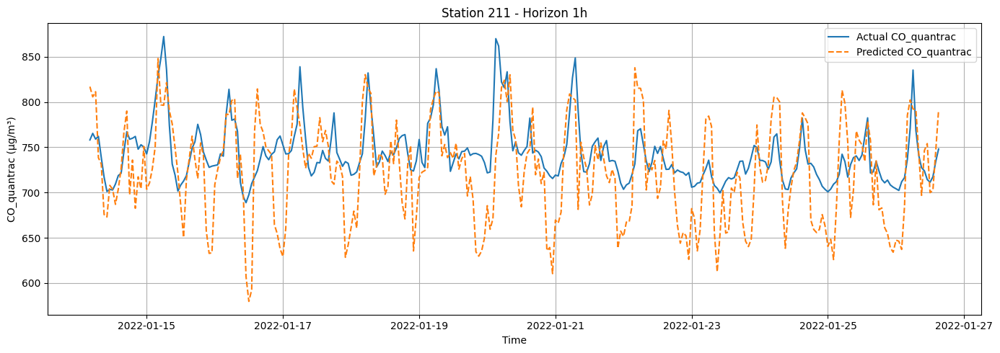

hour = 24


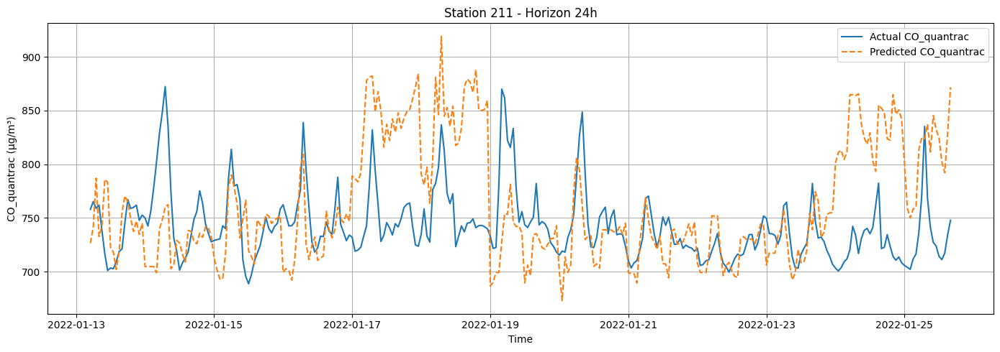

hour = 48


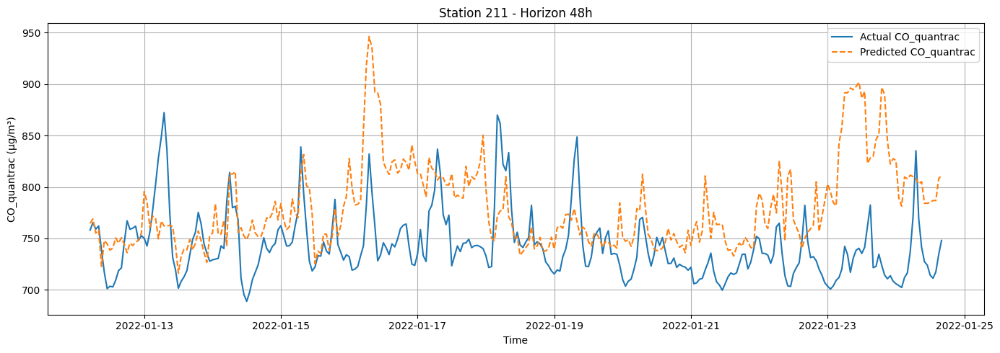

hour = 72


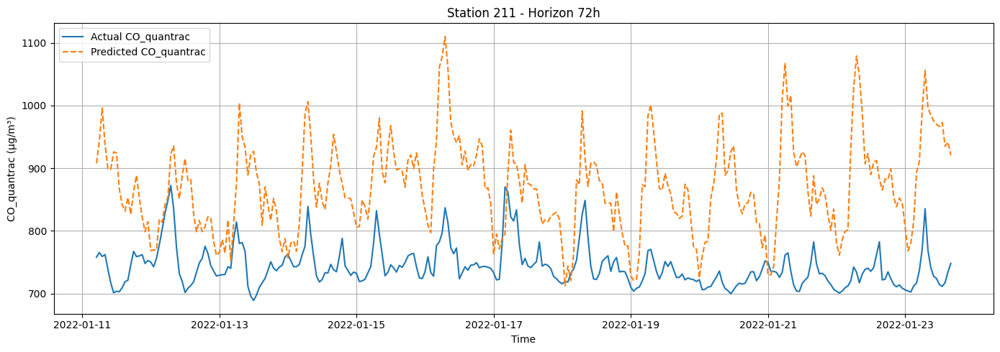

station_id = 212
hour = 1


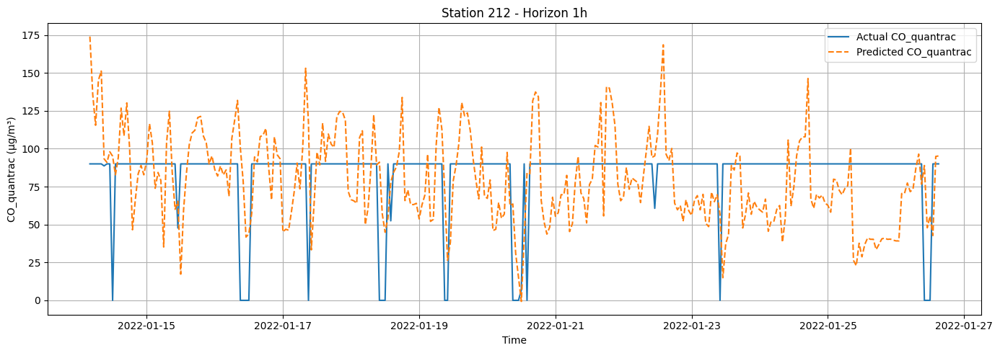

hour = 24


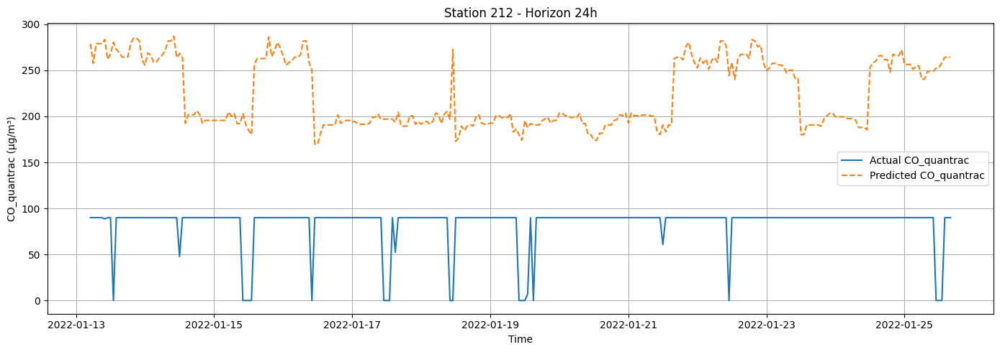

hour = 48


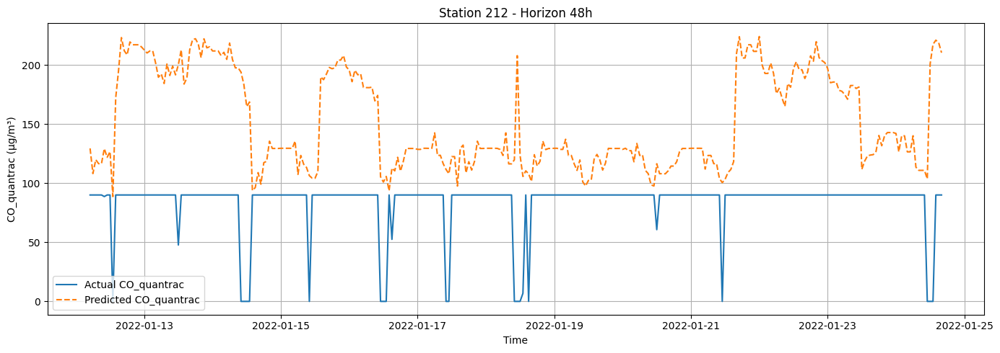

hour = 72


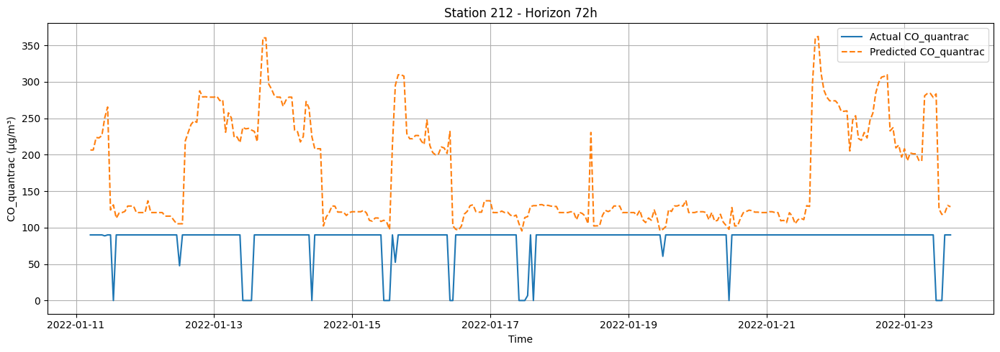

station_id = 213
hour = 1


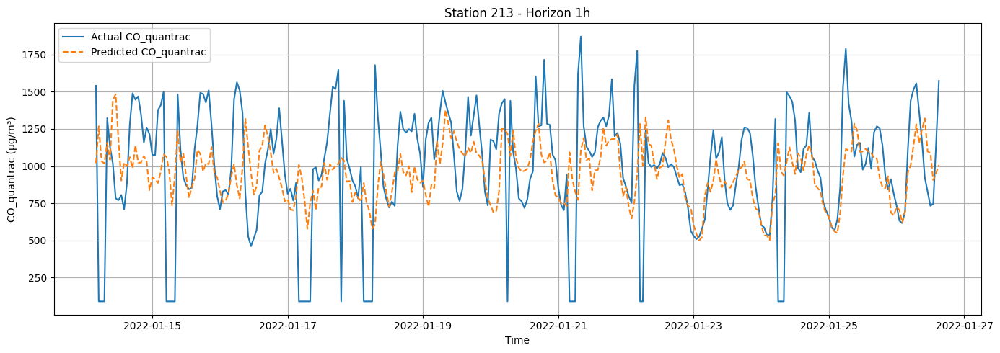

hour = 24


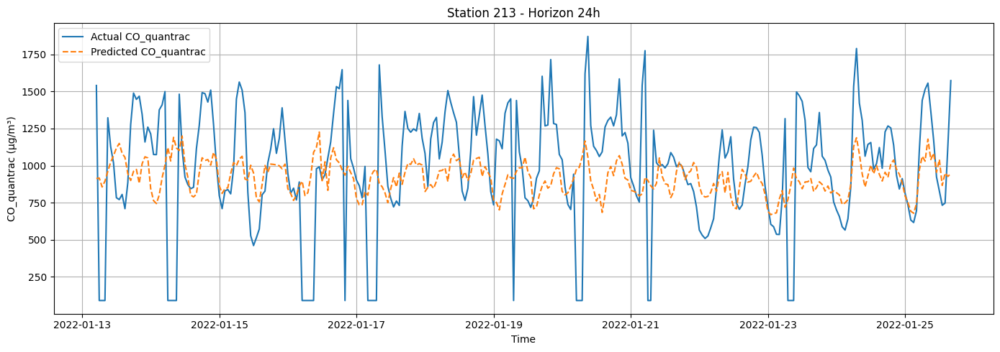

hour = 48


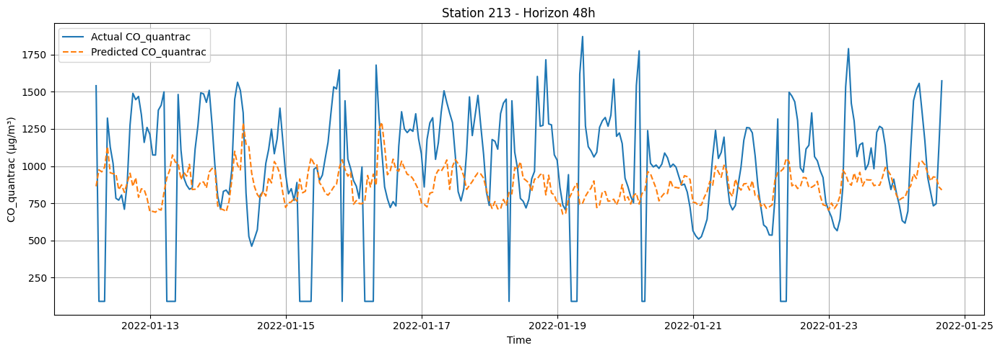

hour = 72


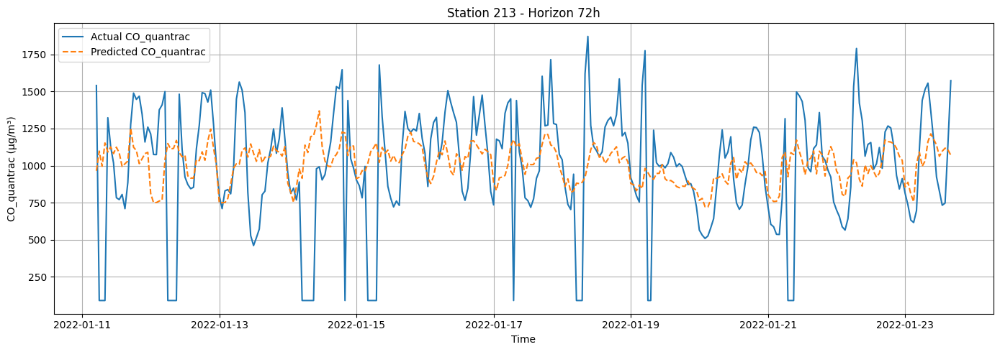

station_id = 214
hour = 1


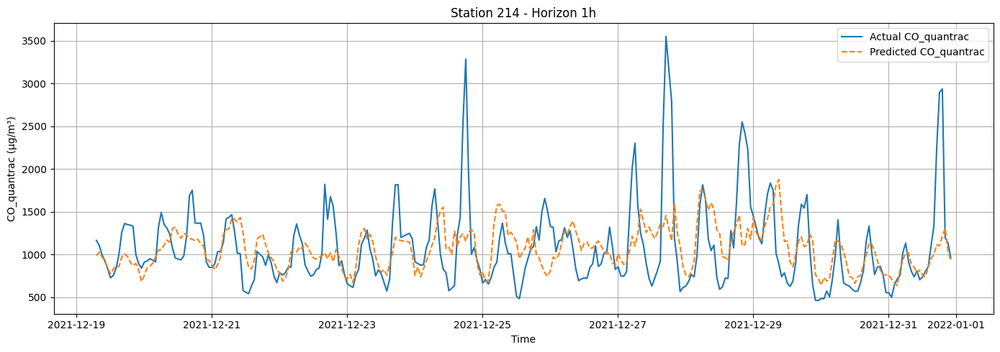

hour = 24


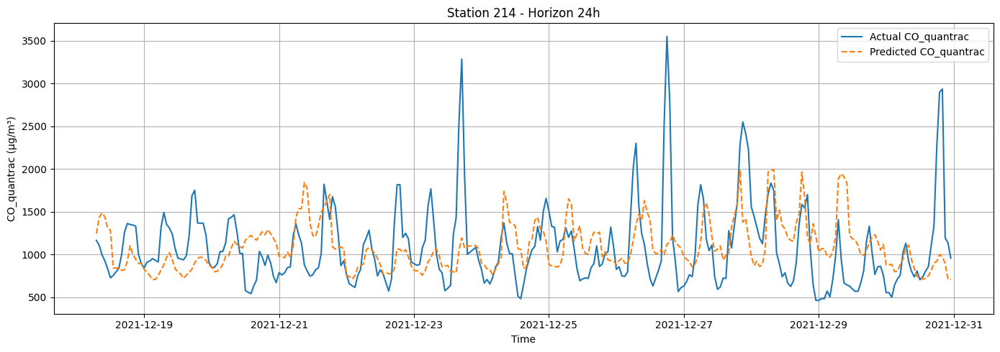

hour = 48


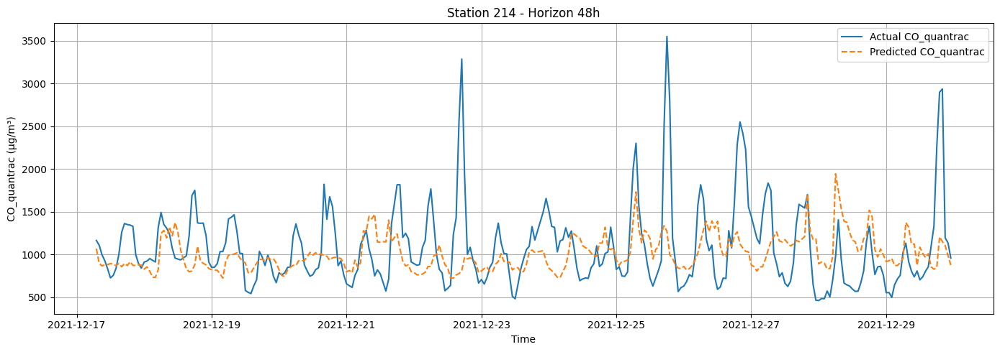

hour = 72


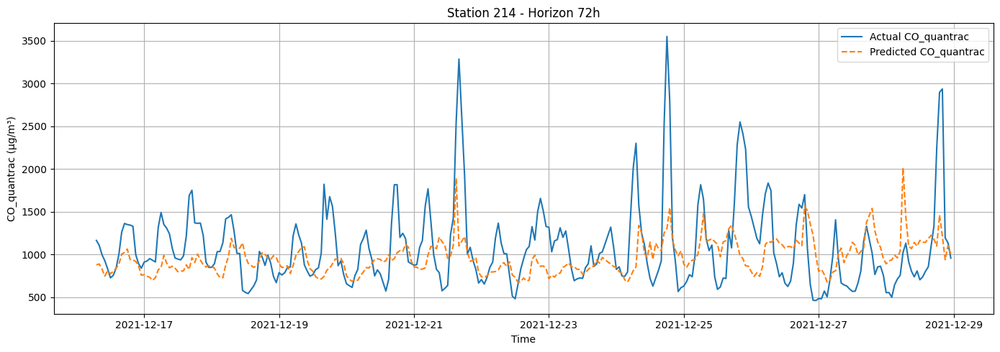

station_id = 215
hour = 1


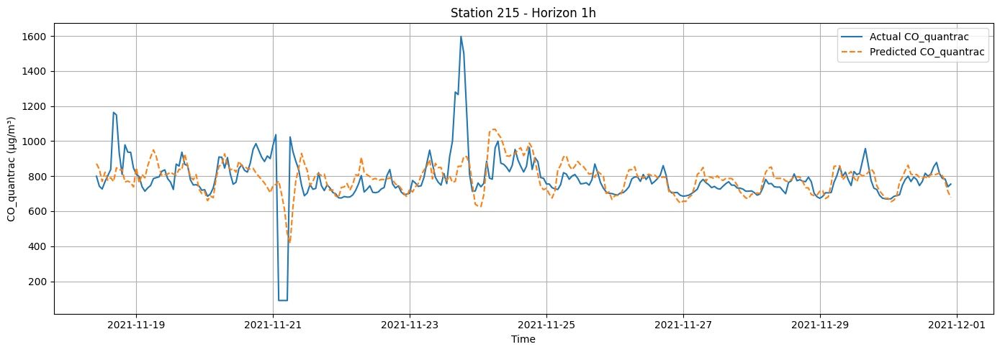

hour = 24


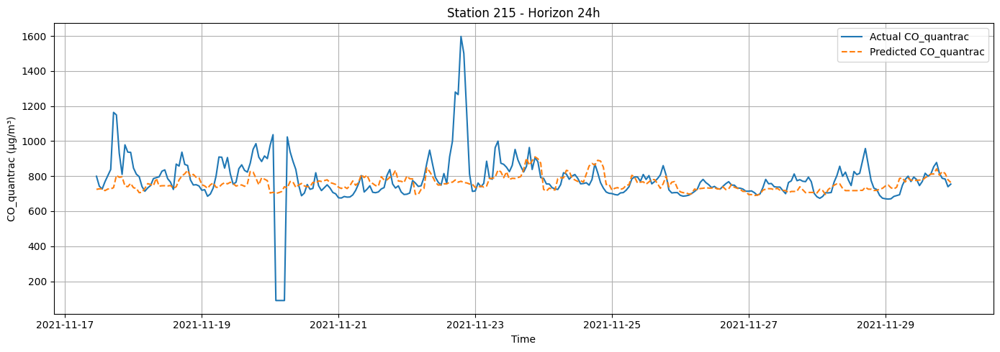

hour = 48


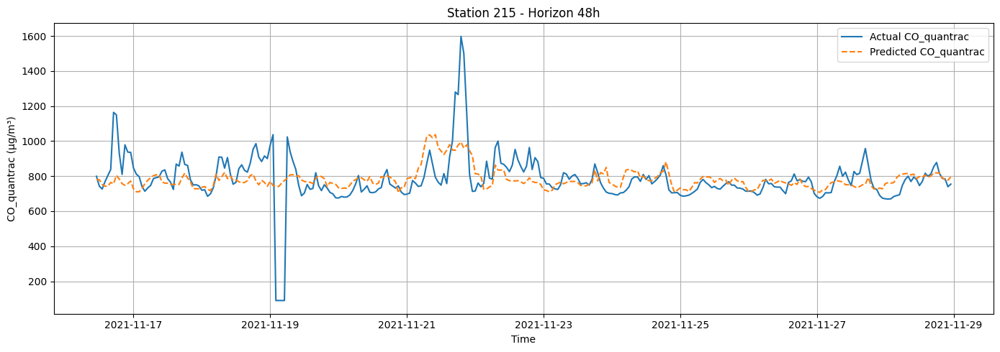

hour = 72


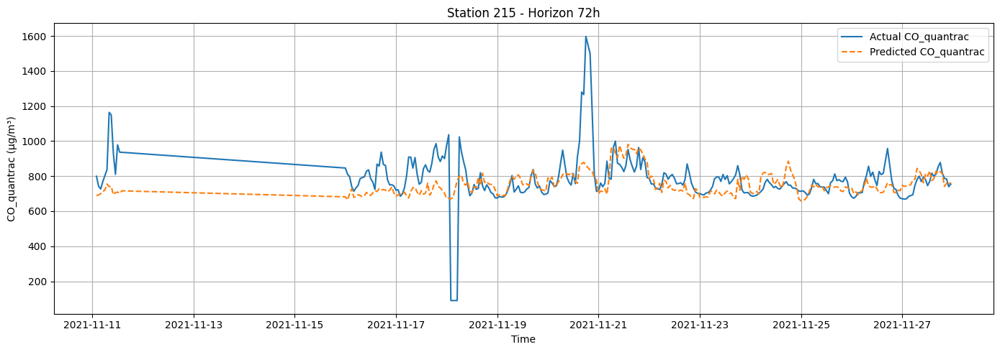

station_id = 216
hour = 1


In [ ]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in [1, 24, 48, 72]:
        print(f"hour = {hour}")
        plot_timeseries_example(df_co, co_models_by_h[hour], horizon_h=hour, station_id=int(station_id), target_col=label, LIGHTGBM_DIR=LIGHTGBM_DIR)